In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage.interpolation import shift
from matplotlib.patches import Polygon
import matplotlib as mpl
import pandas as pd


import seaborn as sns
import statsmodels.formula.api as smf
from sklearn import preprocessing
from sklearn.preprocessing import minmax_scale,scale,normalize

from numpy import polyder
#import skimage as sk
import math

import scipy as sc
from scipy import interpolate 


#from skimage import measure 
#from skimage import io
#from skimage import feature
#from skimage import filters

#from skimage.morphology import medial_axis, skeletonize, skeletonize_3d
#from skimage.morphology import skeletonize_3d
#from skimage import data
#from skimage.util import invert

from PIL import ImageFilter
from PIL import Image, ImageDraw

In [522]:
filename1 = '4_4C_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file1 = h5py.File(filename1,'r')

filename2 = '4_4A_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file2 = h5py.File(filename2,'r')

filename3 = '52_8A_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file3 = h5py.File(filename3,'r')

filename4 = '12_3C_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file4 = h5py.File(filename4,'r')

filename5 = '46_12A_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file5 = h5py.File(filename5,'r')

filename6 = '5_8B_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file6 = h5py.File(filename6,'r')

filename7 = '5_8C_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file7 = h5py.File(filename7,'r')

filename7_noTF = '5_8C_rzrb_L4.TF.5_8C_rzrb_L4.h5'
h5_file7_noTF = h5py.File(filename7_noTF,'r')


filename8 = '1_7C_rzrb_L4.TF.46_12A_rzrb_L4.h5'
h5_file8 = h5py.File(filename8,'r')


filename9 = 'DS1_mouse_rzrb.TF.46_12A_rzrb_L4.h5'
h5_file9 = h5py.File(filename9,'r')
filename9_TFDS2 = 'DS1_mouse_rzrb.TF.DS2_mouse_rzrb.h5'
h5_file9_TFDS2 = h5py.File(filename9_TFDS2,'r')


filename10 = 'DS2_mouse_rzrb.TF.46_12A_rzrb_L4.h5'
h5_file10 = h5py.File(filename10,'r')
filename10_noTF = 'DS2_mouse_rzrb.TF.DS2_mouse_rzrb.h5'
h5_file10_noTF = h5py.File(filename10_noTF,'r')



filename11 = 'DS3_mouse_rzrb.TF.46_12A_rzrb_L4.h5'
h5_file11 = h5py.File(filename11,'r')
filename11_TFDS2 = 'DS3_mouse_rzrb.TF.DS2_mouse_rzrb.h5'
h5_file11_TFDS2 = h5py.File(filename11_TFDS2,'r')

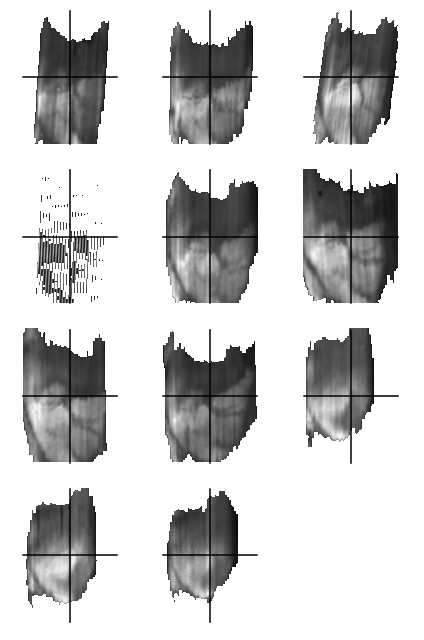

In [9]:
### Plot all ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys
import os

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    MaskTemp = np.ones(Z.shape)
    M = MaskTemp.copy()
    for i,j in enumerate(fnames):
        z = getZ(j)
        m = MaskTemp.copy()
        m2 = getMask(z, T=thresh)
        m[m2]=np.nan
        Z = np.dstack([Z,z])
        M = np.dstack([M,m])
    return Z[:,:,1:], M[:,:,1:]

#loc= 'Data/Mouse_in_Vole_Space_RZRB'
#loc= 'Data/Mouse_Id2/Layer 6'
loc= 'ish_data/Vole_RZRB'
#loc= 'Data/Vole_Id2/Layer 6'
#loc= 'Data/Vole_Id2/Layer 2-3'
#loc= 'Data/Vole_Id2/Layer 5'


D = os.listdir(loc)
fnames = D.copy()
for i,f in enumerate(D):
    D[i] = loc+'/'+f

loc = 'comb'

D = [filename1,filename2,filename3,
    filename4,filename5,filename6,
    filename7,filename8,filename9,
    filename10,filename11]

fnames = D.copy()

#loc = 'comb'
#D = ['Data/Mouse_Id2/Layer 2-3/DS4_mouse_id2_L23.h5',
#     'Data/Mouse_Id2/Layer 2-3/DS5_mouse_id2_L23.h5',
#     'Data/Mouse_Id2/Layer 2-3/DS6_mouse_id2_L23.h5',
#     'Data/Mouse_Id2/Layer 5/DS4_mouse_id2_L5.h5',
#     'Data/Mouse_Id2/Layer 5/DS5_mouse_id2_L5.h5',
#     'Data/Mouse_Id2/Layer 5/DS6_mouse_id2_L5.h5',
#     'Data/Mouse_Id2/Layer 6/DS4_mouse_id2_L6.h5',
#     'Data/Mouse_Id2/Layer 6/DS5_mouse_id2_L6.h5',
#    'Data/Mouse_Id2/Layer 6/DS6_mouse_id2_L6.h5']
#fnames = D.copy()


#loc = 'comb'
#D = ['Data/Vole_Id2/Layer 2-3/66_6B_id2_L23.h5',
#     'Data/Vole_Id2/Layer 2-3/65_8A_id2_L23.h5',
#     'Data/Vole_Id2/Layer 2-3/64_8A_id2_L23.h5',
#     'Data/Vole_Id2/Layer 5/66_6B_id2_L5.h5',
#     'Data/Vole_Id2/Layer 5/65_8A_id2_L5.h5',
#     'Data/Vole_Id2/Layer 5/64_8A_id2_L5.h5',
#     'Data/Vole_Id2/Layer 6/66_6B_id2_L6.h5',
#     'Data/Vole_Id2/Layer 6/65_8A_id2_L6.h5',
#     'Data/Vole_Id2/Layer 6/64_8A_id2_L6.h5']
#fnames = D.copy()

Z, M = combi(D, 0.00074)


# PLOTTING
cmp = 'gray'
ax1 = Z.shape[1]
ax2 = Z.shape[0]
ax = True

#F = pl.figure(figsize=(9,6))
F = pl.figure(figsize=(6,9))

for i in range(len(D)):
    f = F.add_subplot(4,3,i+1)
    f.imshow(Z[:,:,i]*M[:,:,i],cmap=cmp)
    if(ax):
        f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
        f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
    f.axis('equal')
    f.axis('off')
    #f.set_title(fnames[i])


F.tight_layout()
F.savefig(loc+'_all.pdf',dpi=600)

pl.show()


0.5814343021946258 pm 0.09548154708913639
0.7545056611807062 pm 0.07617295117561271
0.2627691956564169 pm 0.10404395369180197


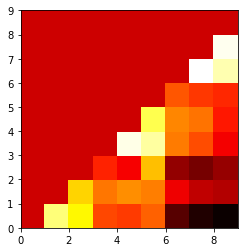

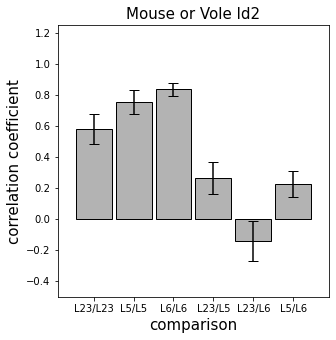

In [11]:
### Pairise3cond ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    BigMask = np.ones(Z.shape)
    for i,j in enumerate(fnames):
        z = getZ(j)
        mask = getMask(z, T=thresh)
        BigMask[mask]=np.nan
        Z = np.dstack([Z,z])
    return Z[:,:,1:], BigMask


D = ['ish_data/Vole_Id2/Layer 2-3/66_6B_id2_L23.h5',
     'ish_data/Vole_Id2/Layer 2-3/65_8A_id2_L23.h5',
     'ish_data/Vole_Id2/Layer 2-3/64_8A_id2_L23.h5',
     'ish_data/Vole_Id2/Layer 5/66_6B_id2_L5.h5',
     'ish_data/Vole_Id2/Layer 5/65_8A_id2_L5.h5',
     'ish_data/Vole_Id2/Layer 5/64_8A_id2_L5.h5',
     'ish_data/Vole_Id2/Layer 6/66_6B_id2_L6.h5',
     'ish_data/Vole_Id2/Layer 6/65_8A_id2_L6.h5',
     'ish_data/Vole_Id2/Layer 6/64_8A_id2_L6.h5']

#D = ['Data/Mouse_Id2/Layer 2-3/DS4_mouse_id2_L23.h5',
#     'Data/Mouse_Id2/Layer 2-3/DS5_mouse_id2_L23.h5',
#     'Data/Mouse_Id2/Layer 2-3/DS6_mouse_id2_L23.h5',
#     'Data/Mouse_Id2/Layer 5/DS4_mouse_id2_L5.h5',
##     'Data/Mouse_Id2/Layer 5/DS5_mouse_id2_L5.h5',
#     'Data/Mouse_Id2/Layer 5/DS6_mouse_id2_L5.h5',
#     'Data/Mouse_Id2/Layer 6/DS4_mouse_id2_L6.h5',
#     'Data/Mouse_Id2/Layer 6/DS5_mouse_id2_L6.h5',
#     'Data/Mouse_Id2/Layer 6/DS6_mouse_id2_L6.h5']

c = [0,0,0,1,1,1,2,2,2] # class to which it belongs


Z, Mask = combi(D, 0.00074)

legit = np.where(1-np.isnan(Mask))


n = Z.shape[2]

SS = np.zeros([n,n])
CC = np.zeros([n,n])


AA = []
BB = []
CC = []
AB = []
AC = []
BC = []

for i in range(n):
    a = Z[:,:,i]
    a = a[legit].flatten()
    suma2 = np.sum(a*a)
    for j in range(i+1,n):
        b = Z[:,:,j]
        b = b[legit].flatten()

        r,p=np.corrcoef(a,b)
        s = r[1]
        SS[i,j] =  s

        if ((c[i]==0)and(c[j]==0)):
            AA = np.hstack([AA,s])
        elif ((c[i]==1)and(c[j]==1)):
            BB = np.hstack([BB,s])
        elif ((c[i]==2)and(c[j]==2)):
            CC = np.hstack([CC,s])
        elif (((c[i]==0)and(c[j]==1)or((c[i]==1)and(c[j]==0)))):
            AB = np.hstack([AB,s])
        elif (((c[i]==0)and(c[j]==2)or((c[i]==2)and(c[j]==0)))):
            AC = np.hstack([AC,s])
        elif (((c[i]==1)and(c[j]==2)or((c[i]==2)and(c[j]==1)))):
            BC = np.hstack([BC,s])
        else:
            print('oops!')

print(str(np.mean(AA))+' pm '+str(np.std(AA)))
print(str(np.mean(BB))+' pm '+str(np.std(BB)))
print(str(np.mean(AB))+' pm '+str(np.std(AB)))


F = pl.figure()

f = F.add_subplot(111)
f.pcolor(SS,cmap='hot')
f.set_aspect(1)




# PLOTTING
minV = -0.5
maxV = +1.25
nbars = 6
wid = 0.9
ax = np.array([-wid, nbars-1+wid, minV, maxV]);


fs = 15

F = pl.figure(figsize=(6,5))
F.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)

# FFA
f = F.add_subplot(111)
f.bar(np.arange(nbars),[np.mean(AA),np.mean(BB),np.mean(CC),np.mean(AB),np.mean(AC), np.mean(BC)],yerr=[np.std(AA),np.std(BB),np.std(CC),np.std(AB),np.std(AC),np.std(BC)],width=wid,color=(0.7,0.7,0.7),edgecolor='black',ecolor='black', capsize=5)


f.axis(ax)
f.set_aspect(np.diff(f.get_xlim())/np.diff(f.get_ylim()))
f.set_xticks(np.arange(nbars))
#f.set_yticks(np.arange(4))
f.set_xticklabels(["L23/L23","L5/L5","L6/L6","L23/L5","L23/L6","L5/L6"])
f.set_title('Mouse or Vole Id2',fontsize=fs)
f.set_ylabel('correlation coefficient',fontsize=fs)
f.set_xlabel('comparison',fontsize=fs)


#F.savefig('MouseCorrs.pdf')

pl.show()





0.8583677072763812 pm 0.0058082502440655525
0.742185079170664 pm 0.10982855668130284
0.5338767731831879 pm 0.08293457419379459


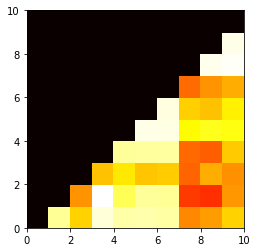

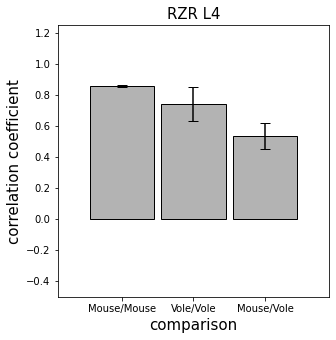

In [536]:
### pariwise2cond ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    BigMask = np.ones(Z.shape)
    for i,j in enumerate(fnames):
        z = getZ(j)
        mask = getMask(z, T=thresh)
        BigMask[mask]=np.nan
        Z = np.dstack([Z,z])
    return Z[:,:,1:], BigMask


#D = [filename1,filename2,filename3,
#    filename5,filename6,
#    filename7,filename8,filename9,
#    filename10,filename11]

#c = [1,1,0,0,0,0,0,0,0] # class to which it belongs


loc = 'comb'

D = [filename1,filename2,filename3,
    filename5,filename6,
    filename7,filename8,filename9_TFDS2,
    filename10_noTF,filename11_TFDS2]

#D = [filename1,filename2,filename3, filename4,
#    filename5,filename6,
#    filename7,filename8,filename9,
#    filename10,filename11]

#D = [filename9_TFDS2,filename10_noTF,filename11_TFDS2]

#c = [0,0,0]
c = [1,1,1,1,1,1,1,0,0,0] # class to which it belongs

fnames = D.copy()


Z, Mask = combi(D, 0.00074)

legit = np.where(1-np.isnan(Mask))


n = Z.shape[2]

SS = np.zeros([n,n])
CC = np.zeros([n,n])


AA = []
BB = []
AB = []

for i in range(n):
    a = Z[:,:,i]
    a = a[legit].flatten()
    suma2 = np.sum(a*a)
    for j in range(i+1,n):
        b = Z[:,:,j]
        b = b[legit].flatten()

        r,p=np.corrcoef(a,b)
        s = r[1]
        SS[i,j] =  s

        if((c[i]==0)and(c[j]==0)):
            AA = np.hstack([AA,s])
        elif ((c[i]==1)and(c[j]==1)):
            BB = np.hstack([BB,s])
        else:
            AB = np.hstack([AB,s])

print(str(np.mean(AA))+' pm '+str(np.std(AA)))
print(str(np.mean(BB))+' pm '+str(np.std(BB)))
print(str(np.mean(AB))+' pm '+str(np.std(AB)))


F = pl.figure()

f = F.add_subplot(111)
f.pcolor(SS,cmap='hot')
f.set_aspect(1)


F.savefig('MouseVolRZRCorr_matrix.pdf')

# PLOTTING
minV = -0.5
maxV = +1.25
nbars = 3
wid = 0.9
ax = np.array([-wid, nbars-1+wid, minV, maxV]);


fs = 15

F = pl.figure(figsize=(6,5))
F.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)

# FFA
f = F.add_subplot(111)
f.bar(np.arange(nbars),[np.mean(AA),np.mean(BB),np.mean(AB)],yerr=[np.std(AA),np.std(BB),np.std(AB)],width=wid,color=(0.7,0.7,0.7),edgecolor='black',ecolor='black', capsize=5)


f.axis(ax)
f.set_aspect(np.diff(f.get_xlim())/np.diff(f.get_ylim()))
f.set_xticks(np.arange(nbars))
#f.set_yticks(np.arange(4))
f.set_xticklabels(["Mouse/Mouse","Vole/Vole","Mouse/Vole"])
f.set_title('RZR L4',fontsize=fs)
f.set_ylabel('correlation coefficient',fontsize=fs)
f.set_xlabel('comparison',fontsize=fs)



F.savefig('MouseVolRZRCorrs.pdf')
pl.show()





In [729]:
# ID2: # 
# These are mapped on to individual layers of 65_8A_LX

# load in layer 6 
filename12_6 = '1_10E_id2_L6.TF.65_8A_id2_L6.h5'
h5_file12_6 = h5py.File(filename12_6,'r')

filename13_6 = '10_3B_id2_L6.TF.65_8A_id2_L6.h5'
h5_file13_6 = h5py.File(filename13_6,'r')

filename14_6 = '12_3A_id2_L6.TF.65_8A_id2_L6.h5'
h5_file14_6 = h5py.File(filename14_6,'r')

filename15_6 = '64_8A_id2_L6.TF.65_8A_id2_L6.h5'
h5_file15_6 = h5py.File(filename15_6,'r')

filename16_6 = '65_8A_id2_L6.TF.65_8A_id2_L6.h5'
h5_file16_6 = h5py.File(filename16_6,'r')

filename17_6 = '65_7E_id2_L6.TF.65_8A_id2_L6.h5'
h5_file17_6 = h5py.File(filename17_6,'r')
filename17_6_noTF = '65_7E_id2_L6.TF.65_7E_id2_L6.h5'
h5_file17_6_noTF = h5py.File(filename17_6_noTF,'r')

filename18_6 = '66_6B_id2_L6.TF.65_8A_id2_L6.h5'
h5_file18_6 = h5py.File(filename18_6,'r')

filename19_6 = 'DS4_mouse_id2.TF.65_8A_id2_L6.h5'
h5_file19_6 = h5py.File(filename19_6,'r')
filename19_6_noTF = 'DS4_mouse_id2.TF.DS4_mouse_id2.h5'
h5_file19_6_noTF = h5py.File(filename19_6_noTF,'r')

filename20_6 = 'DS5_mouse_id2_L6.TF.65_8A_id2_L6.h5'
h5_file20_6 = h5py.File(filename20_6,'r')

filename21_6 = 'DS6_mouse_id2_L6.TF.65_8A_id2_L6.h5'
h5_file121_6 = h5py.File(filename21_6,'r')


# load in layer 5

filename12_5 = '1_10E_id2_L5.TF.65_8A_id2_L5.h5'
h5_file12_5 = h5py.File(filename12_5,'r')

filename13_5 = '10_3B_id2_L5.TF.65_8A_id2_L5.h5'
h5_file13_5 = h5py.File(filename13_5,'r')

filename14_5 = '12_3A_id2_L5.TF.65_8A_id2_L5.h5'
h5_file14_5 = h5py.File(filename14_5,'r')

filename15_5 = '64_8A_id2_L5.TF.65_8A_id2_L5.h5'
h5_file15_5 = h5py.File(filename15_5,'r')

filename16_5 = '65_8A_id2_L5.TF.65_8A_id2_L5.h5'
h5_file16_5 = h5py.File(filename16_5,'r')

filename17_5 = '65_7E_id2_L5.TF.65_8A_id2_L5.h5'
h5_file17_5 = h5py.File(filename17_5,'r')
filename17_5_noTF = '65_7E_id2_L5.TF.65_7E_id2_L5.h5'
h5_file17_5_noTF = h5py.File(filename17_5_noTF,'r')

filename18_5 = '66_6B_id2_L5.TF.65_8A_id2_L5.h5'
h5_file18_5 = h5py.File(filename18_5,'r')

filename19_5 = 'DS4_mouse_id2_L5.TF.65_8A_id2_L5.h5'
h5_file19_5 = h5py.File(filename19_5,'r')
filename19_5_noTF = 'DS4_mouse_id2_L5.TF.65_8A_id2_L5.h5'
h5_file19_5_noTF = h5py.File(filename19_5_noTF,'r')

filename20_5 = 'DS5_mouse_id2_L5.TF.65_8A_id2_L5.h5'
h5_file20_5 = h5py.File(filename20_5,'r')

filename21_5 = 'DS6_mouse_id2_L5.TF.65_8A_id2_L5.h5'
h5_file121_5 = h5py.File(filename21_5,'r')


# load in layer 2/3

filename12_23 = '1_10E_id2_L23.TF.65_8A_id2_L23.h5'
h5_file12_23 = h5py.File(filename12_23,'r')

filename13_23 = '10_3B_id2_L23.TF.65_8A_id2_L23.h5'
h5_file13_23 = h5py.File(filename13_23,'r')

filename14_23 = '12_3A_id2_L23.TF.65_8A_id2_L23.h5'
h5_file14_23 = h5py.File(filename14_23,'r')

filename15_23 = '64_8A_id2_L23.TF.65_8A_id2_L23.h5'
h5_file15_23 = h5py.File(filename15_23,'r')

filename16_23 = '65_8A_id2_L23.TF.65_8A_id2_L23.h5'
h5_file16_23 = h5py.File(filename16_23,'r')

filename17_23 = '65_7E_id2_L23.TF.65_8A_id2_L23.h5'
h5_file17_23 = h5py.File(filename17_23,'r')
filename17_23_noTF = '65_7E_id2_L23.TF.65_8A_id2_L23.h5'
h5_file17_23_noTF = h5py.File(filename17_23_noTF,'r')

filename18_23 = '66_6B_id2_L23.TF.65_8A_id2_L23.h5'
h5_file18_23 = h5py.File(filename18_23,'r')

filename19_23 = 'DS4_mouse_id2_L23.TF.65_8A_id2_L23.h5'
h5_file19_23 = h5py.File(filename19_23,'r')
filename19_23_noTF = 'DS4_mouse_id2_L23.TF.DS4_mouse_id2_L23.h5'
h5_file19_23_noTF = h5py.File(filename19_23_noTF,'r')

filename20_23 = 'DS5_mouse_id2_L23.TF.65_8A_id2_L23.h5'
h5_file20_23 = h5py.File(filename20_23,'r')

filename21_23 = 'DS6_mouse_id2_L23.TF.65_8A_id2_L23.h5'
h5_file121_23 = h5py.File(filename21_23,'r')

In [34]:
# ID2: # 
# These are all mapped specifically to 65_8A_L23.h5

# load in layer 6 
filename12_6 = '1_10E_id2_L6.TF.65_8A_id2_L23.h5'
h5_file12_6 = h5py.File(filename12_6,'r')

filename13_6 = '10_3B_id2_L6.TF.65_8A_id2_L23.h5'
h5_file13_6 = h5py.File(filename13_6,'r')

filename14_6 = '12_3A_id2_L6.TF.65_8A_id2_L23.h5'
h5_file14_6 = h5py.File(filename14_6,'r')

filename15_6 = '64_8A_id2_L6.TF.65_8A_id2_L23.h5'
h5_file15_6 = h5py.File(filename15_6,'r')

filename16_6 = '65_8A_id2_L6.TF.65_8A_id2_L23.h5'
h5_file16_6 = h5py.File(filename16_6,'r')

filename17_6 = '65_7E_id2_L6.TF.65_8A_id2_L23.h5'
h5_file17_6 = h5py.File(filename17_6,'r')

filename18_6 = '66_6B_id2_L6.TF.65_8A_id2_L23.h5'
h5_file18_6 = h5py.File(filename18_6,'r')

filename19_6 = 'DS4_mouse_id2.TF.65_8A_id2_L23.h5'
h5_file19_6 = h5py.File(filename19_6,'r')

filename20_6 = 'DS5_mouse_id2_L6.TF.65_8A_id2_L23.h5'
h5_file20_6 = h5py.File(filename20_6,'r')

filename21_6 = 'DS6_mouse_id2_L6.TF.65_8A_id2_L23.h5'
h5_file121_6 = h5py.File(filename21_6,'r')


# load in layer 5

filename12_5 = '1_10E_id2_L5.TF.65_8A_id2_L23.h5'
h5_file12_5 = h5py.File(filename12_5,'r')

filename13_5 = '10_3B_id2_L5.TF.65_8A_id2_L23.h5'
h5_file13_5 = h5py.File(filename13_5,'r')

filename14_5 = '12_3A_id2_L5.TF.65_8A_id2_L23.h5'
h5_file14_5 = h5py.File(filename14_5,'r')

filename15_5 = '64_8A_id2_L5.TF.65_8A_id2_L23.h5'
h5_file15_5 = h5py.File(filename15_5,'r')

filename16_5 = '65_8A_id2_L5.TF.65_8A_id2_L23.h5'
h5_file16_5 = h5py.File(filename16_5,'r')

filename17_5 = '65_7E_id2_L5.TF.65_8A_id2_L23.h5'
h5_file17_5 = h5py.File(filename17_5,'r')

filename18_5 = '66_6B_id2_L5.TF.65_8A_id2_L23.h5'
h5_file18_5 = h5py.File(filename18_5,'r')

filename19_5 = 'DS4_mouse_id2_L5.TF.65_8A_id2_L23.h5'
h5_file19_5 = h5py.File(filename19_5,'r')

filename20_5 = 'DS5_mouse_id2_L5.TF.65_8A_id2_L23.h5'
h5_file20_5 = h5py.File(filename20_5,'r')

filename21_5 = 'DS6_mouse_id2_L5.TF.65_8A_id2_L23.h5'
h5_file121_5 = h5py.File(filename21_5,'r')


# load in layer 2/3

filename12_23 = '1_10E_id2_L23.TF.65_8A_id2_L23.h5'
h5_file12_23 = h5py.File(filename12_23,'r')

filename13_23 = '10_3B_id2_L23.TF.65_8A_id2_L23.h5'
h5_file13_23 = h5py.File(filename13_23,'r')

filename14_23 = '12_3A_id2_L23.TF.65_8A_id2_L23.h5'
h5_file14_23 = h5py.File(filename14_23,'r')

filename15_23 = '64_8A_id2_L23.TF.65_8A_id2_L23.h5'
h5_file15_23 = h5py.File(filename15_23,'r')

filename16_23 = '65_8A_id2_L23.TF.65_8A_id2_L23.h5'
h5_file16_23 = h5py.File(filename16_23,'r')

filename17_23 = '65_7E_id2_L23.TF.65_8A_id2_L23.h5'
h5_file17_23 = h5py.File(filename17_23,'r')

filename18_23 = '66_6B_id2_L23.TF.65_8A_id2_L23.h5'
h5_file18_23 = h5py.File(filename18_23,'r')

filename19_23 = 'DS4_mouse_id2_L23.TF.65_8A_id2_L23.h5'
h5_file19_23 = h5py.File(filename19_23,'r')

filename20_23 = 'DS5_mouse_id2_L23.TF.65_8A_id2_L23.h5'
h5_file20_23 = h5py.File(filename20_23,'r')

filename21_23 = 'DS6_mouse_id2_L23.TF.65_8A_id2_L23.h5'
h5_file121_23 = h5py.File(filename21_23,'r')

# Plot layer 2/3, 5, or 6 maps 

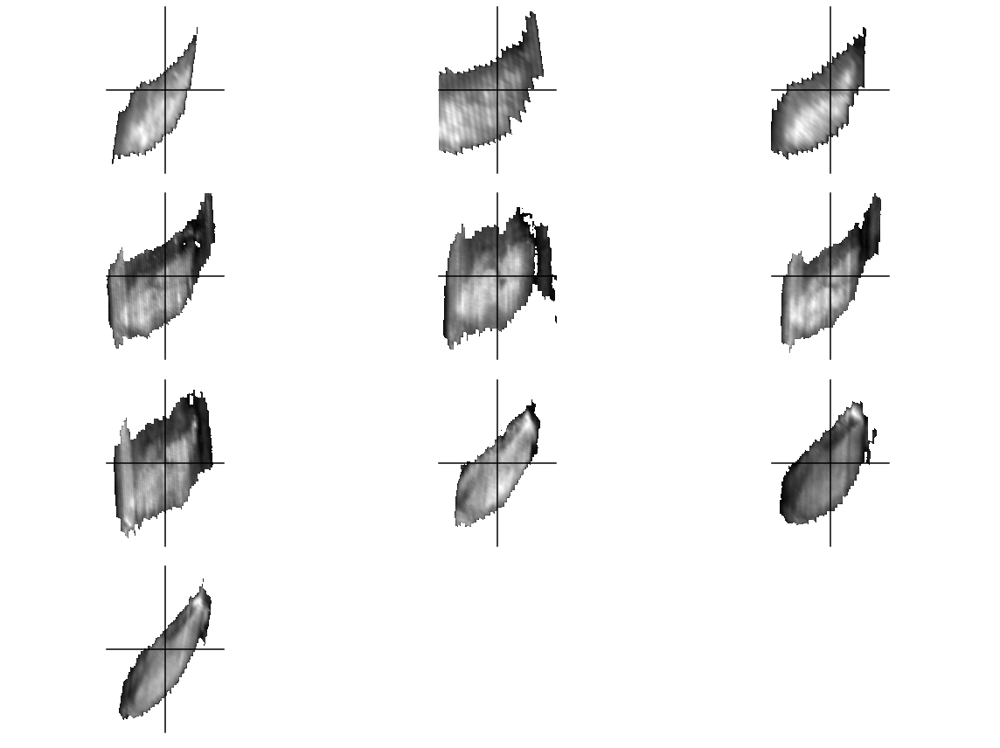

In [35]:

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    MaskTemp = np.ones(Z.shape)
    M = MaskTemp.copy()
    for i,j in enumerate(fnames):
        z = getZ(j)
        m = MaskTemp.copy()
        m2 = getMask(z, T=thresh)
        m[m2]=np.nan
        Z = np.dstack([Z,z])
        M = np.dstack([M,m])
    return Z[:,:,1:], M[:,:,1:]

#loc= 'Data/Mouse_in_Vole_Space_RZRB'
#loc= 'Data/Mouse_Id2/Layer 6'
loc= 'ish_data/Vole_RZRB'
#loc= 'Data/Vole_Id2/Layer 6'
#loc= 'Data/Vole_Id2/Layer 2-3'
#loc= 'Data/Vole_Id2/Layer 5'






D = os.listdir(loc)
fnames = D.copy()
for i,f in enumerate(D):
    D[i] = loc+'/'+f

loc = 'comb'

#D = [filename12_23, filename13_23, filename14_23, filename14_23, filename15_23,
#    filename16_23, filename17_23, filename18_23, filename19_23, filename20_23, filename21_23]

#D = [filename12_5, filename13_5, filename14_5, filename14_5, filename15_5,
#    filename16_5, filename17_5, filename18_5, filename19_5, filename20_5, filename21_5]

D = [filename12_6, filename13_6, filename14_6, filename15_6, filename16_6, 
     filename17_6, filename18_6, filename19_6, filename20_6, filename21_6]

fnames = D.copy()



Z, M = combi(D, 0.00074)


# PLOTTING
cmp = 'gray'
ax1 = Z.shape[1]
ax2 = Z.shape[0]
ax = True

#F = pl.figure(figsize=(9,6))
F = pl.figure(figsize=(16,12))

for i in range(len(D)):
    f = F.add_subplot(4,3,i+1)
    f.imshow(Z[:,:,i]*M[:,:,i],cmap=cmp)
    if(ax):
        f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
        f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
    f.axis('equal')
    f.axis('off')
    #f.set_title(fnames[i])


F.tight_layout()
F.savefig(loc+'_all.pdf',dpi=600)

pl.show()


# Run pairwise for vole 

0.5226548788795781 pm 0.10517962808518175
0.6052674328274225 pm 0.0773584293285694
0.15876449232505965 pm 0.14127929448480891


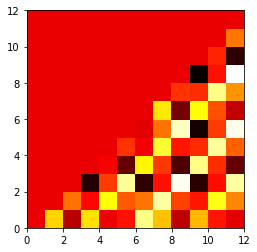

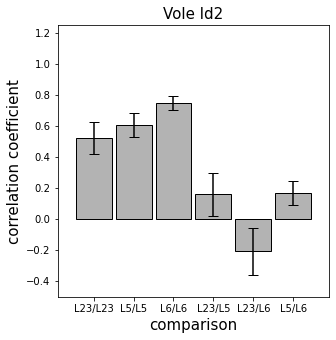

In [710]:

### Pairise3cond ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    BigMask = np.ones(Z.shape)
    for i,j in enumerate(fnames):
        z = getZ(j)
        mask = getMask(z, T=thresh)
        BigMask[mask]=np.nan
        Z = np.dstack([Z,z])
    return Z[:,:,1:], BigMask



### this is all data 

#D = [filename12_23, filename12_5, filename12_6, 
#     filename13_23, filename13_5, filename13_6,
#     filename14_23, filename14_5, filename14_6, 
#     filename15_23, filename15_5, filename15_6,
##     filename16_23, filename16_5, filename16_6,
 #    filename17_23, filename17_5, filename17_6,
 #    filename18_23, filename18_5, filename18_6]
#c = [0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2] #these are the classes





### this is just good data 
D = [filename15_23, filename15_5, filename15_6,
     filename16_23, filename16_5, filename16_6,
     filename17_23, filename17_5, filename17_6,
     filename18_23, filename18_5, filename18_6]

c = [0,1,2, 0,1,2, 0,1,2, 0,1,2] 




### this is just short maps 
#D = [filename12_23, filename12_5, filename12_6, 
#     filename13_23, filename13_5, filename13_6,
#     filename14_23, filename14_5, filename14_6]

#c = [0, 1, 2, 0, 1, 2, 0, 1, 2] 




Z, Mask = combi(D, 0.00074)

legit = np.where(1-np.isnan(Mask))


n = Z.shape[2]

SS = np.zeros([n,n])
CC = np.zeros([n,n])


AA = []
BB = []
CC = []
AB = []
AC = []
BC = []

for i in range(n):
    a = Z[:,:,i]
    a = a[legit].flatten()
    suma2 = np.sum(a*a)
    for j in range(i+1,n):
        b = Z[:,:,j]
        b = b[legit].flatten()

        r,p=np.corrcoef(a,b)
        s = r[1]
        SS[i,j] =  s

        if ((c[i]==0)and(c[j]==0)):
            AA = np.hstack([AA,s])
        elif ((c[i]==1)and(c[j]==1)):
            BB = np.hstack([BB,s])
        elif ((c[i]==2)and(c[j]==2)):
            CC = np.hstack([CC,s])
        elif (((c[i]==0)and(c[j]==1)or((c[i]==1)and(c[j]==0)))):
            AB = np.hstack([AB,s])
        elif (((c[i]==0)and(c[j]==2)or((c[i]==2)and(c[j]==0)))):
            AC = np.hstack([AC,s])
        elif (((c[i]==1)and(c[j]==2)or((c[i]==2)and(c[j]==1)))):
            BC = np.hstack([BC,s])
        else:
            print('oops!')

print(str(np.mean(AA))+' pm '+str(np.std(AA)))
print(str(np.mean(BB))+' pm '+str(np.std(BB)))
print(str(np.mean(AB))+' pm '+str(np.std(AB)))


F = pl.figure()

f = F.add_subplot(111)
f.pcolor(SS,cmap='hot')
f.set_aspect(1)




# PLOTTING
minV = -0.5
maxV = +1.25
nbars = 6
wid = 0.9
ax = np.array([-wid, nbars-1+wid, minV, maxV]);


fs = 15

F = pl.figure(figsize=(6,5))
F.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)

# FFA
f = F.add_subplot(111)
f.bar(np.arange(nbars),[np.mean(AA),np.mean(BB),np.mean(CC),np.mean(AB),np.mean(AC), np.mean(BC)],yerr=[np.std(AA),np.std(BB),np.std(CC),np.std(AB),np.std(AC),np.std(BC)],width=wid,color=(0.7,0.7,0.7),edgecolor='black',ecolor='black', capsize=5)


f.axis(ax)
f.set_aspect(np.diff(f.get_xlim())/np.diff(f.get_ylim()))
f.set_xticks(np.arange(nbars))
#f.set_yticks(np.arange(4))
f.set_xticklabels(["L23/L23","L5/L5","L6/L6","L23/L5","L23/L6","L5/L6"])
f.set_title('Vole Id2',fontsize=fs)
f.set_ylabel('correlation coefficient',fontsize=fs)
f.set_xlabel('comparison',fontsize=fs)


F.savefig('stfsh_Vole_id2_Corrs.pdf')

pl.show()





# Run pairwise for mouse 

0.8534947296916441 pm 0.030789073160077552
0.873094197131611 pm 0.015045331421992873
0.31822033620696133 pm 0.07760423985159612


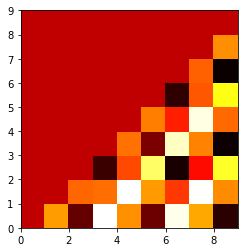

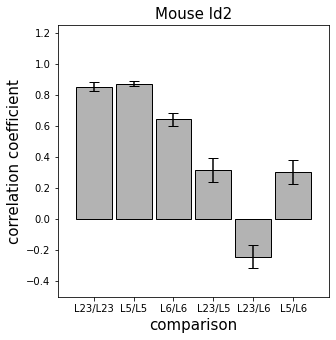

In [711]:


### Pairise3cond ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    BigMask = np.ones(Z.shape)
    for i,j in enumerate(fnames):
        z = getZ(j)
        mask = getMask(z, T=thresh)
        BigMask[mask]=np.nan
        Z = np.dstack([Z,z])
    return Z[:,:,1:], BigMask



### this is all data 

#D = [filename12_23, filename12_5, filename12_6, 
 #   filename13_23, filename13_5, filename13_6,
  #   filename14_23, filename14_5, filename14_6, 
   #  filename15_23, filename15_5, filename15_6,
    # filename16_23, filename16_5, filename16_6,
   #  filename17_23, filename17_5, filename17_6,
   #  filename18_23, filename18_5, filename18_6]
#c = [0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2] #these are the classes





### this is just good data 
D = [filename19_23, filename19_5, filename19_6,
     filename20_23, filename20_5, filename20_6,
     filename21_23, filename21_5, filename21_6]

c = [0,1,2, 0,1,2, 0,1,2] 




### this is just short maps 
#D = [filename12_23, filename12_5, filename12_6, 
#     filename13_23, filename13_5, filename13_6,
#     filename14_23, filename14_5, filename14_6]

#c = [0, 1, 2, 0, 1, 2, 0, 1, 2] 




Z, Mask = combi(D, 0.00074)

legit = np.where(1-np.isnan(Mask))


n = Z.shape[2]

SS = np.zeros([n,n])
CC = np.zeros([n,n])


AA = []
BB = []
CC = []
AB = []
AC = []
BC = []

for i in range(n):
    a = Z[:,:,i]
    a = a[legit].flatten()
    suma2 = np.sum(a*a)
    for j in range(i+1,n):
        b = Z[:,:,j]
        b = b[legit].flatten()

        r,p=np.corrcoef(a,b)
        s = r[1]
        SS[i,j] =  s

        if ((c[i]==0)and(c[j]==0)):
            AA = np.hstack([AA,s])
        elif ((c[i]==1)and(c[j]==1)):
            BB = np.hstack([BB,s])
        elif ((c[i]==2)and(c[j]==2)):
            CC = np.hstack([CC,s])
        elif (((c[i]==0)and(c[j]==1)or((c[i]==1)and(c[j]==0)))):
            AB = np.hstack([AB,s])
        elif (((c[i]==0)and(c[j]==2)or((c[i]==2)and(c[j]==0)))):
            AC = np.hstack([AC,s])
        elif (((c[i]==1)and(c[j]==2)or((c[i]==2)and(c[j]==1)))):
            BC = np.hstack([BC,s])
        else:
            print('oops!')

print(str(np.mean(AA))+' pm '+str(np.std(AA)))
print(str(np.mean(BB))+' pm '+str(np.std(BB)))
print(str(np.mean(AB))+' pm '+str(np.std(AB)))


F = pl.figure()

f = F.add_subplot(111)
f.pcolor(SS,cmap='hot')
f.set_aspect(1)




# PLOTTING
minV = -0.5
maxV = +1.25
nbars = 6
wid = 0.9
ax = np.array([-wid, nbars-1+wid, minV, maxV]);


fs = 15

F = pl.figure(figsize=(6,5))
F.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)

# FFA
f = F.add_subplot(111)
f.bar(np.arange(nbars),[np.mean(AA),np.mean(BB),np.mean(CC),np.mean(AB),np.mean(AC), np.mean(BC)],yerr=[np.std(AA),np.std(BB),np.std(CC),np.std(AB),np.std(AC),np.std(BC)],width=wid,color=(0.7,0.7,0.7),edgecolor='black',ecolor='black', capsize=5)


f.axis(ax)
f.set_aspect(np.diff(f.get_xlim())/np.diff(f.get_ylim()))
f.set_xticks(np.arange(nbars))
#f.set_yticks(np.arange(4))
f.set_xticklabels(["L23/L23","L5/L5","L6/L6","L23/L5","L23/L6","L5/L6"])
f.set_title('Mouse Id2',fontsize=fs)
f.set_ylabel('correlation coefficient',fontsize=fs)
f.set_xlabel('comparison',fontsize=fs)


#F.savefig('MouseCorrs.pdf')

#F.savefig('stfsh_mouse_id2_Corrs.pdf')

pl.show()





# now try all data correlation 

0.6079944445472111 pm 0.13863053072241055
0.5681248351232564 pm 0.17165422990874776
0.23698575675033148 pm 0.12237327072734891


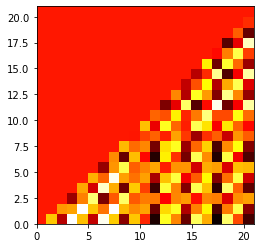

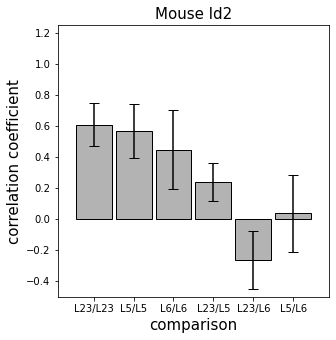

In [45]:
### Pairise3cond ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    BigMask = np.ones(Z.shape)
    for i,j in enumerate(fnames):
        z = getZ(j)
        mask = getMask(z, T=thresh)
        BigMask[mask]=np.nan
        Z = np.dstack([Z,z])
    return Z[:,:,1:], BigMask



### this is all data 

#D = [filename12_23, filename12_5, filename12_6, 
 #   filename13_23, filename13_5, filename13_6,
  #   filename14_23, filename14_5, filename14_6, 
   #  filename15_23, filename15_5, filename15_6,
    # filename16_23, filename16_5, filename16_6,
   #  filename17_23, filename17_5, filename17_6,
   #  filename18_23, filename18_5, filename18_6]
#c = [0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2] #these are the classes

D = [filename19_23, filename19_5, filename19_6, 
     filename20_23, filename20_5, filename20_6,
     filename21_23, filename21_5, filename21_6, 
     filename15_23, filename15_5, filename15_6,
     filename16_23, filename16_5, filename16_6,
     filename17_23, filename17_5, filename17_6,
     filename18_23, filename18_5, filename18_6]
c = [0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2, 0,1,2] #these are the classes


Z, Mask = combi(D, 0.00074)

legit = np.where(1-np.isnan(Mask))


n = Z.shape[2]

SS = np.zeros([n,n])
CC = np.zeros([n,n])


AA = []
BB = []
CC = []
AB = []
AC = []
BC = []

for i in range(n):
    a = Z[:,:,i]
    a = a[legit].flatten()
    suma2 = np.sum(a*a)
    for j in range(i+1,n):
        b = Z[:,:,j]
        b = b[legit].flatten()

        r,p=np.corrcoef(a,b)
        s = r[1]
        SS[i,j] =  s

        if ((c[i]==0)and(c[j]==0)):
            AA = np.hstack([AA,s])
        elif ((c[i]==1)and(c[j]==1)):
            BB = np.hstack([BB,s])
        elif ((c[i]==2)and(c[j]==2)):
            CC = np.hstack([CC,s])
        elif (((c[i]==0)and(c[j]==1)or((c[i]==1)and(c[j]==0)))):
            AB = np.hstack([AB,s])
        elif (((c[i]==0)and(c[j]==2)or((c[i]==2)and(c[j]==0)))):
            AC = np.hstack([AC,s])
        elif (((c[i]==1)and(c[j]==2)or((c[i]==2)and(c[j]==1)))):
            BC = np.hstack([BC,s])
        else:
            print('oops!')

print(str(np.mean(AA))+' pm '+str(np.std(AA)))
print(str(np.mean(BB))+' pm '+str(np.std(BB)))
print(str(np.mean(AB))+' pm '+str(np.std(AB)))


F = pl.figure()

f = F.add_subplot(111)
f.pcolor(SS,cmap='hot')
f.set_aspect(1)




# PLOTTING
minV = -0.5
maxV = +1.25
nbars = 6
wid = 0.9
ax = np.array([-wid, nbars-1+wid, minV, maxV]);


fs = 15

F = pl.figure(figsize=(6,5))
F.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)

# FFA
f = F.add_subplot(111)
f.bar(np.arange(nbars),[np.mean(AA),np.mean(BB),np.mean(CC),np.mean(AB),np.mean(AC), np.mean(BC)],yerr=[np.std(AA),np.std(BB),np.std(CC),np.std(AB),np.std(AC),np.std(BC)],width=wid,color=(0.7,0.7,0.7),edgecolor='black',ecolor='black', capsize=5)


f.axis(ax)
f.set_aspect(np.diff(f.get_xlim())/np.diff(f.get_ylim()))
f.set_xticks(np.arange(nbars))
#f.set_yticks(np.arange(4))
f.set_xticklabels(["L23/L23","L5/L5","L6/L6","L23/L5","L23/L6","L5/L6"])
f.set_title('Mouse Id2',fontsize=fs)
f.set_ylabel('correlation coefficient',fontsize=fs)
f.set_xlabel('comparison',fontsize=fs)


#F.savefig('MouseCorrs.pdf')

pl.show()





0.7713478888370494 pm 0.07593860645217927
0.5032769442900588 pm 0.12680593327415546
0.5232518163838925 pm 0.10852270458485505


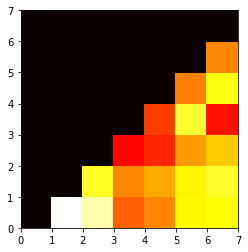

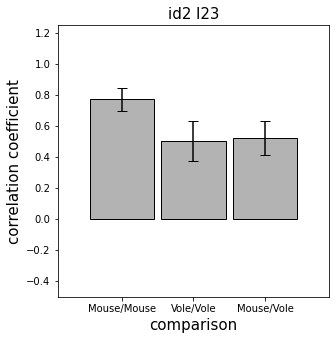

In [719]:
### pariwise2cond ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    BigMask = np.ones(Z.shape)
    for i,j in enumerate(fnames):
        z = getZ(j)
        mask = getMask(z, T=thresh)
        BigMask[mask]=np.nan
        Z = np.dstack([Z,z])
    return Z[:,:,1:], BigMask


#D = [filename1,filename2,filename3,
#    filename5,filename6,
#    filename7,filename8,filename9,
#    filename10,filename11]

#c = [1,1,0,0,0,0,0,0,0] # class to which it belongs


loc = 'comb'

#D = [filename19_23, filename19_5, filename19_6, 
#     filename20_23, filename20_5, filename20_6,
#     filename21_23, filename21_5, filename21_6, 
#     filename15_23, filename15_5, filename15_6,
#     filename16_23, filename16_5, filename16_6,
#     filename17_23, filename17_5, filename17_6,
#     filename18_23, filename18_5, filename18_6]


D = [filename19_23, filename20_23, filename21_23, filename15_23, filename16_23, filename17_23, 
     filename18_23]

#D = [filename19_6, 
#     filename20_6, 
#     filename21_6, 
#     filename15_6, 
#     filename16_6,
#     filename17_6, 
#     filename18_6]

#D = [filename19_5, 
#     filename20_5, 
#     filename21_5, 
#     filename15_5, 
#     filename16_5,
#     filename17_5, 
#     filename18_5]

c= [0,0,0,1,1,1,1] # class to which it belongs

fnames = D.copy()


Z, Mask = combi(D, 0.00074)

legit = np.where(1-np.isnan(Mask))


n = Z.shape[2]

SS = np.zeros([n,n])
CC = np.zeros([n,n])


AA = []
BB = []
AB = []

for i in range(n):
    a = Z[:,:,i]
    a = a[legit].flatten()
    suma2 = np.sum(a*a)
    for j in range(i+1,n):
        b = Z[:,:,j]
        b = b[legit].flatten()

        r,p=np.corrcoef(a,b)
        s = r[1]
        SS[i,j] =  s

        if((c[i]==0)and(c[j]==0)):
            AA = np.hstack([AA,s])
        elif ((c[i]==1)and(c[j]==1)):
            BB = np.hstack([BB,s])
        else:
            AB = np.hstack([AB,s])

print(str(np.mean(AA))+' pm '+str(np.std(AA)))
print(str(np.mean(BB))+' pm '+str(np.std(BB)))
print(str(np.mean(AB))+' pm '+str(np.std(AB)))


F = pl.figure()

f = F.add_subplot(111)
f.pcolor(SS,cmap='hot')
f.set_aspect(1)


#F.savefig('MouseVolRZRCorr_matrix.pdf')

# PLOTTING
minV = -0.5
maxV = +1.25
nbars = 3
wid = 0.9
ax = np.array([-wid, nbars-1+wid, minV, maxV]);


fs = 15

F = pl.figure(figsize=(6,5))
F.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.3, hspace=None)

# FFA
f = F.add_subplot(111)
f.bar(np.arange(nbars),[np.mean(AA),np.mean(BB),np.mean(AB)],yerr=[np.std(AA),np.std(BB),np.std(AB)],width=wid,color=(0.7,0.7,0.7),edgecolor='black',ecolor='black', capsize=5)


f.axis(ax)
f.set_aspect(np.diff(f.get_xlim())/np.diff(f.get_ylim()))
f.set_xticks(np.arange(nbars))
#f.set_yticks(np.arange(4))
f.set_xticklabels(["Mouse/Mouse","Vole/Vole","Mouse/Vole"])
f.set_title('id2 l23',fontsize=fs)
f.set_ylabel('correlation coefficient',fontsize=fs)
f.set_xlabel('comparison',fontsize=fs)



#F.savefig('MouseVol_id2_6_ComboCorrs.pdf')
pl.show()





# Now we are going to print individual maps out, and then create average maps

<AxesSubplot:xlabel='x', ylabel='y'>

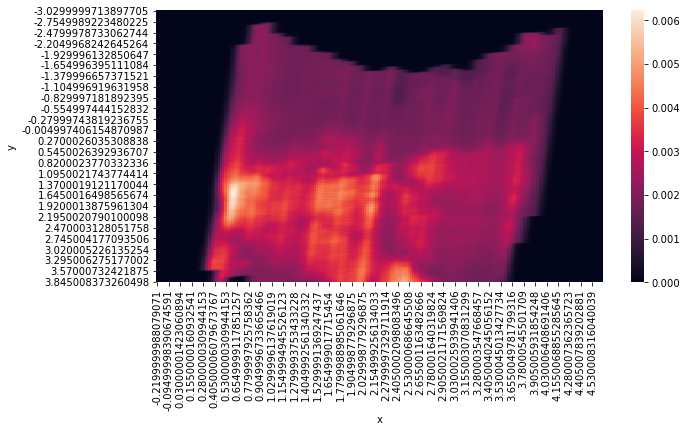

In [50]:
coord_resamp_list = list(h5_file1['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file1['output_map']['twod']['expression_resampled'])

d_frame1 = pd.DataFrame({'case':'one','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot1 = d_frame1.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot1)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

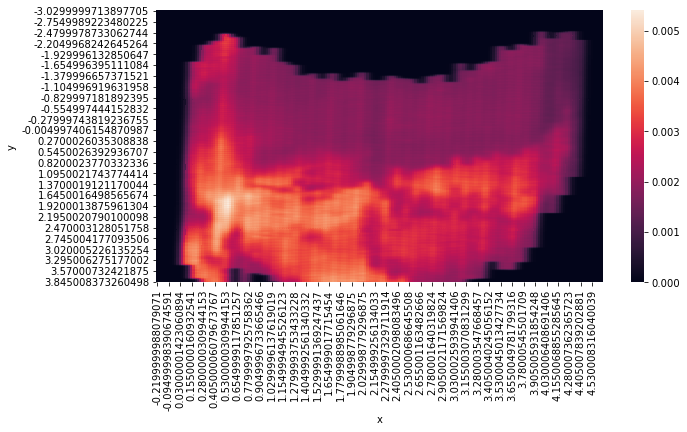

In [51]:
coord_resamp_list = list(h5_file2['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file2['output_map']['twod']['expression_resampled'])

d_frame2 = pd.DataFrame({'case':'two','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot2 = d_frame2.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot2)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

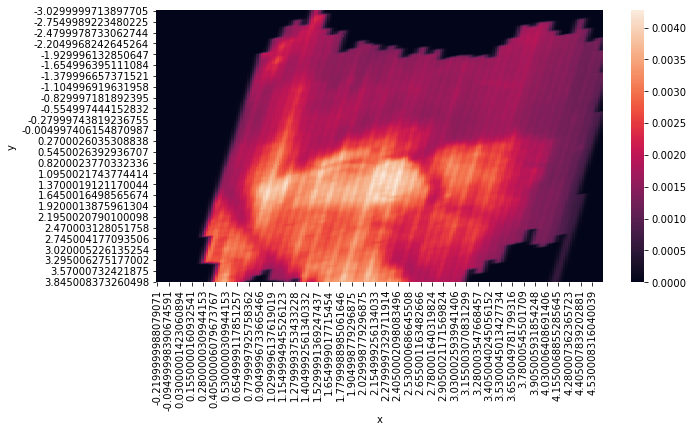

In [52]:
coord_resamp_list = list(h5_file3['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file3['output_map']['twod']['expression_resampled'])

d_frame3 = pd.DataFrame({'case':'three','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot3 = d_frame3.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot3)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

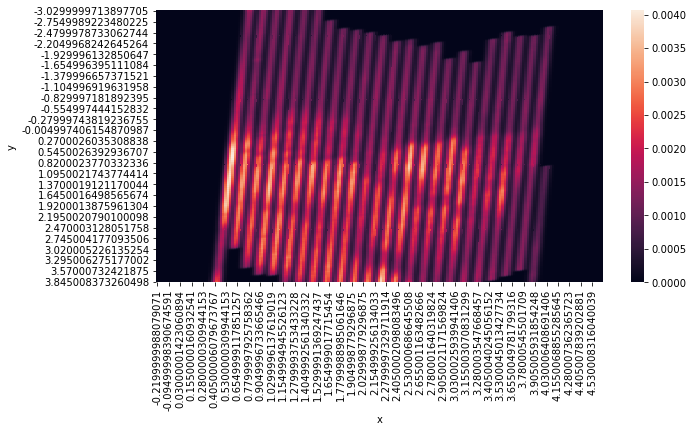

In [53]:
coord_resamp_list = list(h5_file4['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file4['output_map']['twod']['expression_resampled'])

d_frame4 = pd.DataFrame({'case':'four','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot4 = d_frame4.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot4)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

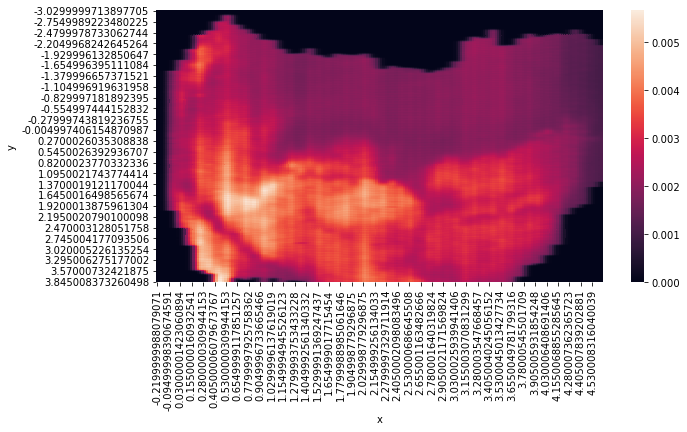

In [54]:
coord_resamp_list = list(h5_file5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file5['output_map']['twod']['expression_resampled'])

d_frame5 = pd.DataFrame({'case':'five','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot5 = d_frame5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

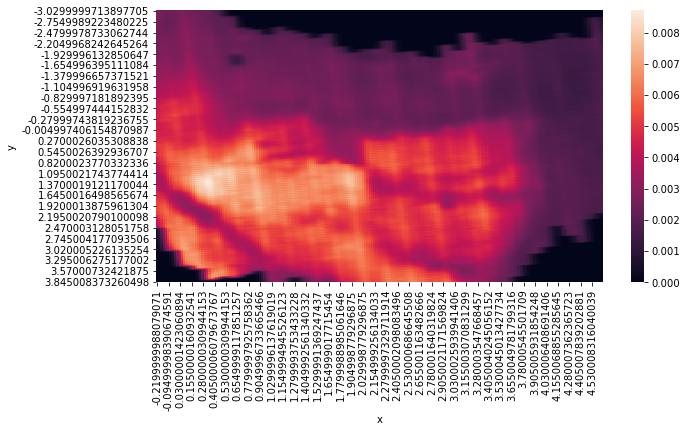

In [55]:
coord_resamp_list = list(h5_file6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file6['output_map']['twod']['expression_resampled'])

d_frame6 = pd.DataFrame({'case':'six','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot6 = d_frame6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

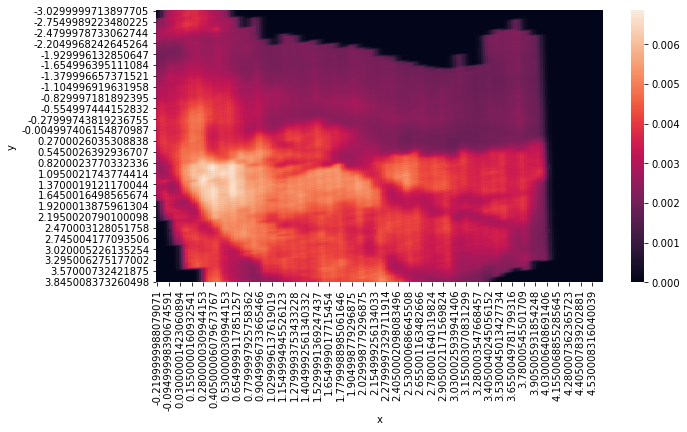

In [56]:
coord_resamp_list = list(h5_file7['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file7['output_map']['twod']['expression_resampled'])

d_frame7 = pd.DataFrame({'case':'seven','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot7 = d_frame7.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot7)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

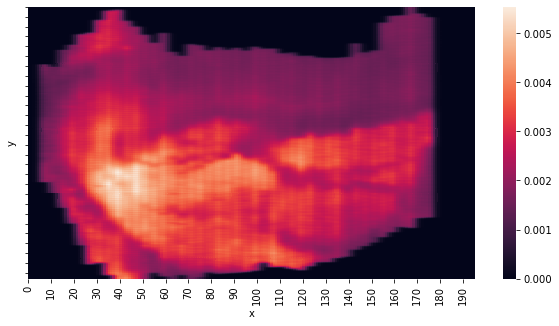

In [499]:
import matplotlib.ticker as ticker

coord_resamp_list = list(h5_file7_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file7_noTF['output_map']['twod']['expression_resampled'])

d_frame7_noTF = pd.DataFrame({'case':'seven','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot7_noTF = d_frame7_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))


#plt.set_xlabels(' ')
#plt.set_ylabels('Percent Error', fontsize = 10)
#plt.set_xticklabels(fontsize = 10)


ax = sns.heatmap(data_pivot7_noTF)#.invert_yaxis()

ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
                 
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

plt.savefig('5_8C_rzrb_for_fig_2_.pdf')
plt.show()

                 
#ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
#ax.savefig('5_8C_rzrb_for_fig_2_.pdf')

<AxesSubplot:xlabel='x', ylabel='y'>

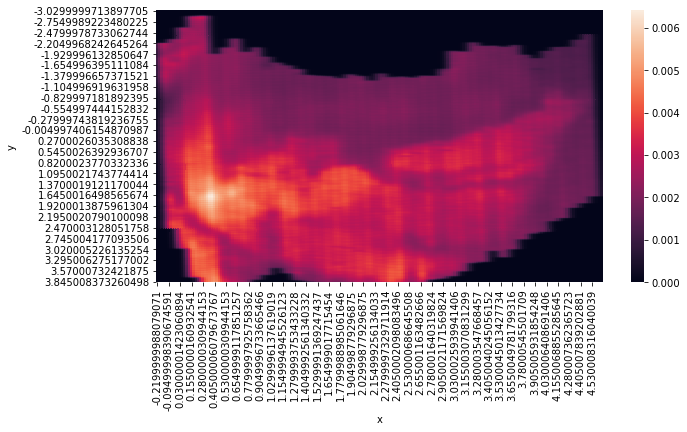

In [57]:
coord_resamp_list = list(h5_file8['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file8['output_map']['twod']['expression_resampled'])

d_frame8 = pd.DataFrame({'case':'eight','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot8 = d_frame8.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot8)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

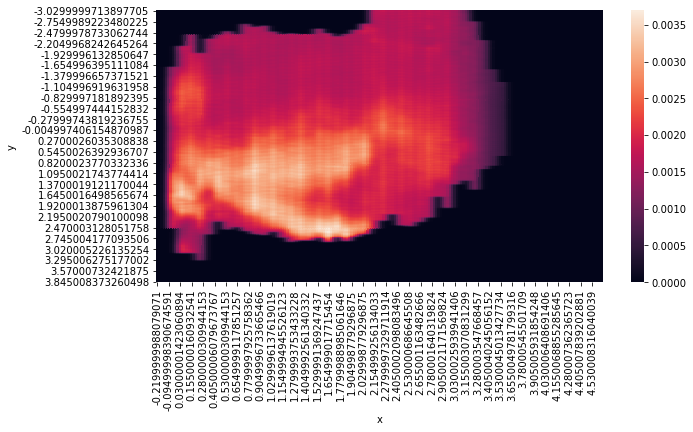

In [58]:
coord_resamp_list = list(h5_file9['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file9['output_map']['twod']['expression_resampled'])

d_frame9 = pd.DataFrame({'case':'nine','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot9 = d_frame9.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot9)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

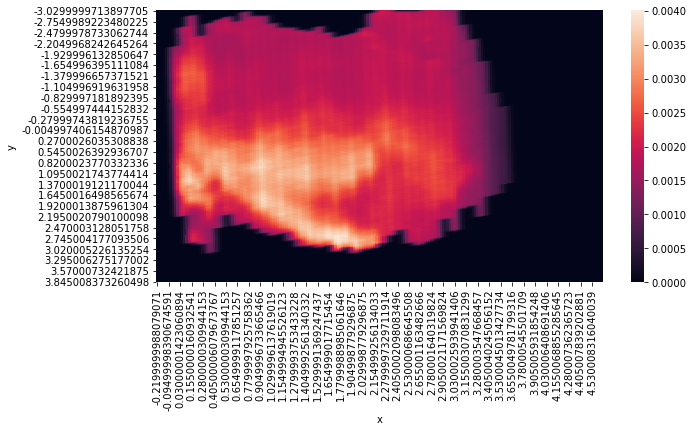

In [567]:
coord_resamp_list = list(h5_file9_TFDS2['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file9_TFDS2['output_map']['twod']['expression_resampled'])

d_frame9_TFDS2 = pd.DataFrame({'case':'nine','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot9_TFDS2 = d_frame9_TFDS2.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot9_TFDS2)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

In [572]:
#th = data_pivot9 - data_pivot9_TFDS2
#sns.heatmap(th)

<AxesSubplot:xlabel='x', ylabel='y'>

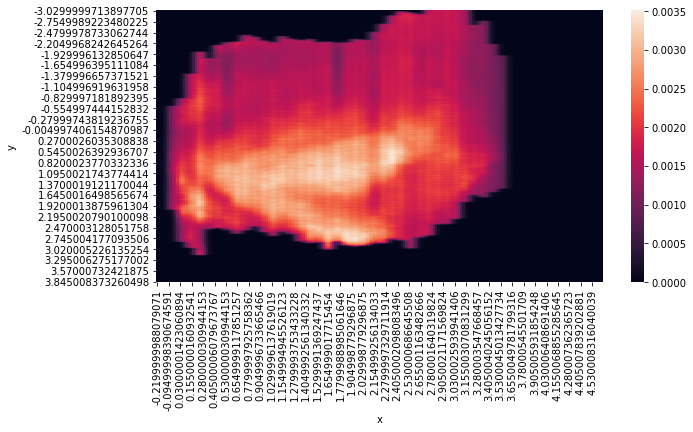

In [59]:
coord_resamp_list = list(h5_file10['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file10['output_map']['twod']['expression_resampled'])

d_frame10 = pd.DataFrame({'case':'ten','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot10 = d_frame10.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot10)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

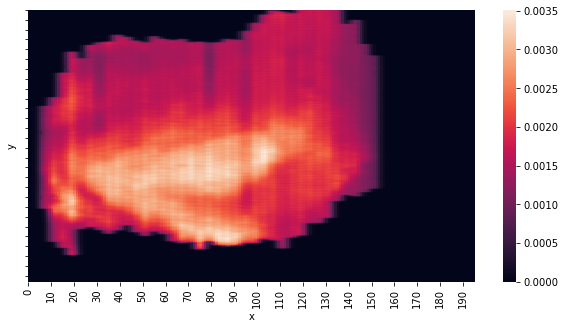

In [501]:
import matplotlib.ticker as ticker

coord_resamp_list = list(h5_file10_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file10_noTF['output_map']['twod']['expression_resampled'])

d_frame10_noTF = pd.DataFrame({'case':'seven','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot10_noTF = d_frame10_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))


#plt.set_xlabels(' ')
#plt.set_ylabels('Percent Error', fontsize = 10)
#plt.set_xticklabels(fontsize = 10)


ax = sns.heatmap(data_pivot10_noTF)#.invert_yaxis()

#ax = sns.boxplot(data = np.random.rand(20,30))

ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
#ax.yaxis.set_major_formatter(ticker.ScalarFormatter())
                 
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

plt.savefig('DS2_rzrb_for_fig_2_.pdf')
plt.show()

                 
#ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
#ax.savefig('5_8C_rzrb_for_fig_2_.pdf')

<AxesSubplot:xlabel='x', ylabel='y'>

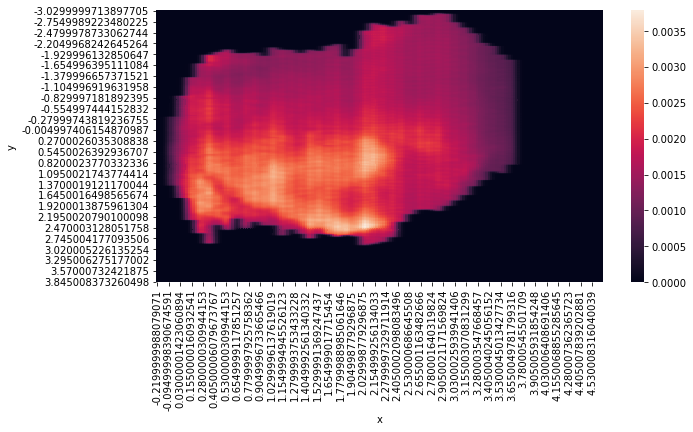

In [60]:
coord_resamp_list = list(h5_file11['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file11['output_map']['twod']['expression_resampled'])

d_frame11 = pd.DataFrame({'case':'eleven','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot11 = d_frame11.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot11)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

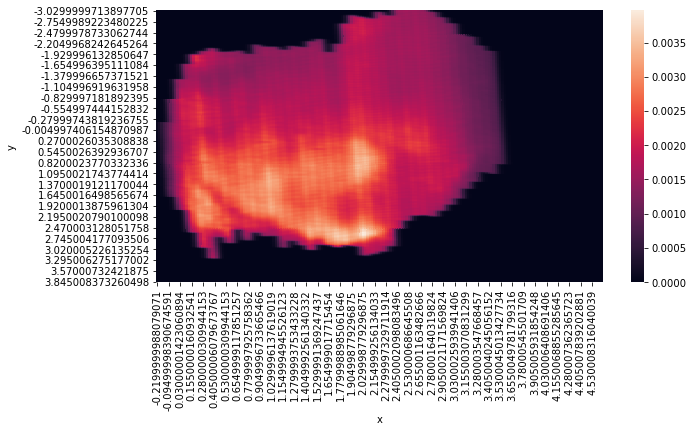

In [568]:
coord_resamp_list = list(h5_file11_TFDS2['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file11_TFDS2['output_map']['twod']['expression_resampled'])

d_frame11_TFDS2 = pd.DataFrame({'case':'eleven','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot11_TFDS2 = d_frame11_TFDS2.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot11_TFDS2)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

# now create average maps

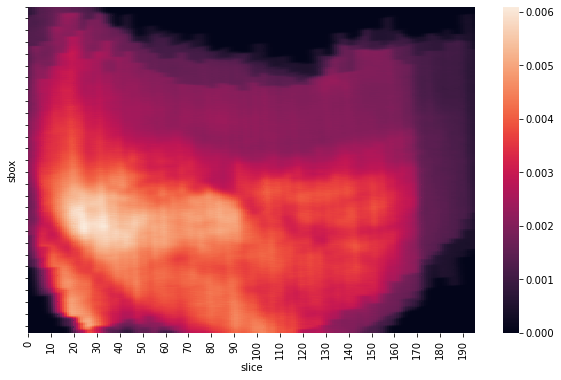

In [574]:


# VOLE 
a = pd.concat([d_frame5,d_frame6, d_frame7, d_frame8])
#a = pd.concat([d_frame1,d_frame2, d_frame3, d_frame4, d_frame5,d_frame6,d_frame7,d_frame8])
#a = pd.concat([d_frame5,d_frame6,d_frame7,d_frame8])
#all_vole = pd.concat([d_frame1,d_frame2,d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)


    
    
aaaa = pd.concat(means_again)
vole_avg = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_vole = vole_avg.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))


ax = sns.heatmap(data_pivot_vole)#.invert_yaxis()

ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
                 
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

plt.savefig('avg_vole_rzrb_for_fig_2_.pdf')
plt.show()
#plt.savefig('stlf_vole_vs.pdf')

In [ ]:
# VOLE Variance

#a = pd.concat([d_frame1,d_frame2, d_frame3, d_frame4, d_frame5,d_frame6,d_frame7,d_frame8])
a = pd.concat([d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].std()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)

    
aaaa = pd.concat(means_again)
vole_std = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot = vole_std.pivot('sbox','slice','values')


plt.figure(figsize=(10, 6))

ax = sns.heatmap(data_pivot)#.invert_yaxis()

ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
                 
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

plt.savefig('avg_vole_var_rzrb_for_fig_2_.pdf')
plt.show()
#plt.savefig('stlf_vole_vs.pdf')

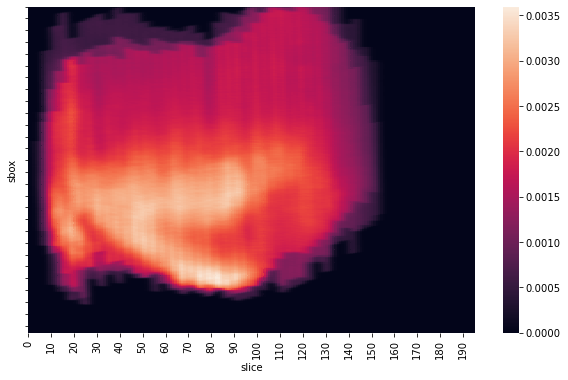

In [578]:
# this is mouse avg

b = pd.concat([d_frame9_TFDS2,d_frame10_noTF,d_frame11_TFDS2])
all_mouse = pd.concat([d_frame9,d_frame10,d_frame11])

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
    
# and mouse plot
bbbb = pd.concat(means_again_b)
mouse_avg = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_mouse = mouse_avg.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))

ax = sns.heatmap(data_pivot_mouse)#.invert_yaxis()

ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
                 
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

plt.savefig('avg_mouse_rzrb_for_fig_2_.pdf')
plt.show()
#plt.savefig('stlf_vole_vs.pdf')

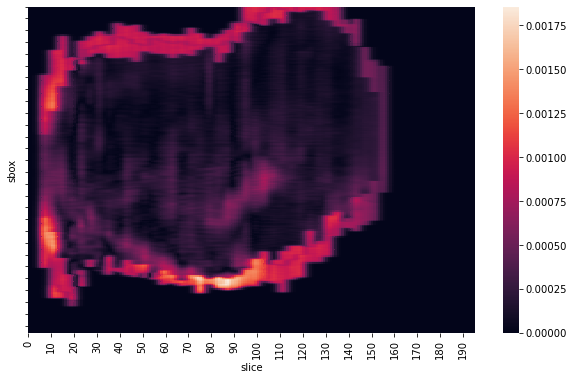

In [579]:
# this is mouse variance

b = pd.concat([d_frame9,d_frame10,d_frame11])

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].std()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))

ax = sns.heatmap(data_pivot_b)#.invert_yaxis()

ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
                 
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

plt.savefig('avg_mouse_var_rzrb_for_fig_2_.pdf')
plt.show()
#plt.savefig('stlf_vole_vs.pdf')

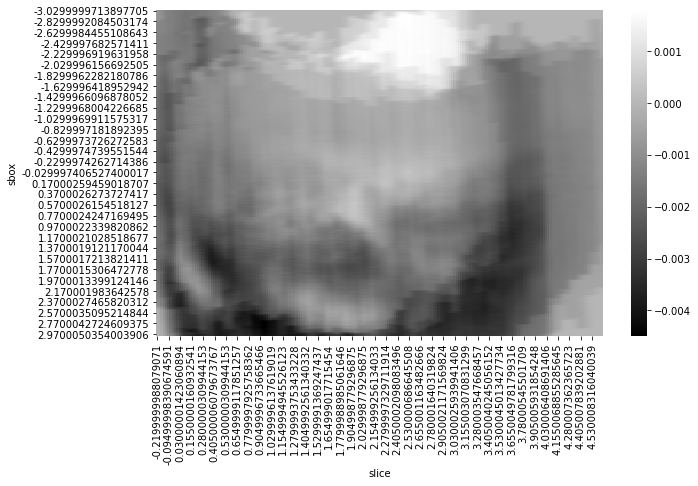

In [690]:
# mouse - vole 

data_pivot_minus = data_pivot_mouse - data_pivot_vole 
data_pivot_minus_cut = data_pivot_minus.loc[data_pivot_minus.index < 3].copy()

plt.figure(figsize=(10, 6))

ax = sns.heatmap(data_pivot_minus_cut, cmap='gray')

#ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
                 
#ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
#ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

#plt.ylim(-100, 1000)
plt.savefig('stfish_vole_minus_mouse_rzrb.pdf')


# Individual id2 maps

# layer 2/3

<AxesSubplot:xlabel='x', ylabel='y'>

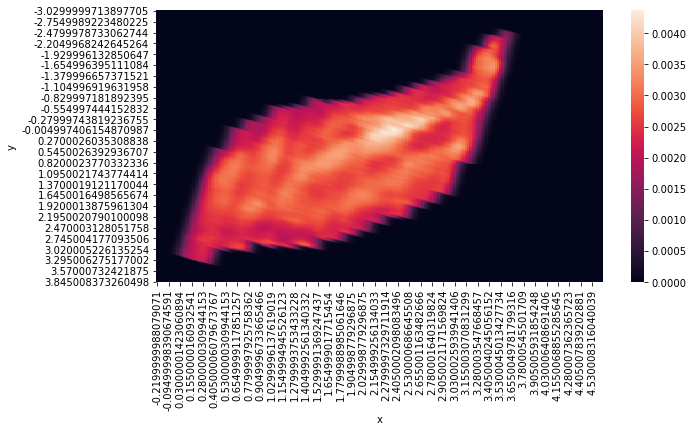

In [82]:
coord_resamp_list = list(h5_file12_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file12_23['output_map']['twod']['expression_resampled'])

d_frame12_23 = pd.DataFrame({'case':'twelve23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot12_23 = d_frame12_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot12_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

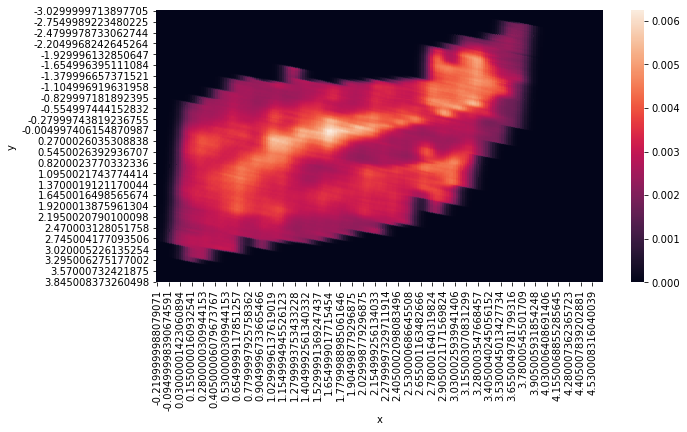

In [83]:
coord_resamp_list = list(h5_file13_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file13_23['output_map']['twod']['expression_resampled'])

d_frame13_23 = pd.DataFrame({'case':'thirteen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot13_23 = d_frame13_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot13_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

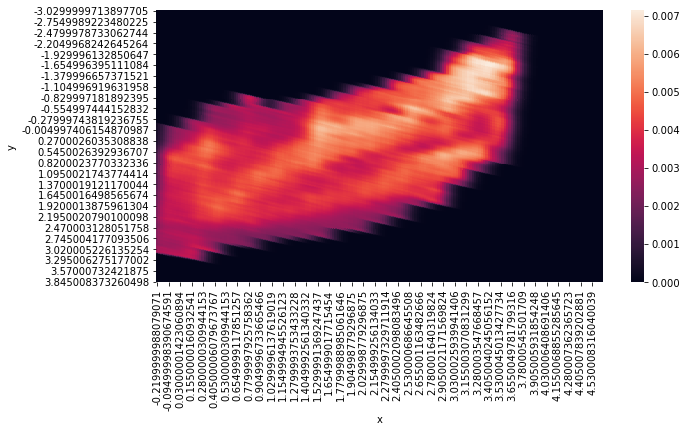

In [84]:
coord_resamp_list = list(h5_file14_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file14_23['output_map']['twod']['expression_resampled'])

d_frame14_23 = pd.DataFrame({'case':'fourteen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot14_23 = d_frame14_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot14_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

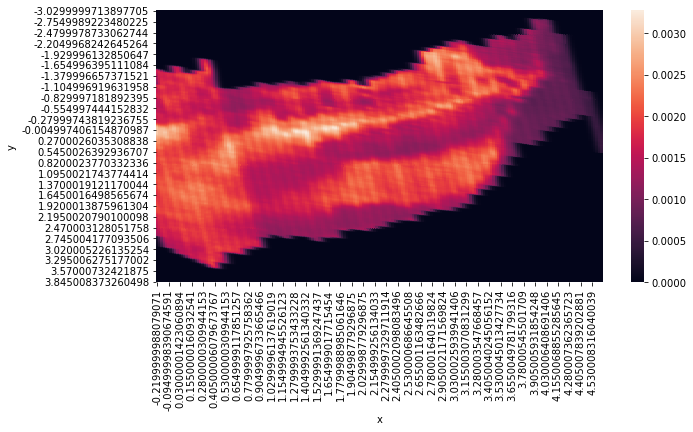

In [85]:
coord_resamp_list = list(h5_file15_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file15_23['output_map']['twod']['expression_resampled'])

d_frame15_23 = pd.DataFrame({'case':'fifteen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot15_23 = d_frame15_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot15_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

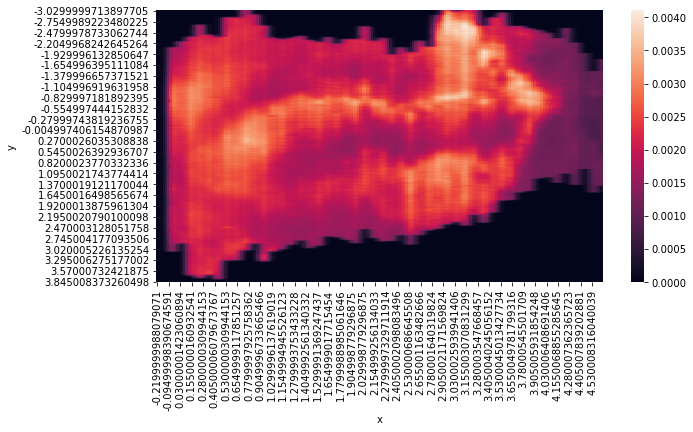

In [86]:
coord_resamp_list = list(h5_file16_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file16_23['output_map']['twod']['expression_resampled'])

d_frame16_23 = pd.DataFrame({'case':'sixteen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot16_23 = d_frame16_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot16_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

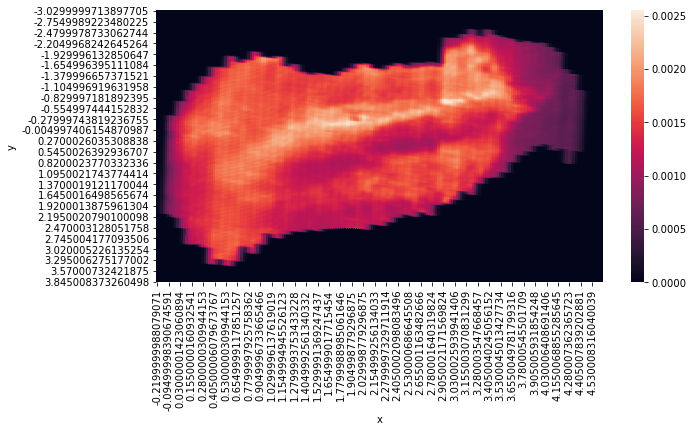

In [87]:
coord_resamp_list = list(h5_file17_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file17_23['output_map']['twod']['expression_resampled'])

d_frame17_23 = pd.DataFrame({'case':'seventeen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot17_23 = d_frame17_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot17_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

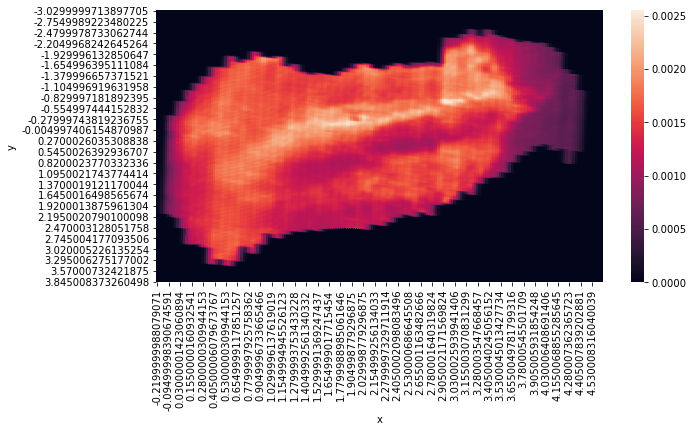

In [731]:
coord_resamp_list = list(h5_file17_23_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file17_23_noTF['output_map']['twod']['expression_resampled'])

d_frame17_23_noTF = pd.DataFrame({'case':'seventeen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot17_23_noTF = d_frame17_23_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot17_23_noTF)#.invert_yaxis()

plt.savefig('noTF_65_7E_id2_L23.pdf')

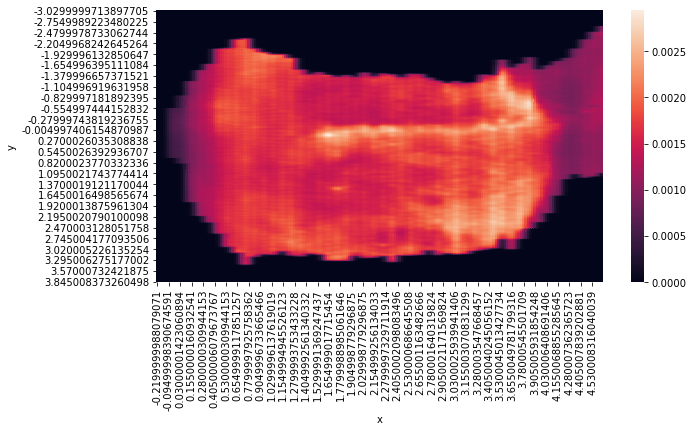

In [732]:
coord_resamp_list = list(h5_file17_5_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file17_5_noTF['output_map']['twod']['expression_resampled'])

d_frame17_5_noTF = pd.DataFrame({'case':'seventeen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot17_5_noTF = d_frame17_5_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot17_5_noTF)#.invert_yaxis()

plt.savefig('noTF_65_7E_id2_L5.pdf')

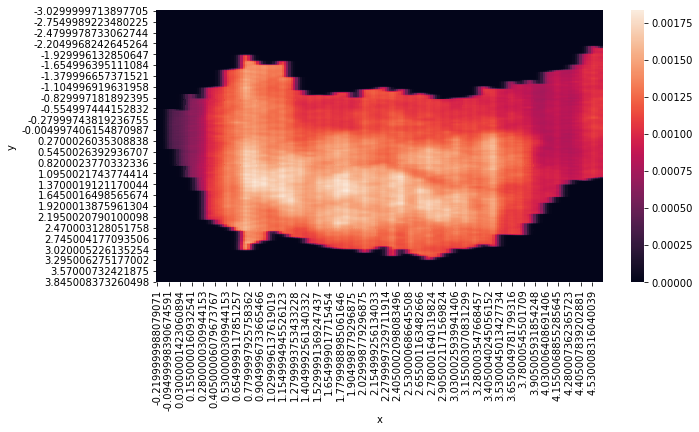

In [733]:
coord_resamp_list = list(h5_file17_6_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file17_6_noTF['output_map']['twod']['expression_resampled'])

d_frame17_6_noTF = pd.DataFrame({'case':'seventeen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot17_6_noTF = d_frame17_6_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot17_6_noTF)#.invert_yaxis()

plt.savefig('noTF_65_7E_id2_L6.pdf')

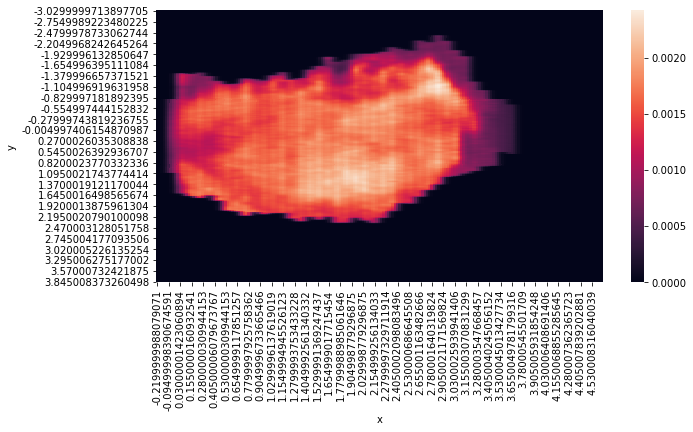

In [734]:
coord_resamp_list = list(h5_file19_6_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file19_6_noTF['output_map']['twod']['expression_resampled'])

d_frame19_6_noTF = pd.DataFrame({'case':'seventeen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot19_6_noTF = d_frame19_6_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot19_6_noTF)#.invert_yaxis()

plt.savefig('noTF_DS4_mouse_id2_L6.pdf')

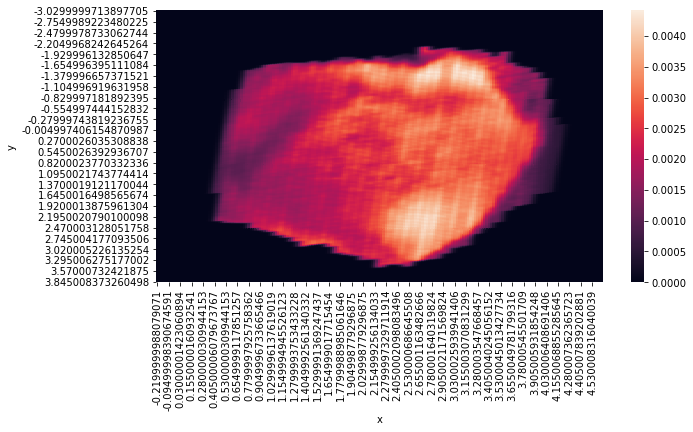

In [735]:
coord_resamp_list = list(h5_file19_5_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file19_5_noTF['output_map']['twod']['expression_resampled'])

d_frame19_5_noTF = pd.DataFrame({'case':'seventeen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot19_5_noTF = d_frame19_5_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot19_5_noTF)#.invert_yaxis()

plt.savefig('noTF_DS4_mouse_id2_L5.pdf')

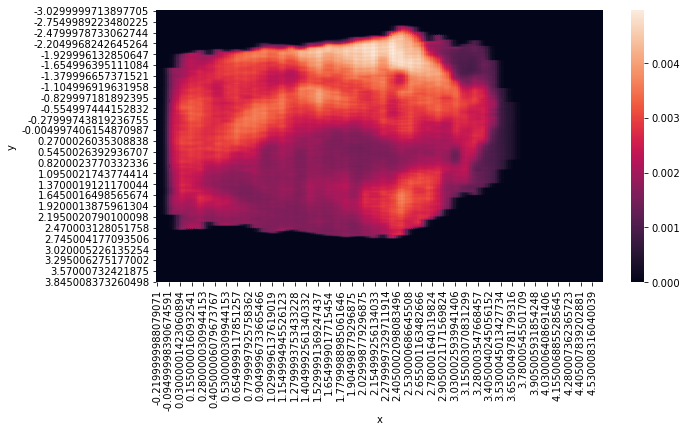

In [736]:
coord_resamp_list = list(h5_file19_23_noTF['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file19_23_noTF['output_map']['twod']['expression_resampled'])

d_frame19_23_noTF = pd.DataFrame({'case':'seventeen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot19_23_noTF = d_frame19_23_noTF.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot19_23_noTF)#.invert_yaxis()

plt.savefig('noTF_DS4_mouse_id2_L23.pdf')

<AxesSubplot:xlabel='x', ylabel='y'>

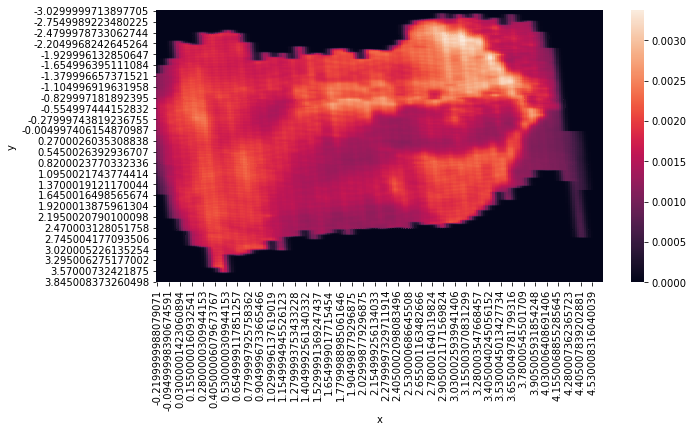

In [88]:
coord_resamp_list = list(h5_file18_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file18_23['output_map']['twod']['expression_resampled'])

d_frame18_23 = pd.DataFrame({'case':'eighteen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot18_23 = d_frame18_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot18_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

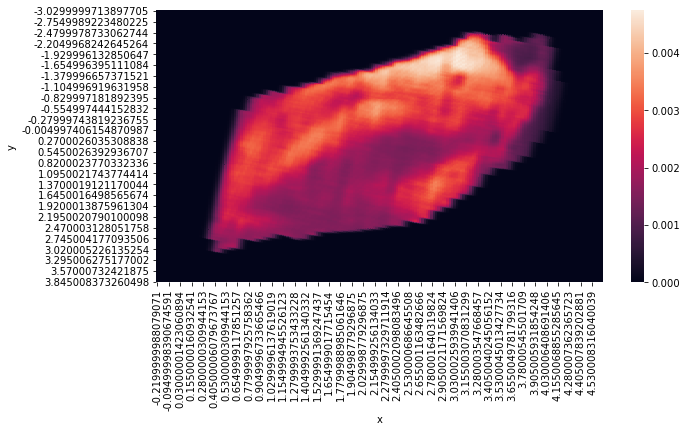

In [89]:
coord_resamp_list = list(h5_file19_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file19_23['output_map']['twod']['expression_resampled'])

d_frame19_23 = pd.DataFrame({'case':'nineteen23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot19_23 = d_frame19_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot19_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

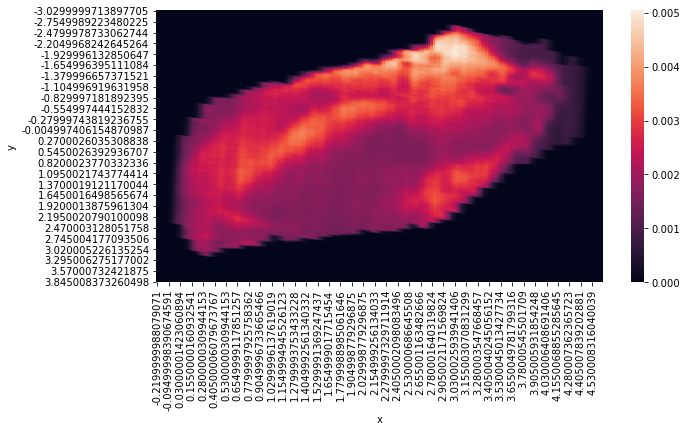

In [90]:
coord_resamp_list = list(h5_file20_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file20_23['output_map']['twod']['expression_resampled'])

d_frame20_23 = pd.DataFrame({'case':'twenty23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot20_23 = d_frame20_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot20_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

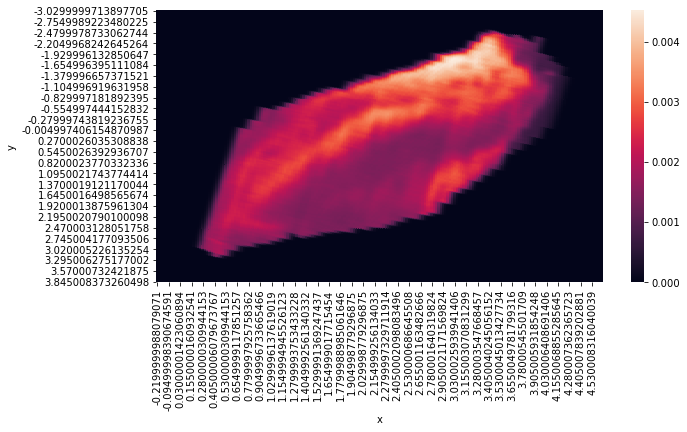

In [92]:
coord_resamp_list = list(h5_file121_23['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file121_23['output_map']['twod']['expression_resampled'])

d_frame21_23 = pd.DataFrame({'case':'twentyone23','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot21_23 = d_frame21_23.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot21_23)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

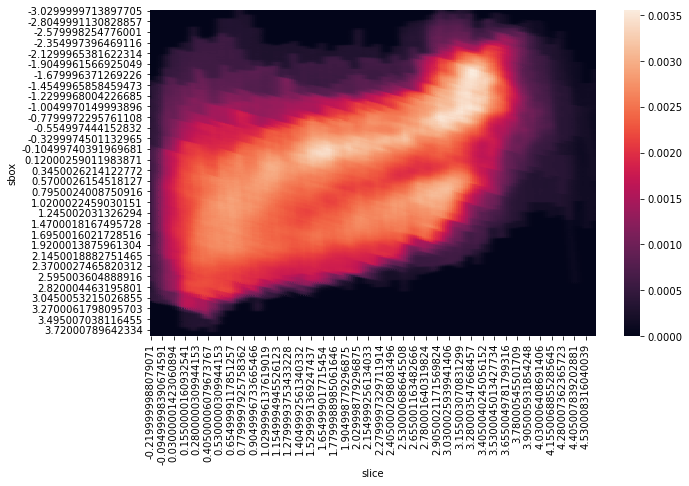

In [939]:
# avg layer 23



# VOLE 

a = pd.concat([d_frame12_23, d_frame13_23, d_frame14_23, d_frame15_23, 
               d_frame16_23, d_frame17_23, d_frame18_23])
#all_vole = pd.concat([d_frame1,d_frame2,d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)


    
    
aaaa = pd.concat(means_again)
vole_avg_23 = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_vole_id2_L23 = vole_avg_23.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_vole_id2_L23)
#plt.savefig('stlf_vole_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

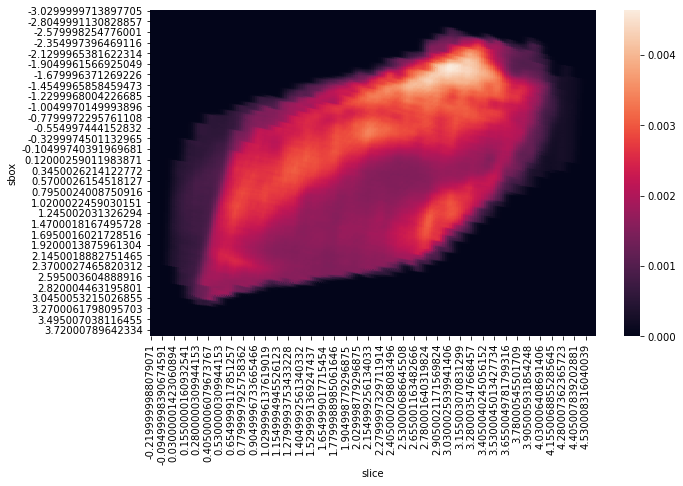

In [940]:
# avg layer 23



# Mouse

a = pd.concat([d_frame19_23, d_frame20_23, d_frame21_23])
#all_vole = pd.concat([d_frame1,d_frame2,d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)


    
    
aaaa = pd.concat(means_again)
mouse_avg_23 = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_mouse_id2_L23 = mouse_avg_23.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_mouse_id2_L23)
#plt.savefig('stlf_vole_vs.pdf')

# layer 5

<AxesSubplot:xlabel='x', ylabel='y'>

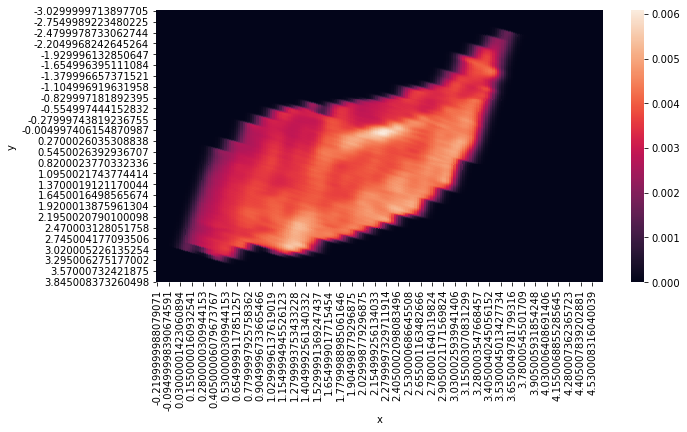

In [68]:
coord_resamp_list = list(h5_file12_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file12_5['output_map']['twod']['expression_resampled'])

d_frame12_5 = pd.DataFrame({'case':'twelve5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot12_5 = d_frame12_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot12_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

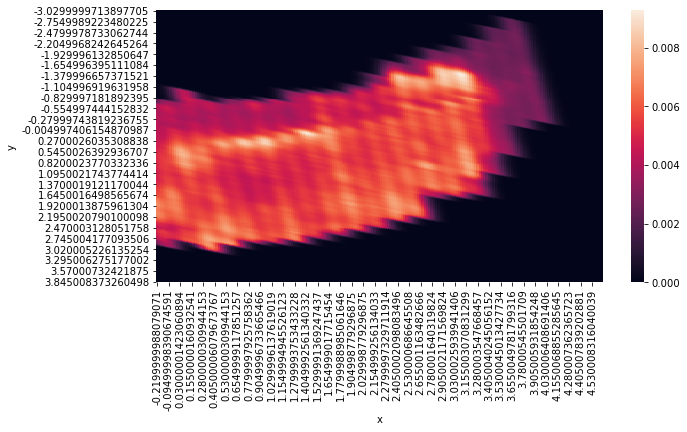

In [69]:
coord_resamp_list = list(h5_file13_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file13_5['output_map']['twod']['expression_resampled'])

d_frame13_5 = pd.DataFrame({'case':'thirteen5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot13_5 = d_frame13_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot13_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

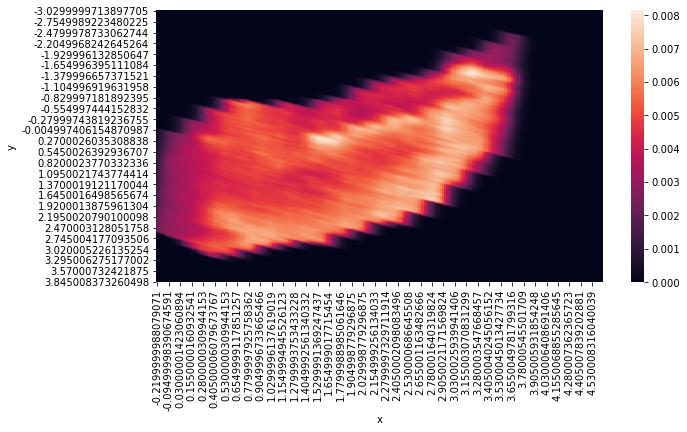

In [71]:
coord_resamp_list = list(h5_file14_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file14_5['output_map']['twod']['expression_resampled'])

d_frame14_5 = pd.DataFrame({'case':'fourteen5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot14_5 = d_frame14_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot14_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

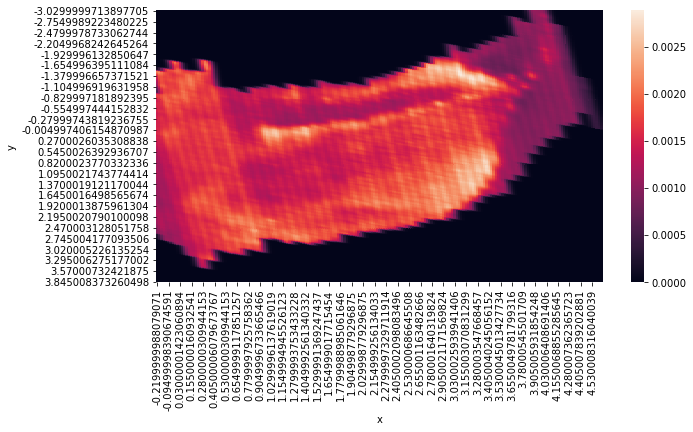

In [72]:
coord_resamp_list = list(h5_file15_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file15_5['output_map']['twod']['expression_resampled'])

d_frame15_5 = pd.DataFrame({'case':'fifteen5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot15_5 = d_frame15_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot15_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

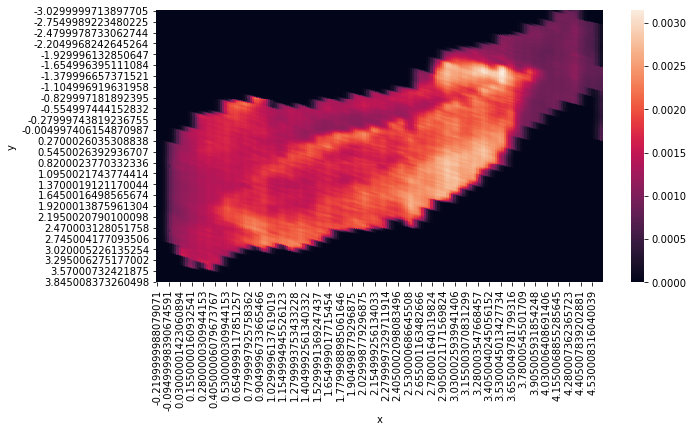

In [73]:
coord_resamp_list = list(h5_file16_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file16_5['output_map']['twod']['expression_resampled'])

d_frame16_5 = pd.DataFrame({'case':'sixteen5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot16_5 = d_frame16_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot16_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

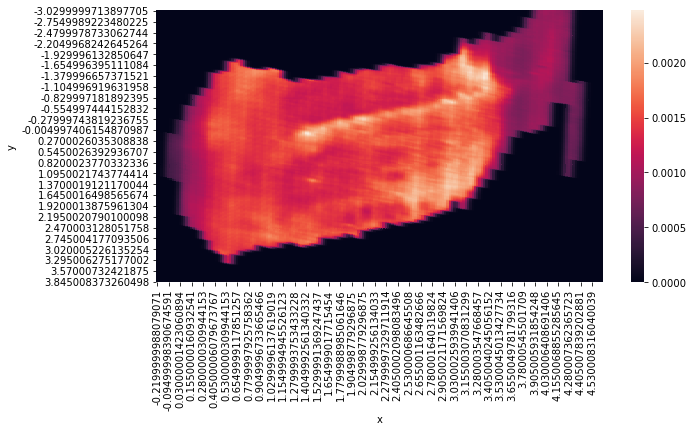

In [74]:
coord_resamp_list = list(h5_file17_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file17_5['output_map']['twod']['expression_resampled'])

d_frame17_5 = pd.DataFrame({'case':'seventeen5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot17_5 = d_frame17_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot17_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

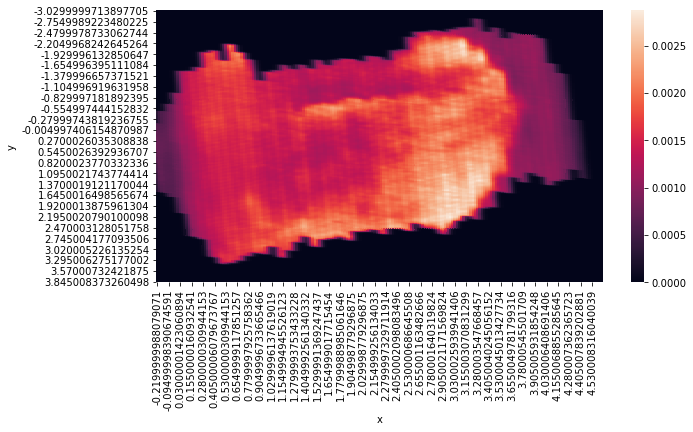

In [75]:
coord_resamp_list = list(h5_file18_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file18_5['output_map']['twod']['expression_resampled'])

d_frame18_5 = pd.DataFrame({'case':'eighteen5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot18_5 = d_frame18_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot18_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

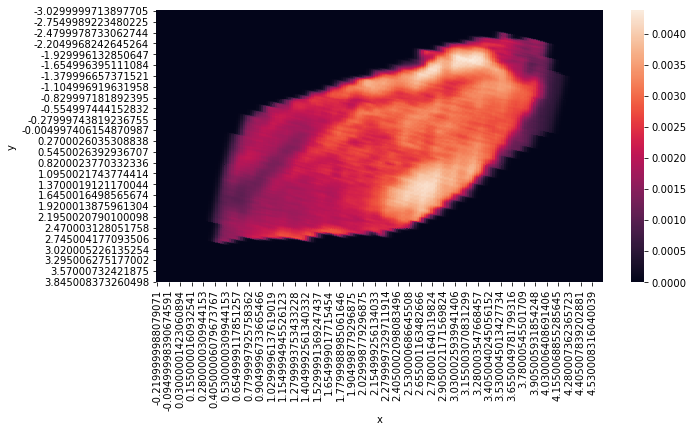

In [76]:
coord_resamp_list = list(h5_file19_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file19_5['output_map']['twod']['expression_resampled'])

d_frame19_5 = pd.DataFrame({'case':'nineteen5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot19_5 = d_frame19_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot19_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

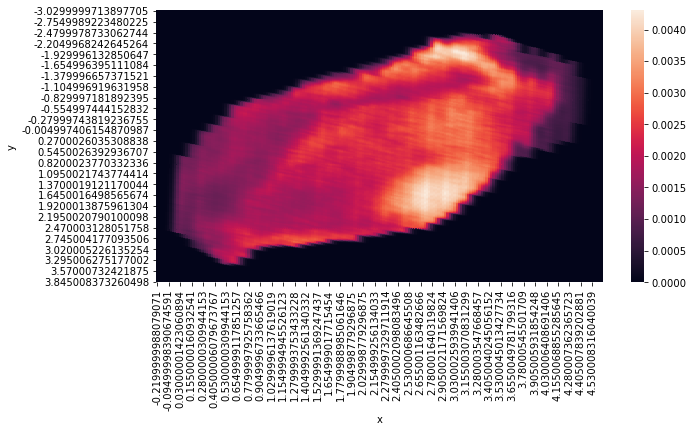

In [77]:
coord_resamp_list = list(h5_file20_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file20_5['output_map']['twod']['expression_resampled'])

d_frame20_5 = pd.DataFrame({'case':'twenty5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot20_5 = d_frame20_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot20_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

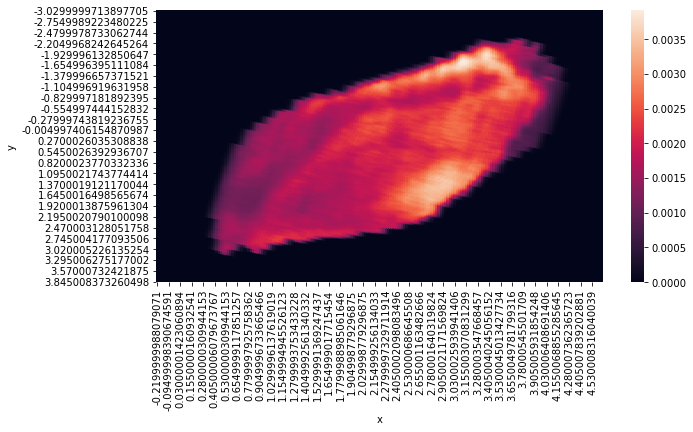

In [79]:
coord_resamp_list = list(h5_file121_5['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file121_5['output_map']['twod']['expression_resampled'])

d_frame21_5 = pd.DataFrame({'case':'twentyone5','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot21_5 = d_frame21_5.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot21_5)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

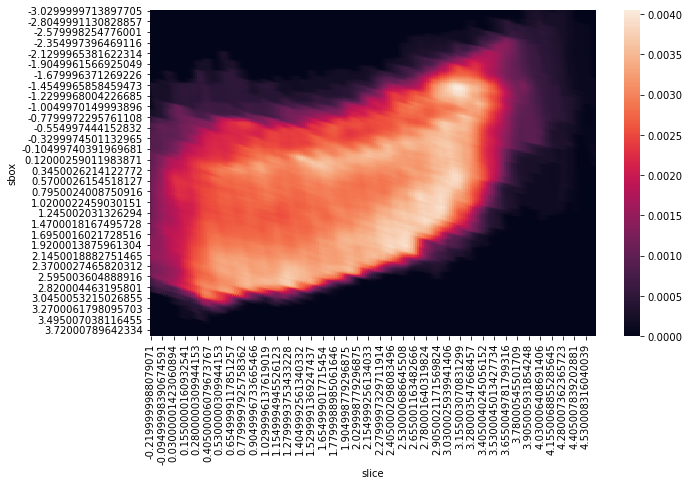

In [258]:
# avg layer 5



# VOLE 

a = pd.concat([d_frame12_5, d_frame13_5, d_frame14_5, d_frame15_5, 
               d_frame16_5, d_frame17_5, d_frame18_5])
#all_vole = pd.concat([d_frame1,d_frame2,d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)


    
    
aaaa = pd.concat(means_again)
vole_avg = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_vole_id2_L5 = vole_avg.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_vole_id2_L5)
#plt.savefig('stlf_vole_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

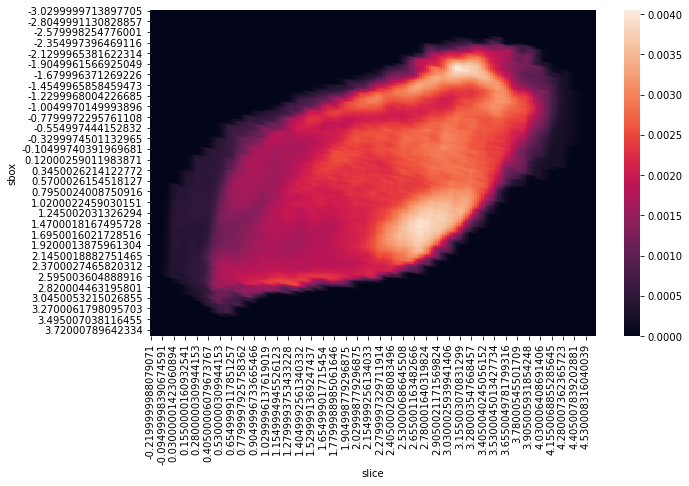

In [259]:
# avg layer 5



# Mouse

a = pd.concat([d_frame19_5, d_frame20_5, d_frame21_5])
#all_vole = pd.concat([d_frame1,d_frame2,d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)


    
    
aaaa = pd.concat(means_again)
vole_avg = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_mouse_id2_L5 = vole_avg.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_mouse_id2_L5)
#plt.savefig('stlf_vole_vs.pdf')

# Layer 6 Maps 

<AxesSubplot:xlabel='x', ylabel='y'>

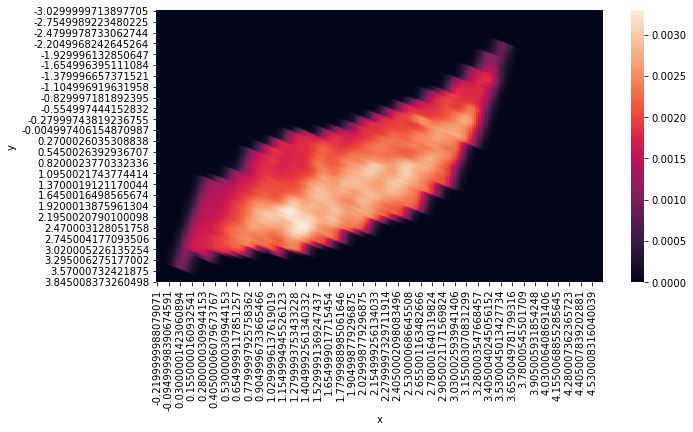

In [95]:
coord_resamp_list = list(h5_file12_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file12_6['output_map']['twod']['expression_resampled'])

d_frame12_6 = pd.DataFrame({'case':'twelve6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot12_6 = d_frame12_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot12_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

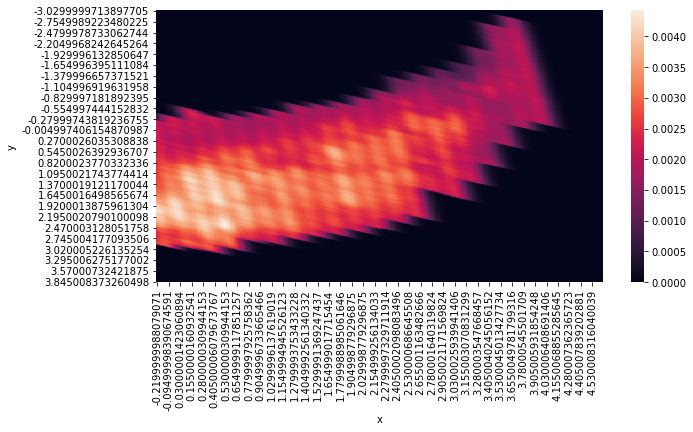

In [96]:
coord_resamp_list = list(h5_file13_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file13_6['output_map']['twod']['expression_resampled'])

d_frame13_6 = pd.DataFrame({'case':'thirteen6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot13_6 = d_frame13_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot13_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

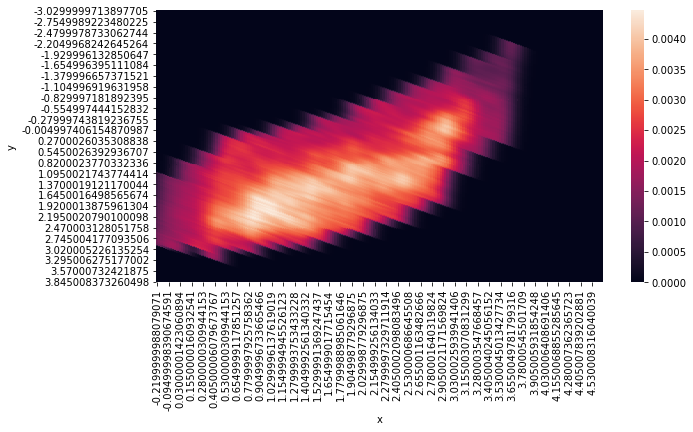

In [97]:
coord_resamp_list = list(h5_file14_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file14_6['output_map']['twod']['expression_resampled'])

d_frame14_6 = pd.DataFrame({'case':'fourteen6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot14_6 = d_frame14_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot14_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

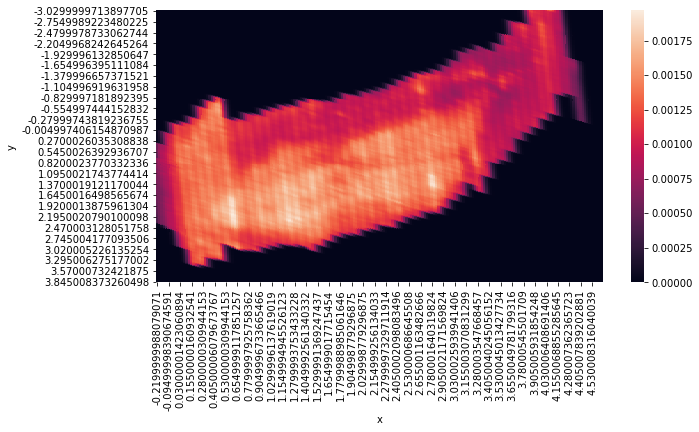

In [98]:
coord_resamp_list = list(h5_file15_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file15_6['output_map']['twod']['expression_resampled'])

d_frame15_6 = pd.DataFrame({'case':'fifteen6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot15_6 = d_frame15_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot15_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

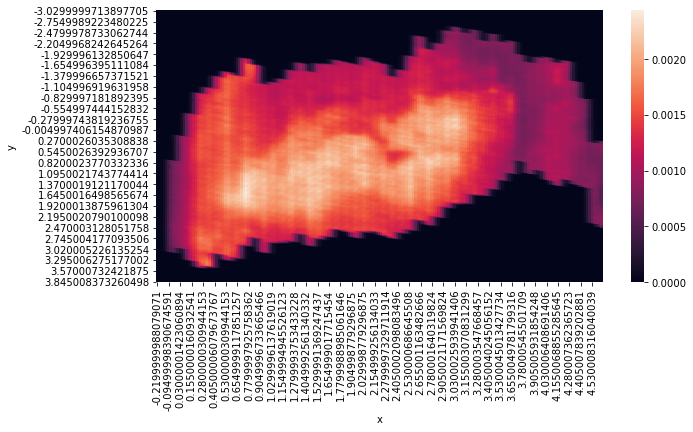

In [99]:
coord_resamp_list = list(h5_file16_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file16_6['output_map']['twod']['expression_resampled'])

d_frame16_6 = pd.DataFrame({'case':'sixteen6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot16_6 = d_frame16_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot16_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

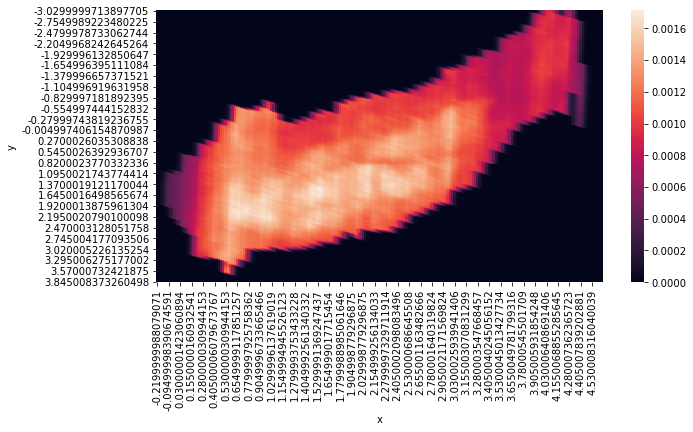

In [100]:
coord_resamp_list = list(h5_file17_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file17_6['output_map']['twod']['expression_resampled'])

d_frame17_6 = pd.DataFrame({'case':'seventeen6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot17_6 = d_frame17_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot17_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

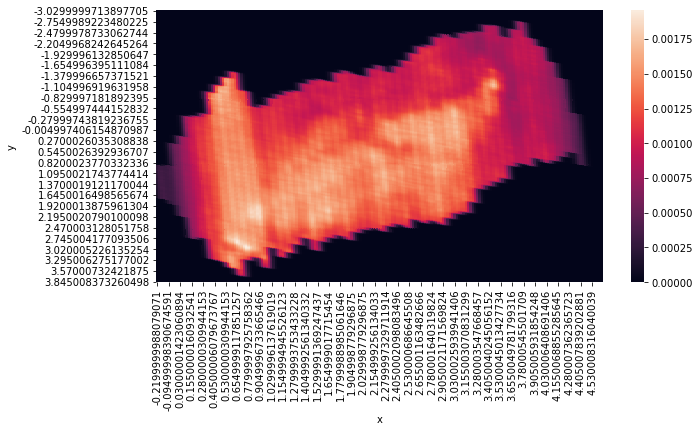

In [101]:
coord_resamp_list = list(h5_file18_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file18_6['output_map']['twod']['expression_resampled'])

d_frame18_6 = pd.DataFrame({'case':'eighteen6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot18_6 = d_frame18_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot18_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

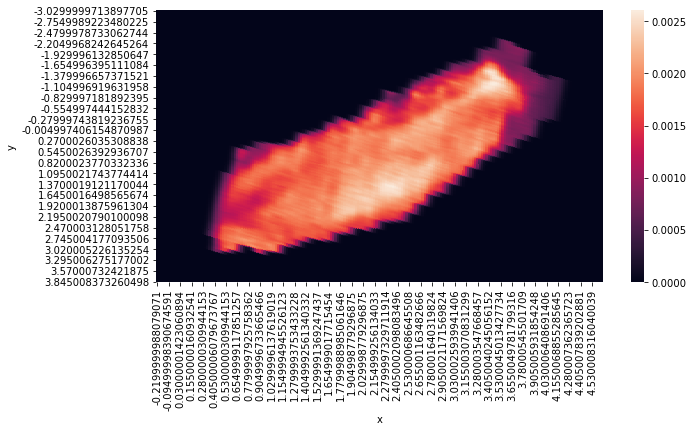

In [102]:
coord_resamp_list = list(h5_file19_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file19_6['output_map']['twod']['expression_resampled'])

d_frame19_6 = pd.DataFrame({'case':'nineteen6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot19_6 = d_frame19_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot19_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

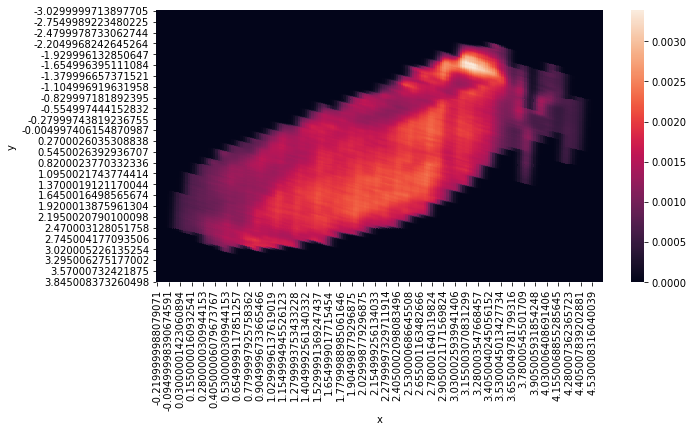

In [103]:
coord_resamp_list = list(h5_file20_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file20_6['output_map']['twod']['expression_resampled'])

d_frame20_6 = pd.DataFrame({'case':'twenty6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot20_6 = d_frame20_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot20_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='x', ylabel='y'>

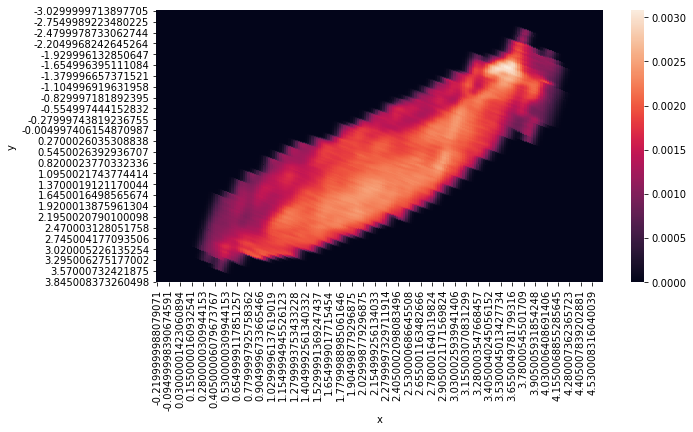

In [104]:
coord_resamp_list = list(h5_file121_6['output_map']['twod']['coordinates_resampled'])
x1 = [i[0] for i in coord_resamp_list]
y1 = [i[1] for i in coord_resamp_list]
z1 = list(h5_file121_6['output_map']['twod']['expression_resampled'])

d_frame21_6 = pd.DataFrame({'case':'twentyone6','x':x1,'y':y1,'z':z1})

# Within-Slice (Mean Centering) WITH INTERPOLATION
data_pivot21_6 = d_frame21_6.pivot('y','x','z')
plt.figure(figsize=(10, 5))
plt.ylim(-1.3,1.5)
sns.heatmap(data_pivot21_6)#.invert_yaxis()
#plt.savefig('test_bs_1.png')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

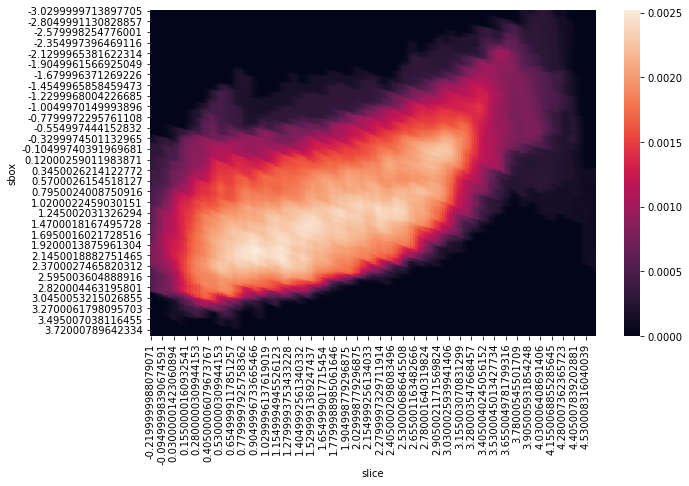

In [260]:
# avg layer 6



# VOLE 

a = pd.concat([d_frame12_6, d_frame13_6, d_frame14_6, d_frame15_6, 
               d_frame16_6, d_frame17_6, d_frame18_6])
#all_vole = pd.concat([d_frame1,d_frame2,d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)


    
    
aaaa = pd.concat(means_again)
vole_avg = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_vole_id2_L6 = vole_avg.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_vole_id2_L6)
#plt.savefig('stlf_vole_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

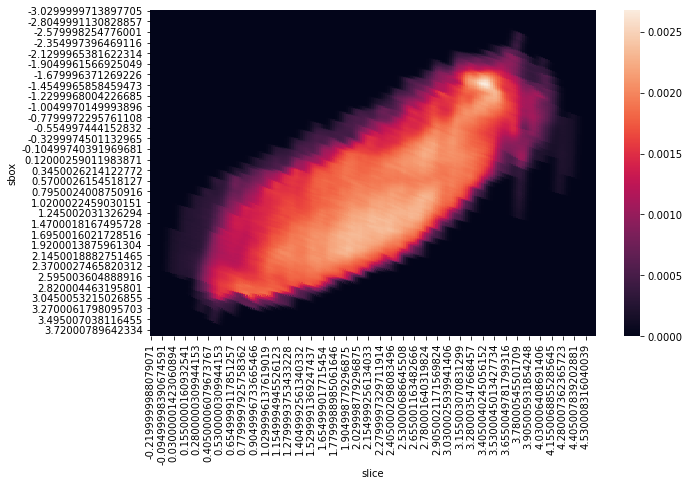

In [261]:
# avg layer 6



# Mouse

a = pd.concat([d_frame19_6, d_frame20_6, d_frame21_6])
#all_vole = pd.concat([d_frame1,d_frame2,d_frame5,d_frame6,d_frame7,d_frame8])

means_again = []


slice_groups = a.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = a.loc[a['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].mean()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again.append(all_mean_df)


    
    
aaaa = pd.concat(means_again)
vole_avg = aaaa.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_mouse_id2_L6 = vole_avg.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_mouse_id2_L6)
#plt.savefig('stlf_vole_vs.pdf')

# Now clustering

In [1011]:
import sklearn as sk
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn import metrics 
from scipy.spatial.distance import cdist 

d_frame1_flatten = data_pivot1.values.flatten()
d_frame2_flatten = data_pivot2.values.flatten()
d_frame3_flatten = data_pivot3.values.flatten()
d_frame4_flatten = data_pivot4.values.flatten()
d_frame5_flatten = data_pivot5.values.flatten()
d_frame6_flatten = data_pivot6.values.flatten()
d_frame7_flatten = data_pivot7.values.flatten()
d_frame8_flatten = data_pivot8.values.flatten()
d_frame9_flatten = data_pivot9.values.flatten()
d_frame10_flatten = data_pivot10.values.flatten()
d_frame11_flatten = data_pivot11.values.flatten()

d_frame12_23_flatten = data_pivot12_23.values.flatten()
d_frame13_23_flatten = data_pivot13_23.values.flatten()
d_frame14_23_flatten = data_pivot14_23.values.flatten()
d_frame15_23_flatten = data_pivot15_23.values.flatten()
d_frame16_23_flatten = data_pivot16_23.values.flatten()
d_frame17_23_flatten = data_pivot17_23.values.flatten()
d_frame18_23_flatten = data_pivot18_23.values.flatten()
d_frame19_23_flatten = data_pivot19_23.values.flatten()
d_frame20_23_flatten = data_pivot20_23.values.flatten()
d_frame21_23_flatten = data_pivot21_23.values.flatten()


d_frame12_5_flatten = data_pivot12_5.values.flatten()
d_frame13_5_flatten = data_pivot13_5.values.flatten()
d_frame14_5_flatten = data_pivot14_5.values.flatten()
d_frame15_5_flatten = data_pivot15_5.values.flatten()
d_frame16_5_flatten = data_pivot16_5.values.flatten()
d_frame17_5_flatten = data_pivot17_5.values.flatten()
d_frame18_5_flatten = data_pivot18_5.values.flatten()
d_frame19_5_flatten = data_pivot19_5.values.flatten()
d_frame20_5_flatten = data_pivot20_5.values.flatten()
d_frame21_5_flatten = data_pivot21_5.values.flatten()


d_frame12_6_flatten = data_pivot12_6.values.flatten()
d_frame13_6_flatten = data_pivot13_6.values.flatten()
d_frame14_6_flatten = data_pivot14_6.values.flatten()
d_frame15_6_flatten = data_pivot15_6.values.flatten()
d_frame16_6_flatten = data_pivot16_6.values.flatten()
d_frame17_6_flatten = data_pivot17_6.values.flatten()
d_frame18_6_flatten = data_pivot18_6.values.flatten()
d_frame19_6_flatten = data_pivot19_6.values.flatten()
d_frame20_6_flatten = data_pivot20_6.values.flatten()
d_frame21_6_flatten = data_pivot21_6.values.flatten()


d_frame12_23_flatten_null = data_pivot12_23.values.flatten()
d_frame13_23_flatten_null = data_pivot13_23.values.flatten()
d_frame14_23_flatten_null = data_pivot14_23.values.flatten()
d_frame15_23_flatten_null = data_pivot15_23.values.flatten()
d_frame16_23_flatten_null = data_pivot16_23.values.flatten()
d_frame17_23_flatten_null = data_pivot17_23.values.flatten()
d_frame18_23_flatten_null = data_pivot18_23.values.flatten()
d_frame19_23_flatten_null = data_pivot19_23.values.flatten()
d_frame20_23_flatten_null = data_pivot20_23.values.flatten()
d_frame21_23_flatten_null = data_pivot21_23.values.flatten()

In [1174]:
d_frame21_6
# Within-Slice (Mean Centering) WITH INTERPOLATION
#data_pivot21_6 = d_frame21_6.pivot('y','x','z')

,case,x,y,z
0,twentyone6,-0.220000,-3.030000,0.0
1,twentyone6,-0.195000,-3.030000,0.0
2,twentyone6,-0.170000,-3.030000,0.0
3,twentyone6,-0.145000,-3.030000,0.0
4,twentyone6,-0.120000,-3.030000,0.0
...,...,...,...,...
53815,twentyone6,4.530008,3.845008,0.0
53816,twentyone6,4.555008,3.845008,0.0
53817,twentyone6,4.580009,3.845008,0.0
53818,twentyone6,4.605009,3.845008,0.0


In [1301]:
#a = np.array(df1['A'].values.tolist())
#df1['A'] = np.where(a > 9, 11, a).tolist()

#null_array = np.array(d_frame21_6['z'].values.tolist())
#d_frame21_6['z_null'] = np.where(null_array > 0, 1, null_array).tolist()


frame_list= [d_frame12_23,d_frame13_23,d_frame14_23,d_frame15_23,d_frame16_23,d_frame17_23,
            d_frame18_23,d_frame19_23,d_frame20_23,d_frame21_23,
             
             d_frame12_5,d_frame13_5,d_frame14_5,d_frame15_5,d_frame16_5,d_frame17_5,
            d_frame18_5,d_frame19_5,d_frame20_5,d_frame21_5,
            
            d_frame12_6,d_frame13_6,d_frame14_6,d_frame15_6,d_frame16_6,d_frame17_6,
            d_frame18_6,d_frame19_6,d_frame20_6,d_frame21_6]

frame_list2= [d_frame1, d_frame2, d_frame3, d_frame4, d_frame5, d_frame6, d_frame7, d_frame8, d_frame9,
             d_frame10, d_frame11]


for frame in frame_list2: 
    null_array = np.array(frame['z'].values.tolist())
    frame['z_null'] = np.where(null_array > 0, 1, null_array).tolist()   

In [1302]:
data_pivot1_null = d_frame1.pivot('y','x','z_null')
data_pivot2_null = d_frame2.pivot('y','x','z_null')
data_pivot3_null = d_frame3.pivot('y','x','z_null')
data_pivot4_null = d_frame4.pivot('y','x','z_null')
data_pivot5_null = d_frame5.pivot('y','x','z_null')
data_pivot6_null = d_frame6.pivot('y','x','z_null')
data_pivot7_null = d_frame7.pivot('y','x','z_null')
data_pivot8_null = d_frame8.pivot('y','x','z_null')
data_pivot9_null = d_frame9.pivot('y','x','z_null')
data_pivot10_null = d_frame10.pivot('y','x','z_null')
data_pivot10_null = d_frame10.pivot('y','x','z_null')
data_pivot11_null = d_frame11.pivot('y','x','z_null')


data_pivot12_23_null = d_frame12_23.pivot('y','x','z_null')
data_pivot13_23_null = d_frame13_23.pivot('y','x','z_null')
data_pivot14_23_null = d_frame14_23.pivot('y','x','z_null')
data_pivot15_23_null = d_frame15_23.pivot('y','x','z_null')
data_pivot16_23_null = d_frame16_23.pivot('y','x','z_null')
data_pivot17_23_null = d_frame17_23.pivot('y','x','z_null')
data_pivot18_23_null = d_frame18_23.pivot('y','x','z_null')
data_pivot19_23_null = d_frame19_23.pivot('y','x','z_null')
data_pivot20_23_null = d_frame20_23.pivot('y','x','z_null')
data_pivot21_23_null = d_frame21_23.pivot('y','x','z_null')

data_pivot12_5_null = d_frame12_5.pivot('y','x','z_null')
data_pivot13_5_null = d_frame13_5.pivot('y','x','z_null')
data_pivot14_5_null = d_frame14_5.pivot('y','x','z_null')
data_pivot15_5_null = d_frame15_5.pivot('y','x','z_null')
data_pivot16_5_null = d_frame16_5.pivot('y','x','z_null')
data_pivot17_5_null = d_frame17_5.pivot('y','x','z_null')
data_pivot18_5_null = d_frame18_5.pivot('y','x','z_null')
data_pivot19_5_null = d_frame19_5.pivot('y','x','z_null')
data_pivot20_5_null = d_frame20_5.pivot('y','x','z_null')
data_pivot21_5_null = d_frame21_5.pivot('y','x','z_null')

data_pivot12_6_null = d_frame12_6.pivot('y','x','z_null')
data_pivot13_6_null = d_frame13_6.pivot('y','x','z_null')
data_pivot14_6_null = d_frame14_6.pivot('y','x','z_null')
data_pivot15_6_null = d_frame15_6.pivot('y','x','z_null')
data_pivot16_6_null = d_frame16_6.pivot('y','x','z_null')
data_pivot17_6_null = d_frame17_6.pivot('y','x','z_null')
data_pivot18_6_null = d_frame18_6.pivot('y','x','z_null')
data_pivot19_6_null = d_frame19_6.pivot('y','x','z_null')
data_pivot20_6_null = d_frame20_6.pivot('y','x','z_null')
data_pivot21_6_null = d_frame21_6.pivot('y','x','z_null')

<AxesSubplot:xlabel='x', ylabel='y'>

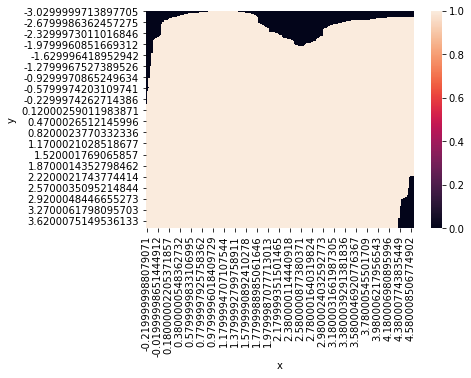

In [1319]:
sns.heatmap(data_pivot1_null)

In [1307]:
d_frame12_23_flatten_null = data_pivot12_23_null.values.flatten()
d_frame13_23_flatten_null = data_pivot13_23_null.values.flatten()
d_frame14_23_flatten_null = data_pivot14_23_null.values.flatten()
d_frame15_23_flatten_null = data_pivot15_23_null.values.flatten()
d_frame16_23_flatten_null = data_pivot16_23_null.values.flatten()
d_frame17_23_flatten_null = data_pivot17_23_null.values.flatten()
d_frame18_23_flatten_null = data_pivot18_23_null.values.flatten()
d_frame19_23_flatten_null = data_pivot19_23_null.values.flatten()
d_frame20_23_flatten_null = data_pivot20_23_null.values.flatten()
d_frame21_23_flatten_null = data_pivot21_23_null.values.flatten()

d_frame12_5_flatten_null = data_pivot12_5_null.values.flatten()
d_frame13_5_flatten_null = data_pivot13_5_null.values.flatten()
d_frame14_5_flatten_null = data_pivot14_5_null.values.flatten()
d_frame15_5_flatten_null = data_pivot15_5_null.values.flatten()
d_frame16_5_flatten_null = data_pivot16_5_null.values.flatten()
d_frame17_5_flatten_null = data_pivot17_5_null.values.flatten()
d_frame18_5_flatten_null = data_pivot18_5_null.values.flatten()
d_frame19_5_flatten_null = data_pivot19_5_null.values.flatten()
d_frame20_5_flatten_null = data_pivot20_5_null.values.flatten()
d_frame21_5_flatten_null = data_pivot21_5_null.values.flatten()


d_frame12_6_flatten_null = data_pivot12_6_null.values.flatten()
d_frame13_6_flatten_null = data_pivot13_6_null.values.flatten()
d_frame14_6_flatten_null = data_pivot14_6_null.values.flatten()
d_frame15_6_flatten_null = data_pivot15_6_null.values.flatten()
d_frame16_6_flatten_null = data_pivot16_6_null.values.flatten()
d_frame17_6_flatten_null = data_pivot17_6_null.values.flatten()
d_frame18_6_flatten_null = data_pivot18_6_null.values.flatten()
d_frame19_6_flatten_null = data_pivot19_6_null.values.flatten()
d_frame20_6_flatten_null = data_pivot20_6_null.values.flatten()
d_frame21_6_flatten_null = data_pivot21_6_null.values.flatten()


d_frame1_flatten_null = data_pivot1_null.values.flatten()
d_frame2_flatten_null = data_pivot2_null.values.flatten()
d_frame3_flatten_null = data_pivot3_null.values.flatten()
d_frame4_flatten_null = data_pivot4_null.values.flatten()
d_frame5_flatten_null = data_pivot5_null.values.flatten()
d_frame6_flatten_null = data_pivot6_null.values.flatten()
d_frame7_flatten_null = data_pivot7_null.values.flatten()
d_frame8_flatten_null = data_pivot8_null.values.flatten()
d_frame9_flatten_null = data_pivot9_null.values.flatten()
d_frame10_flatten_null = data_pivot10_null.values.flatten()
d_frame11_flatten_null = data_pivot11_null.values.flatten()

In [1328]:
# 1 0 1 0 0 0 0 1 1 1
# 8/10 accurate 
#For 2 clusters average silhouette score is: 0.31879231429950294
#For 3 clusters average silhouette score is: 0.41101263443035013
one_d_frame = pd.DataFrame({
    '1':d_frame1_flatten, 
    '2':d_frame2_flatten,
    '3':d_frame3_flatten,
    '5':d_frame5_flatten,                             
    '6':d_frame6_flatten,
    '7':d_frame7_flatten,
    '8':d_frame8_flatten,                          
    '9':d_frame9_flatten, 
    '10':d_frame10_flatten,              
    '11':d_frame11_flatten})



# 10/10 accuracy in the null frames. CAN classify on shape. 
#For 2 clusters average silhouette score is: 0.5138046872736151
#For 3 clusters average silhouette score is: 0.34692927234876114
#one_d_frame = pd.DataFrame({
#    '1':d_frame1_flatten_null, 
#    '2':d_frame2_flatten_null,
#    '3':d_frame3_flatten_null,
#    '5':d_frame5_flatten_null,                             
#    '6':d_frame6_flatten_null,
#    '7':d_frame7_flatten_null,
#    '8':d_frame8_flatten_null,                          
#    '9':d_frame9_flatten_null, 
#    '10':d_frame10_flatten_null,              
#    '11':d_frame11_flatten_null})

# For 2 clusters average silhouette score is: 0.42376312570739866
# For 3 clusters average silhouette score is: 0.4355918356858978
# 100% accuracy for 2 clusters 
# when using 3 clusters: maps cases 1-5,8 to 0, maps cases 6 and 7 to cluster 2, and 9,10,11 to cluster 1.
# cases 6 and 7 are 5_8C and 5_8B from the same litter?
# need to make sure we say that because these measures are based on variance, we cant completley rule out 
# that there is just too much variation within condition that is causing some individual data-points to be too 
# far away from cluster center. 


# all id2 data (mouse and vole) Cannot predict layers vs species 
# mostly because there are a few really weird shaped brains or cases that throw off the data
#one_d_frame = pd.DataFrame({'12_23':d_frame12_23_flatten, '12_5':d_frame12_5_flatten, '12_6':d_frame12_6_flatten,
#'13_23':d_frame13_23_flatten, '13_5':d_frame13_5_flatten, '13_6':d_frame13_6_flatten,
#'14_23':d_frame14_23_flatten, '14_5':d_frame14_5_flatten, '14_6':d_frame14_6_flatten,
#'15_23':d_frame15_23_flatten, '15_5':d_frame15_5_flatten, '15_6':d_frame15_6_flatten,
#'16_23':d_frame16_23_flatten, '16_5':d_frame16_5_flatten, '16_6':d_frame16_6_flatten,
#'17_23':d_frame17_23_flatten, '17_5':d_frame17_5_flatten, '17_6':d_frame17_6_flatten,
#'18_23':d_frame18_23_flatten, '18_5':d_frame18_5_flatten, '18_6':d_frame18_6_flatten,
#'19_23':d_frame19_23_flatten, '19_5':d_frame19_5_flatten, '19_6':d_frame19_6_flatten,
#'20_23':d_frame20_23_flatten, '20_5':d_frame20_5_flatten, '20_6':d_frame20_6_flatten,
#'21_23':d_frame21_23_flatten, '21_5':d_frame21_5_flatten, '21_6':d_frame21_6_flatten})


# just good id2 vole # cannot predict 
#one_d_frame = pd.DataFrame({
#'15_23':d_frame15_23_flatten, '15_5':d_frame15_5_flatten, '15_6':d_frame15_6_flatten,
#'16_23':d_frame16_23_flatten, '16_5':d_frame16_5_flatten, '16_6':d_frame16_6_flatten,
#'17_23':d_frame17_23_flatten, '17_5':d_frame17_5_flatten, '17_6':d_frame17_6_flatten,
#'18_23':d_frame18_23_flatten, '18_5':d_frame18_5_flatten, '18_6':d_frame18_6_flatten})


# just id2 mouse 
#one_d_frame = pd.DataFrame({
#'19_23':d_frame19_23_flatten, '19_5':d_frame19_5_flatten, '19_6':d_frame19_6_flatten,
#'20_23':d_frame20_23_flatten, '20_5':d_frame20_5_flatten, '20_6':d_frame20_6_flatten,
#'21_23':d_frame21_23_flatten, '21_5':d_frame21_5_flatten, '21_6':d_frame21_6_flatten})




#vole vs mouse layer 23? CANNOT PREDICT mouse vs vole
#For 2 clusters average silhouette score is: 0.21356217252249016
#For 3 clusters average silhouette score is: 0.21952290966213847
#less accurate suggests 3 clusters 
# 5/7 accuracy 
# it thinks 15_23 and 17_23 are more mouse pattern, grouping them with mouse
# it's not a bad thing if the program cant tell mouse vs vole, just means they are pretty similar 
# it also could be just distinguishing by the shape and not the pattern? might need to discuss this.
# for 3 clusters: 2 1 2 1 0 0 0 
#one_d_frame = pd.DataFrame({
#'15_23':d_frame15_23_flatten, 
#'16_23':d_frame16_23_flatten,
#'17_23':d_frame17_23_flatten,
#'18_23':d_frame18_23_flatten, 
#'19_23':d_frame19_23_flatten,
#'20_23':d_frame20_23_flatten,
#'21_23':d_frame21_23_flatten})




#vole vs mouse layer 5? CAN PREDICT mouse vs vole
#For 2 clusters average silhouette score is: 0.25099365704597126
#For 3 clusters average silhouette score is: 0.20940556391937545
# accurate species detection shows 2 clusters 
# 7/7 correct , 100 percent accuracy 
#one_d_frame = pd.DataFrame({
#'15_5':d_frame15_5_flatten, 
#'16_5':d_frame16_5_flatten,
#'17_5':d_frame17_5_flatten,
#'18_5':d_frame18_5_flatten, 
#'19_5':d_frame19_5_flatten,
#'20_5':d_frame20_5_flatten,
#'21_5':d_frame21_5_flatten})


#vole vs mouse layer 6? CAN PREDICT mouse vs vole
#For 2 clusters average silhouette score is: 0.25778769712650135
#For 3 clusters average silhouette score is: 0.23400344254152403
# 7/7 accuracy, 100 percent 
#one_d_frame = pd.DataFrame({
#'15_6':d_frame15_6_flatten, 
#'16_6':d_frame16_6_flatten,
#'17_6':d_frame17_6_flatten,
#'18_6':d_frame18_6_flatten, 
#'19_6':d_frame19_6_flatten,
#'20_6':d_frame20_6_flatten,
#'21_6':d_frame21_6_flatten})


# all layer 6 data, 10/10 accuracy
#For 2 clusters average silhouette score is: 0.41563790036223336
#For 3 clusters average silhouette score is: 0.46655222114817346
#one_d_frame = pd.DataFrame({
#'12_6':d_frame15_6_flatten,
#'13_6':d_frame15_6_flatten,
#'14_6':d_frame15_6_flatten,
#'15_6':d_frame15_6_flatten, 
#'16_6':d_frame16_6_flatten,
#'17_6':d_frame17_6_flatten,
#'18_6':d_frame18_6_flatten, 
#'19_6':d_frame19_6_flatten,
#'20_6':d_frame20_6_flatten,
#'21_6':d_frame21_6_flatten})


#For 2 clusters average silhouette score is: 0.4182959067418469
#For 3 clusters average silhouette score is: 0.44991680099957143
#For 4 clusters average silhouette score is: 0.43900915925897205
#For 5 clusters average silhouette score is: 0.46233867258818045
# 10/10 accuracy for 2 clustes
#one_d_frame = pd.DataFrame({
#'12_5':d_frame15_5_flatten,
#'13_5':d_frame15_5_flatten,
#'14_5':d_frame15_5_flatten,
#'15_5':d_frame15_5_flatten, 
#'16_5':d_frame16_5_flatten,
#'17_5':d_frame17_5_flatten,
#'18_5':d_frame18_5_flatten, 
#'19_5':d_frame19_5_flatten,
#'20_5':d_frame20_5_flatten,
#'21_5':d_frame21_5_flatten})


#For 2 clusters average silhouette score is: 0.34212644064568637
#For 3 clusters average silhouette score is: 0.460441717460321
#For 4 clusters average silhouette score is: 0.45487799504344795
#For 5 clusters average silhouette score is: 0.47608893513631695
# 10/10 accuracy 
#one_d_frame = pd.DataFrame({
#'12_23':d_frame15_23_flatten,
#'13_23':d_frame15_23_flatten,
#'14_23':d_frame15_23_flatten,
#'15_23':d_frame15_23_flatten, 
#'16_23':d_frame16_23_flatten,
#'17_23':d_frame17_23_flatten,
#'18_23':d_frame18_23_flatten, 
#'19_23':d_frame19_23_flatten,
#'20_23':d_frame20_23_flatten,
#'21_23':d_frame21_23_flatten})


#For 2 clusters average silhouette score is: 0.3874634597414136
#For 3 clusters average silhouette score is: 0.47966918486210874
#For 4 clusters average silhouette score is: 0.497472479076918
#For 5 clusters average silhouette score is: 0.5020165078508556
# 0 0 0 0 1 0 1 0 0 0 
# 5 / 10
#one_d_frame = pd.DataFrame({
#'12_23':d_frame15_23_flatten_null,
#'13_23':d_frame15_23_flatten_null,
#'14_23':d_frame15_23_flatten_null,
#'15_23':d_frame15_23_flatten_null, 
#'16_23':d_frame16_23_flatten_null,
#'17_23':d_frame17_23_flatten_null,
#'18_23':d_frame18_23_flatten_null, 
#'19_23':d_frame19_23_flatten_null,
#'20_23':d_frame20_23_flatten_null,
#'21_23':d_frame21_23_flatten_null})



#For 2 clusters average silhouette score is: 0.3683545192232169
#For 3 clusters average silhouette score is: 0.3892087081452337
#For 4 clusters average silhouette score is: 0.39659038131680074
#For 5 clusters average silhouette score is: 0.3880721932166132
#For 6 clusters average silhouette score is: 0.4566239358156222
# 10/10 accuracy
#one_d_frame = pd.DataFrame({
#'12_5':d_frame15_5_flatten_null,
#'13_5':d_frame15_5_flatten_null,
#'14_5':d_frame15_5_flatten_null,
#'15_5':d_frame15_5_flatten_null, 
#'16_5':d_frame16_5_flatten_null,
#'17_5':d_frame17_5_flatten_null,
#'18_5':d_frame18_5_flatten_null, 
#'19_5':d_frame19_5_flatten_null,
#'20_5':d_frame20_5_flatten_null,
#'21_5':d_frame21_5_flatten_null})


#For 2 clusters average silhouette score is: 0.3521279536824002
#For 3 clusters average silhouette score is: 0.4281974264650592
# 10/10
#one_d_frame = pd.DataFrame({
#'12_6':d_frame15_6_flatten_null,
#'13_6':d_frame15_6_flatten_null,
#'14_6':d_frame15_6_flatten_null,
#'15_6':d_frame15_6_flatten_null, 
#'16_6':d_frame16_6_flatten_null,
#'17_6':d_frame17_6_flatten_null,
#'18_6':d_frame18_6_flatten_null, 
#'19_6':d_frame19_6_flatten_null,
#'20_6':d_frame20_6_flatten_null,
#'21_6':d_frame21_6_flatten_null})





one_d_t = one_d_frame.T

one_d_values = one_d_t.values

# Apply min-max scaling
#scaler= sk.preprocessing.MinMaxScaler()
scaler =sk.preprocessing.StandardScaler()
#scaler = sk.preprocessing.RobustScaler()
#scaler = sk.preprocessing.Normalizer()
dataset_scaled = scaler.fit_transform(one_d_values)

In [1329]:
pca=PCA(n_components=2)
pca_result = pca.fit_transform(dataset_scaled)
print(pca.explained_variance_)

[32671.4761849   9968.78190503]


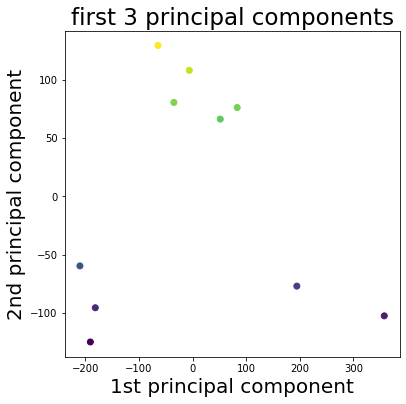

In [1330]:
# Plot the 1st principal component aginst the 2nd and use the 3rd for color
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(pca_result[:, 0], pca_result[:, 1], c=pca_result[:, 1])
ax.set_xlabel('1st principal component', fontsize=20)
ax.set_ylabel('2nd principal component', fontsize=20)
ax.set_title('first 3 principal components', fontsize=23)

fig.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

# kmeans

In [1331]:
# FROM https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/
distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,6) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(one_d_values) 
    kmeanModel.fit(one_d_values)     
      
    distortions.append(sum(np.min(cdist(one_d_values, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / one_d_values.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(one_d_values, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / one_d_values.shape[0] 
    mapping2[k] = kmeanModel.inertia_
    

for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val))

1 : 0.2380599861066585
2 : 0.1763022885564357
3 : 0.12161840600429304
4 : 0.096795031120151
5 : 0.06916286419978866


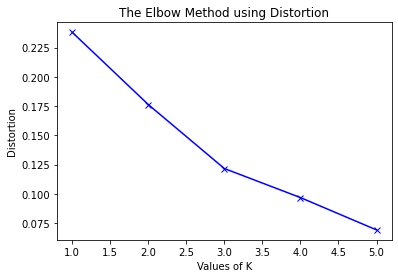

In [1332]:
plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show()

In [1333]:
import csv 
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

range_n_clusters = [2,3,4,5,6]

for i in range_n_clusters:
    clusterer = KMeans(n_clusters=i,random_state = 10)
    cluster_labels = clusterer.fit_predict(one_d_t)
    silhouette_avg = silhouette_score(one_d_t, cluster_labels)
    print('For',i,'clusters',
         'average silhouette score is:',silhouette_avg)
    

For 2 clusters average silhouette score is: 0.31879231429950294
For 3 clusters average silhouette score is: 0.41101263443035013
For 4 clusters average silhouette score is: 0.3913100397540106
For 5 clusters average silhouette score is: 0.34559958292723386
For 6 clusters average silhouette score is: 0.27486940951803673


In [1334]:
kk = KMeans(n_clusters=2)
kk.fit(one_d_values)
y_kk= kk.predict(one_d_values)

result= kk.labels_
one_d_t['label']=result

In [1335]:
one_d_t

,0,1,2,3,4,5,6,7,8,9,...,53811,53812,53813,53814,53815,53816,53817,53818,53819,label
1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0
2,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1
3,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,5.795746e-17,3.382487e-19,1.291562e-21,3.322886e-24,5.608798e-27,6.418187e-30,4.785914e-33,2.370092e-36,7.647867e-40,0
5,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.503246e-44,1.543390e-41,5.227098e-39,1.378641e-36,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1
6,2.740763e-03,2.659174e-03,2.554578e-03,2.453864e-03,2.394224e-03,2.377879e-03,2.380100e-03,2.394351e-03,2.446522e-03,2.552275e-03,...,6.797385e-39,4.813460e-41,2.942727e-43,1.401298e-45,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1
7,2.645782e-04,6.402042e-04,1.251909e-03,1.979876e-03,2.571986e-03,2.871944e-03,2.975523e-03,3.067927e-03,3.193635e-03,3.291320e-03,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1
8,1.047355e-24,1.908824e-23,2.860405e-22,3.524481e-21,3.571158e-20,2.976233e-19,2.041297e-18,1.153720e-17,5.390571e-17,2.097818e-16,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1
9,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0
10,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0
11,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0


# Clustering based on expression only (no brain_shape)

In [1447]:
#d_frame1
#coord_resamp_list = list(h5_file1['output_map']['twod']['coordinates_resampled'])
#x1 = [i[0] for i in coord_resamp_list]
#y1 = [i[1] for i in coord_resamp_list]
#z1 = list(h5_file1['output_map']['twod']['expression_resampled'])
#d_frame1 = pd.DataFrame({'case':'one','x':x1,'y':y1,'z':z1})

filename1_raw = '4_4C_rzrb_L4 (2).h5'
h5_file1_raw = h5py.File(filename1_raw,'r')

filename2_raw = '4_4A_rzrb_L4 (2).h5'
h5_file2_raw = h5py.File(filename2_raw,'r')

filename3_raw = '52_8A_rzrb_L4 (1).h5'
h5_file3_raw = h5py.File(filename3_raw,'r')

filename4_raw = '12_3C_rzrb_L4 (1).h5'
h5_file4_raw = h5py.File(filename4_raw,'r')

filename5_raw = '46_12A_rzrb_L4 (1).h5'
h5_file5_raw = h5py.File(filename5_raw,'r')

filename6_raw = '5_8B_rzrb_L4 (1).h5'
h5_file6_raw = h5py.File(filename6_raw,'r')

filename7_raw = '5_8C_rzrb_L4 (1).h5'
h5_file7_raw = h5py.File(filename7_raw,'r')

filename8_raw = '1_7C_rzrb_L4 (1).h5'
h5_file8_raw = h5py.File(filename8_raw,'r')

filename9_raw = 'DS1_mouse_rzrb (1).h5'
h5_file9_raw = h5py.File(filename9_raw,'r')

filename10_raw = 'DS2_mouse_rzrb.h5'
h5_file10_raw = h5py.File(filename10_raw,'r')

filename11_raw = 'DS3_mouse_rzrb.h5'
h5_file11_raw = h5py.File(filename11_raw,'r')






filename12_23_raw = '1_10E_id2_L23.h5'
h5_file12_23_raw = h5py.File(filename12_23_raw,'r')

filename13_23_raw = '10_3B_id2_L23.h5'
h5_file13_23_raw = h5py.File(filename13_23_raw,'r')

filename14_23_raw = '12_3A_id2_L23.h5'
h5_file14_23_raw = h5py.File(filename14_23_raw,'r')

filename15_23_raw = '64_8A_id2_L23.h5'
h5_file15_23_raw = h5py.File(filename15_23_raw,'r')

filename16_23_raw = '65_8A_id2_L23 (1).h5'
h5_file16_23_raw = h5py.File(filename16_23_raw,'r')

filename17_23_raw = '65_7E_id2_L23 (2).h5'
h5_file17_23_raw = h5py.File(filename17_23_raw,'r')

filename18_23_raw = '66_6B_id2_L23 (1).h5'
h5_file18_23_raw = h5py.File(filename18_23_raw,'r')

filename19_23_raw = 'DS4_mouse_id2_L23.h5'
h5_file19_23_raw = h5py.File(filename19_23_raw,'r')

filename20_23_raw = 'DS5_mouse_id2_L23.h5'
h5_file20_23_raw = h5py.File(filename20_23_raw,'r')

filename21_23_raw = 'DS6_mouse_id2_L23.h5'
h5_file21_23_raw = h5py.File(filename21_23_raw,'r')

In [1399]:
len(list(h5_file17_23_raw['Frame001']['signal']['postproc']['boxes']['means_autoscaled']))

150

In [1449]:
file_list = [h5_file12_23_raw, h5_file13_23_raw, h5_file14_23_raw, h5_file15_23_raw, h5_file16_23_raw,
            h5_file17_23_raw, h5_file18_23_raw, h5_file19_23_raw, h5_file20_23_raw, h5_file21_23_raw,
            
            h5_file1_raw, h5_file2_raw, h5_file3_raw, h5_file4_raw, h5_file5_raw, h5_file6_raw,h5_file7_raw,
            h5_file8_raw,h5_file9_raw,h5_file10_raw,h5_file11_raw] #[all names of h5's in here:]

all_h5_frame_list = []

for h5_file in file_list: 
        
        this_df_slices = []
        
        bins = np.arange(1,151,1)
        
        slice_list = list(h5_file)
        slice_list = slice_list[:-5]
        
        slice_count = 1 
        
        for slices in slice_list: 
             
            this_slice_signal = list(h5_file[slices]['signal']['postproc']['boxes']['means_autoscaled'])
        
            this_df = pd.DataFrame({'slice_number':slice_count, 'bin_number':bins, 'signal':this_slice_signal})
            
            this_df_slices.append(this_df)
                                   
            slice_count += 1
                                   
        
        one_file = pd.concat(this_df_slices)
        
        one_file_pivot = one_file.pivot('bin_number','slice_number','signal') 
        
        all_h5_frame_list.append(one_file_pivot)
                                   

In [1450]:
from skimage.transform import resize

reshaped_maps = [] 
    
for maps in all_h5_frame_list:
    this_map = maps.values
    resized_map = resize(this_map,(150,55)) 
    reshaped_maps.append(resized_map)

<AxesSubplot:>

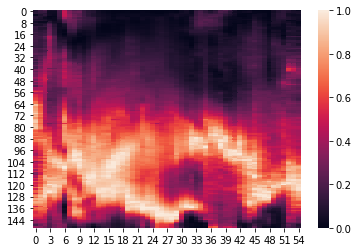

In [1472]:
# test out a few to check and make sure it works: 
sns.heatmap(reshaped_maps[20])

In [1473]:
d_frame12_23_flatten_bins = reshaped_maps[0].flatten()
d_frame13_23_flatten_bins = reshaped_maps[1].flatten()
d_frame14_23_flatten_bins = reshaped_maps[2].flatten()
d_frame15_23_flatten_bins = reshaped_maps[3].flatten()
d_frame16_23_flatten_bins = reshaped_maps[4].flatten()
d_frame17_23_flatten_bins = reshaped_maps[5].flatten()
d_frame18_23_flatten_bins = reshaped_maps[6].flatten()
d_frame19_23_flatten_bins = reshaped_maps[7].flatten()
d_frame20_23_flatten_bins = reshaped_maps[8].flatten()
d_frame21_23_flatten_bins = reshaped_maps[9].flatten()


d_frame1_flatten_bins = reshaped_maps[10].flatten()
d_frame2_flatten_bins = reshaped_maps[11].flatten()
d_frame3_flatten_bins = reshaped_maps[12].flatten()
d_frame4_flatten_bins = reshaped_maps[13].flatten()
d_frame5_flatten_bins = reshaped_maps[14].flatten()
d_frame6_flatten_bins = reshaped_maps[15].flatten()
d_frame7_flatten_bins = reshaped_maps[16].flatten()
d_frame8_flatten_bins = reshaped_maps[17].flatten()
d_frame9_flatten_bins = reshaped_maps[18].flatten()
d_frame10_flatten_bins = reshaped_maps[19].flatten()
d_frame11_flatten_bins = reshaped_maps[20].flatten()

In [1474]:
# 10/10 prediction
#For 2 clusters average silhouette score is: 0.41069119194780707
#For 3 clusters average silhouette score is: 0.5134744845959747
#For 4 clusters average silhouette score is: 0.5325382435195021
#one_d_frame = pd.DataFrame({
#'12_23':d_frame15_23_flatten_bins,
#'13_23':d_frame15_23_flatten_bins,
#'14_23':d_frame15_23_flatten_bins,
#'15_23':d_frame15_23_flatten_bins, 
#'16_23':d_frame16_23_flatten_bins,
#'17_23':d_frame17_23_flatten_bins,
#'18_23':d_frame18_23_flatten_bins, 
#'19_23':d_frame19_23_flatten_bins,
#'20_23':d_frame20_23_flatten_bins,
#'21_23':d_frame21_23_flatten_bins})


# 9/11 prediction
#For 2 clusters average silhouette score is: 0.15565060112566984
#For 3 clusters average silhouette score is: 0.18575542894897829
#For 4 clusters average silhouette score is: 0.25413465262852825
one_d_frame = pd.DataFrame({
'1':d_frame1_flatten_bins,
'2':d_frame2_flatten_bins,
'3':d_frame3_flatten_bins,
'4':d_frame4_flatten_bins, 
'5':d_frame4_flatten_bins,
'6':d_frame6_flatten_bins,
'7':d_frame7_flatten_bins, 
'8':d_frame8_flatten_bins,
'9':d_frame9_flatten_bins,
'10':d_frame10_flatten_bins,
'11':d_frame11_flatten_bins,})



one_d_t = one_d_frame.T

one_d_values = one_d_t.values


# Apply min-max scaling
#scaler= sk.preprocessing.MinMaxScaler()
scaler =sk.preprocessing.StandardScaler()
#scaler = sk.preprocessing.RobustScaler()
#scaler = sk.preprocessing.Normalizer()
dataset_scaled = scaler.fit_transform(one_d_values)

In [1475]:
range_n_clusters = [2,3,4,5,6]

for i in range_n_clusters:
    clusterer = KMeans(n_clusters=i,random_state = 10)
    cluster_labels = clusterer.fit_predict(one_d_t)
    silhouette_avg = silhouette_score(one_d_t, cluster_labels)
    print('For',i,'clusters',
         'average silhouette score is:',silhouette_avg)
    

For 2 clusters average silhouette score is: 0.15565060112566984
For 3 clusters average silhouette score is: 0.18575542894897829
For 4 clusters average silhouette score is: 0.25413465262852825
For 5 clusters average silhouette score is: 0.24893984729613391
For 6 clusters average silhouette score is: 0.2485875260525468


In [1476]:
kk = KMeans(n_clusters=2)
kk.fit(one_d_values)
y_kk= kk.predict(one_d_values)

result= kk.labels_
one_d_t['label']=result

In [1477]:
one_d_t

,0,1,2,3,4,5,6,7,8,9,...,8241,8242,8243,8244,8245,8246,8247,8248,8249,label
1,0.198659,0.184222,0.097600,0.044876,0.003452,0.001106,0.002360,0.004147,0.005889,0.007498,...,0.017334,0.000943,0.002200,0.014194,0.024897,0.010670,0.079943,0.399713,0.453008,1
2,0.329586,0.305691,0.289183,0.312748,0.518475,0.391611,0.164811,0.050743,0.088044,0.074865,...,0.113053,0.159058,0.146342,0.072421,0.037930,0.151395,0.322537,0.504256,0.621103,0
3,0.561887,0.249355,0.087021,0.042065,0.041907,0.100360,0.276980,0.241937,0.116443,0.063530,...,0.162762,0.322416,0.902042,0.671807,0.583064,0.464063,0.593029,0.877001,0.477256,0
4,0.204005,0.196462,0.222324,0.240044,0.135628,0.031211,0.004833,0.001655,0.002016,0.006224,...,0.288945,0.299083,0.337310,0.381721,0.446931,0.512140,0.701799,0.899755,0.842018,1
5,0.204005,0.196462,0.222324,0.240044,0.135628,0.031211,0.004833,0.001655,0.002016,0.006224,...,0.288945,0.299083,0.337310,0.381721,0.446931,0.512140,0.701799,0.899755,0.842018,1
6,0.490988,0.522024,0.493295,0.405264,0.435944,0.307122,0.177860,0.097814,0.053427,0.018268,...,0.351761,0.114893,0.445283,0.765289,0.945657,0.867690,0.623503,0.607511,0.757971,1
7,0.603870,0.274600,0.069383,0.061657,0.097516,0.374335,0.377765,0.289097,0.219650,0.224839,...,0.032915,0.118460,0.204841,0.230995,0.212691,0.252601,0.259642,0.219543,0.158294,1
8,0.619383,0.424205,0.282153,0.270529,0.288178,0.286363,0.163166,0.019506,0.010209,0.079142,...,0.313519,0.480510,0.458852,0.472373,0.638991,0.532693,0.727917,0.915683,0.969171,1
9,0.032851,0.102204,0.190582,0.152929,0.187281,0.205492,0.138605,0.065511,0.035787,0.099432,...,0.176766,0.249170,0.369254,0.430430,0.475000,0.480777,0.371398,0.252489,0.189615,0
10,0.156264,0.135515,0.112877,0.138215,0.214219,0.233706,0.086572,0.186579,0.279676,0.238240,...,0.039773,0.101935,0.162274,0.151798,0.132369,0.111938,0.101609,0.236059,0.332637,0


# Medial-Lateral Line and Box Plots

In [639]:
# this is all vole cases 
all_vole_id2_L23 = pd.concat([d_frame12_23,d_frame13_23,d_frame14_23, d_frame15_23,
                              d_frame16_23,d_frame17_23, d_frame18_23])
all_vole_id2_L5 = pd.concat([d_frame12_5,d_frame13_5,d_frame14_5, 
                             d_frame15_5,d_frame16_5,d_frame17_5, d_frame18_5])
all_vole_id2_L6 = pd.concat([d_frame12_6,d_frame13_6,d_frame14_6,
                             d_frame15_6,d_frame16_6,d_frame17_6, d_frame18_6])


# this is just the good vole cases
#all_vole_id2_L23 = pd.concat([d_frame15_23,d_frame16_23,d_frame17_23, d_frame18_23])
#all_vole_id2_L5 = pd.concat([d_frame15_5,d_frame16_5,d_frame17_5, d_frame18_5])
#all_vole_id2_L6 = pd.concat([d_frame15_6,d_frame16_6,d_frame17_6, d_frame18_6])


all_mouse_id2_L23 = pd.concat([d_frame19_23,d_frame20_23,d_frame21_23])
all_mouse_id2_L5 = pd.concat([d_frame19_5,d_frame20_5,d_frame21_5])
all_mouse_id2_L6 = pd.concat([d_frame19_6,d_frame20_6,d_frame21_6])


#all_vole_rzrb = pd.concat([d_frame1,d_frame2,d_frame3,d_frame5,d_frame6,d_frame7,
#                          d_frame8])

all_vole_rzrb = pd.concat([d_frame1,d_frame2,d_frame3,d_frame4,
                           d_frame5,d_frame6,d_frame7,d_frame8])


all_mouse_rzrb = pd.concat([d_frame9,d_frame10,d_frame11])
#all_mouse_rzrb = pd.concat([d_frame9_TFDS2,d_frame10_noTF,d_frame11_TFDS2])


# add in some grouping for vole
all_vole_id2_L23['species'] = 'vole'
all_vole_id2_L5['species'] = 'vole'
all_vole_id2_L6['species'] = 'vole'
all_vole_rzrb['species'] = 'vole'

all_vole_id2_L23['layer'] = 'two-three'
all_vole_id2_L5['layer'] = 'five'
all_vole_id2_L6['layer'] = 'six'
all_vole_rzrb['layer'] = 'four'


# add in some grouping for mouse
all_mouse_id2_L23['species'] = 'mouse'
all_mouse_id2_L5['species'] = 'mouse'
all_mouse_id2_L6['species'] = 'mouse'
all_mouse_rzrb['species'] = 'mouse'

all_mouse_id2_L23['layer'] = 'two-three'
all_mouse_id2_L5['layer'] = 'five'
all_mouse_id2_L6['layer'] = 'six'
all_mouse_rzrb['layer'] = 'four'




In [640]:
all_data_rzrb = pd.concat([all_vole_rzrb,all_mouse_rzrb])
all_data_id2_L23 = pd.concat([all_vole_id2_L23,all_mouse_id2_L23])
all_data_id2_L5 = pd.concat([all_vole_id2_L5,all_mouse_id2_L5])
all_data_id2_L6 = pd.concat([all_vole_id2_L6,all_mouse_id2_L6])

all_data_id2 = pd.concat([all_data_id2_L23, all_data_id2_L5, all_data_id2_L6])
all_data_id2_mouse = pd.concat([all_vole_id2_L23, all_vole_id2_L5, all_vole_id2_L6])
all_data_id2_vole = pd.concat([all_mouse_id2_L23, all_mouse_id2_L5, all_mouse_id2_L6])

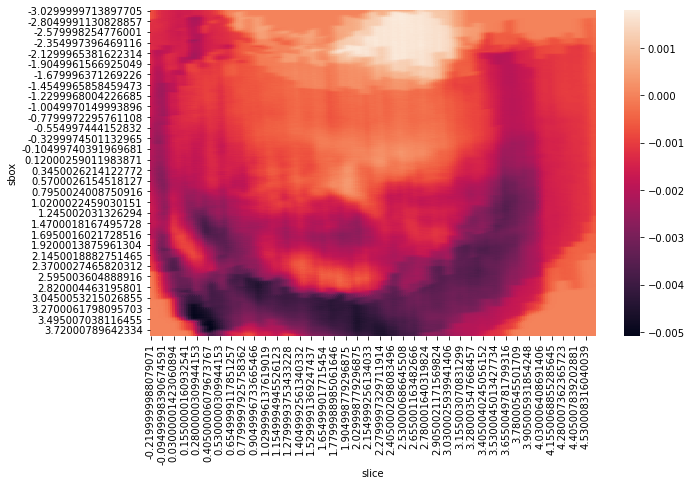

In [641]:
plt.figure(figsize=(10, 6))
ax = sns.heatmap(data_pivot_minus)
#ax.set_ylim(-3,3)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='y', ylabel='z'>

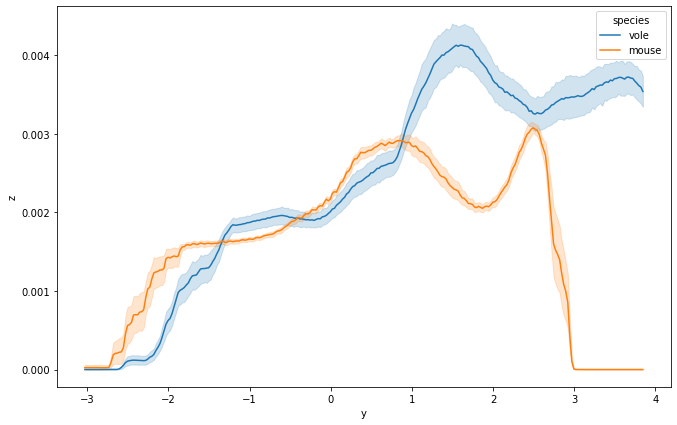

In [642]:
all_data_sliced = all_data_rzrb.loc[(all_data_rzrb.x > 1.8) & (all_data_rzrb.x < 2.1)].copy()
new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='species',data=all_data_sliced)

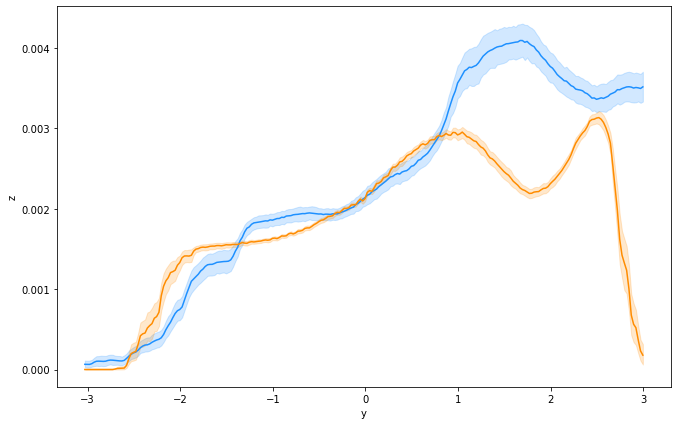

In [682]:
all_data_sliced = all_data_rzrb.loc[(all_data_rzrb.x > 1.5) & (all_data_rzrb.x < 2.0)].copy()
all_data_sliced_cut = all_data_sliced.loc[all_data_sliced.y < 3.0].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

my_pal= {'mouse':'darkorange','vole':'dodgerblue'}

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='species',data=all_data_sliced_cut, palette = my_pal,legend=False)
plt.savefig('stfish_ml_graph_rzrb.pdf')

<Figure size 792x504 with 0 Axes>

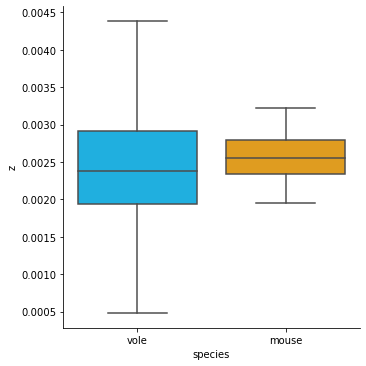

In [683]:
bar_frame = all_data_sliced.loc[(all_data_sliced.y > 0) & 
                                (all_data_sliced.y < 0.75)].copy()

my_pal= {'mouse':'orange','vole':'deepskyblue'}

plt.figure(figsize=(11, 7))

sns.catplot(x="species", y="z",palette= my_pal,data=bar_frame,
            kind='box',whis=1.5,legend=False,showfliers=False) #linewidth=2.5
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')
plt.savefig('stfish_boxplot1_rzrb.pdf')

In [684]:
lad_mod = smf.ols(formula = 'z ~ species*y', data = bar_frame)
result_of_anova = lad_mod.fit()
print(result_of_anova.summary())

                            OLS Regression Results                            
Dep. Variable:                      z   R-squared:                       0.077
Model:                            OLS   Adj. R-squared:                  0.077
Method:                 Least Squares   F-statistic:                     184.3
Date:                Tue, 02 Mar 2021   Prob (F-statistic):          9.19e-115
Time:                        12:56:04   Log-Likelihood:                 38991.
No. Observations:                6600   AIC:                        -7.797e+04
Df Residuals:                    6596   BIC:                        -7.795e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.0022   3.15e-0

<Figure size 792x504 with 0 Axes>

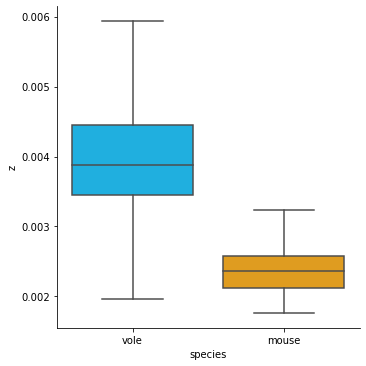

In [685]:
bar_frame = all_data_sliced.loc[(all_data_sliced.y > 1.25) & 
                                (all_data_sliced.y < 2)].copy()

my_pal= {'mouse':'orange','vole':'deepskyblue'}

plt.figure(figsize=(11, 7))

sns.catplot(x="species", y="z",palette= my_pal,data=bar_frame,
            kind='box',whis=1.5,legend=False, showfliers=False)
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')
plt.savefig('stfish_boxplot2_rzrb.pdf')

In [686]:
lad_mod = smf.ols(formula = 'z ~ species*y', data = bar_frame)
result_of_anova = lad_mod.fit()
print(result_of_anova.summary())

                            OLS Regression Results                            
Dep. Variable:                      z   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.274
Method:                 Least Squares   F-statistic:                     831.8
Date:                Tue, 02 Mar 2021   Prob (F-statistic):               0.00
Time:                        12:56:28   Log-Likelihood:                 35174.
No. Observations:                6600   AIC:                        -7.034e+04
Df Residuals:                    6596   BIC:                        -7.031e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.0036      0.00

In [648]:
all_data_sliced.head()

,case,x,y,z,species,layer
69,one,1.504999,-3.03,0.0,vole,four
70,one,1.529999,-3.03,0.0,vole,four
71,one,1.554999,-3.03,0.0,vole,four
72,one,1.579999,-3.03,0.0,vole,four
73,one,1.604999,-3.03,0.0,vole,four


# id2 layer 2/3 comparison 

In [361]:
data_pivot_id2_L23_minus = data_pivot_vole_id2_L23 - data_pivot_mouse_id2_L23
data_pivot_id2_L5_minus = data_pivot_vole_id2_L5 - data_pivot_mouse_id2_L5
data_pivot_id2_L6_minus = data_pivot_vole_id2_L6 - data_pivot_mouse_id2_L6

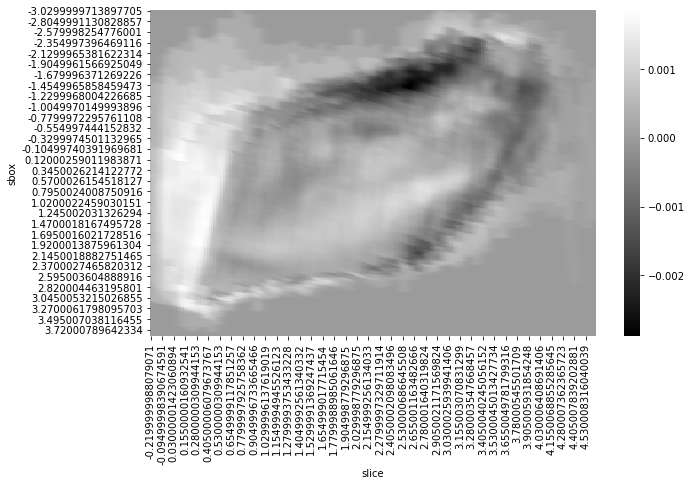

In [720]:
plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_id2_L23_minus, cmap='gray')
plt.savefig('stfsh_vole_minus_mouse_id2_L23.pdf')

<AxesSubplot:xlabel='y', ylabel='z'>

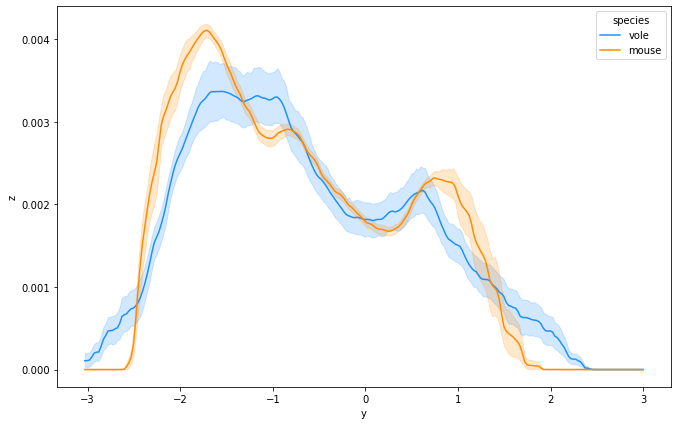

In [737]:
all_data_sliced = all_data_id2_L23.loc[(all_data_id2_L23.x > 3.2) & 
                                               (all_data_id2_L23.x < 3.5)].copy()

all_data_sliced_cut = all_data_sliced.loc[all_data_sliced.y < 3.0].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

my_pal= {'mouse':'darkorange','vole':'dodgerblue'}

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='species',data=all_data_sliced_cut,palette = my_pal)

#plt.savefig('stlfsh_id2_l23.pdf')

In [954]:
# Auto and time series correlation stuff below
from numpy import inf

<AxesSubplot:xlabel='sbox', ylabel='values'>

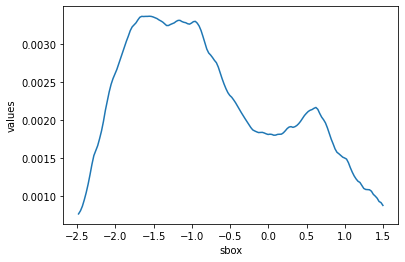

In [1001]:
vole_23_sliced = vole_avg_23.loc[(vole_avg_23.slice > 3.2) & 
                                               (vole_avg_23.slice < 3.5)].copy()
vole_23_sliced_cut = vole_23_sliced.loc[(vole_23_sliced.sbox < 1.5) &
                                       (vole_23_sliced.sbox > - 2.5)].copy()


sbox_groups = vole_23_sliced_cut.groupby('sbox').groups.keys()
mean_list = []


for sbox in sbox_groups: 
    this_frame = vole_23_sliced_cut.loc[vole_23_sliced_cut.sbox == sbox]
    mean = this_frame['values'].mean()
    mean_list.append((sbox,mean))
        
mean_frame_vole_id2_sliced = pd.DataFrame(mean_list, columns={'sbox','values'})
#mean_frame.head()

sns.lineplot(x='sbox',y='values',data=mean_frame_vole_id2_sliced)

<AxesSubplot:xlabel='sbox', ylabel='values'>

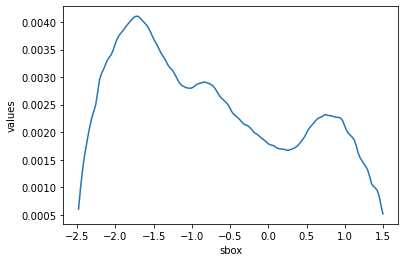

In [1002]:
mouse_23_sliced = mouse_avg_23.loc[(mouse_avg_23.slice > 3.2) & 
                                               (mouse_avg_23.slice < 3.5)].copy()
mouse_23_sliced_cut = mouse_23_sliced.loc[(mouse_23_sliced.sbox < 1.5) &
                                       (mouse_23_sliced.sbox > - 2.5)].copy()


sbox_groups = mouse_23_sliced_cut.groupby('sbox').groups.keys()
mean_list = []


for sbox in sbox_groups: 
    this_frame = mouse_23_sliced_cut.loc[mouse_23_sliced_cut.sbox == sbox]
    mean = this_frame['values'].mean()
    mean_list.append((sbox,mean))
        
mean_frame_mouse_id2_sliced = pd.DataFrame(mean_list, columns={'sbox','values'})
#mean_frame.head()

sns.lineplot(x='sbox',y='values',data=mean_frame_mouse_id2_sliced)

In [1003]:
mean_frame_vole_id2_sliced['pcnt_signal_change'] = mean_frame_vole_id2_sliced['values'].pct_change()
mean_frame_mouse_id2_sliced['pcnt_signal_change'] = mean_frame_mouse_id2_sliced['values'].pct_change()

m, b = np.polyfit(mean_frame_vole_id2_sliced['values'], mean_frame_mouse_id2_sliced['values'], 1)


corr_sig = mean_frame_vole_id2_sliced['values'].corr(mean_frame_mouse_id2_sliced['values'])
#corr_change = mean_frame_vole_id2_sliced['pcnt_signal_change'].corr(mean_frame_mouse_id2_sliced['pcnt_signal_change'])

print('slope is:',m,'','intercept is:',b)
print('correlation of signal is:',corr_sig)
#print('correlation of pct_change is:',corr_change)

#mean_frame_mouse_id2_sliced.head()

slope is: 0.9339886085212951  intercept is: 0.0003816991667073188
correlation of signal is: 0.8601474857843114


In [1004]:
mean_frame_vole_id2_sliced = mean_frame_vole_id2_sliced.reset_index()
mean_frame_mouse_id2_sliced = mean_frame_mouse_id2_sliced.reset_index()


mean_frame_mouse_id2_sliced['pcnt_signal_change'] = mean_frame_mouse_id2_sliced['pcnt_signal_change'].replace([np.inf,-np.inf],np.nan)
mean_frame_vole_id2_sliced['pcnt_signal_change'] = mean_frame_vole_id2_sliced['pcnt_signal_change'].replace([np.inf,-np.inf],np.nan)


rows_with_nan = []
for index, row in mean_frame_mouse_id2_sliced.iterrows():
    is_nan_series = row.isnull()
    if is_nan_series.any():
        rows_with_nan.append(index)
        
mouse_23_sliced_cut = mean_frame_mouse_id2_sliced.drop(rows_with_nan)
vole_23_sliced_cut = mean_frame_vole_id2_sliced.drop(rows_with_nan)

In [1005]:
corr_change = vole_23_sliced_cut['pcnt_signal_change'].corr(mouse_23_sliced_cut['pcnt_signal_change'])
print('correlation of pct_change is:',corr_change)

correlation of pct_change is: 0.5695532839317407


<AxesSubplot:xlabel='sbox', ylabel='pcnt_signal_change'>

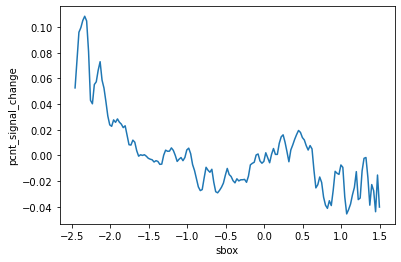

In [1006]:
sns.lineplot(x='sbox',y='pcnt_signal_change',data=vole_23_sliced_cut)

<AxesSubplot:xlabel='sbox', ylabel='pcnt_signal_change'>

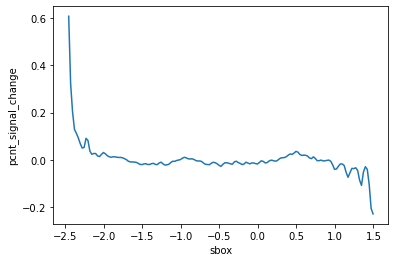

In [1007]:
sns.lineplot(x='sbox',y='pcnt_signal_change',data=mouse_23_sliced_cut)

slope is: 1.306444145723048  intercept is: -0.0006186028304476283


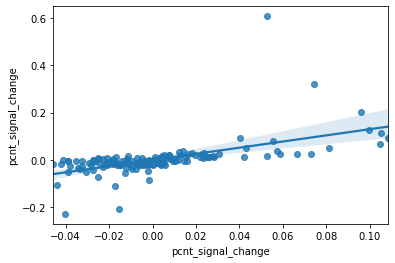

In [1010]:
m, b = np.polyfit(vole_23_sliced_cut['pcnt_signal_change'], 
                  mouse_23_sliced_cut['pcnt_signal_change'], 1)


#corr_sig = mean_frame_vole_id2_sliced['values'].corr(mean_frame_mouse_id2_sliced['values'])
#corr_change = mean_frame_vole_id2_sliced['pcnt_signal_change'].corr(mean_frame_mouse_id2_sliced['pcnt_signal_change'])

print('slope is:',m,'','intercept is:',b)

ax = sns.regplot(x=vole_23_sliced_cut['pcnt_signal_change'], y=mouse_23_sliced_cut['pcnt_signal_change'])

slope is: 1.0971674339806676  intercept is: -5.601119216464563e-05
correlation of signal is: 0.9153143989774822
correlation of pct_change is: 0.9994166845441586


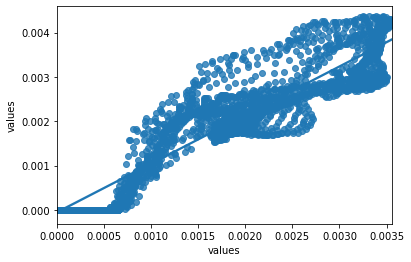

In [917]:
#vole_avg_23.head()
#vole_23_sliced = vole_avg_23.loc[(vole_avg_23.slice > 3.2) & 
#                                               (vole_avg_23.slice < 3.5)].copy()
#vole_23_sliced_cut = vole_23_sliced.loc[(vole_23_sliced.sbox < 2.5) &
#                                       (vole_23_sliced.sbox > - 2.5)].copy()

#mouse_avg_23.head()
#mouse_23_sliced = mouse_avg_23.loc[(mouse_avg_23.slice > 3.2) & 
#                                               (mouse_avg_23.slice < 3.5)].copy()
#mouse_23_sliced_cut = mouse_23_sliced.loc[(mouse_23_sliced.sbox < 2.5) &
#                                       (mouse_23_sliced.sbox > - 2.5)].copy()

# Autocorrelation of return percentages? 

#all_data_sliced_cut.head()
#all_data_sliced_cut_vole = all_data_sliced_cut.loc[all_data_sliced_cut.species=='vole'].copy()
#all_data_sliced_cut_mouse = all_data_sliced_cut.loc[all_data_sliced_cut.species=='mouse'].copy()

#vole_23_sliced_cut['pcnt_signal_change'] = vole_23_sliced_cut['values'].pct_change()
#mouse_23_sliced_cut['pcnt_signal_change'] = mouse_23_sliced_cut['values'].pct_change()

#print(len(vole_23_sliced_cut))
#print(len(mouse_23_sliced_cut))
#plt.scatter(vole_23_sliced_cut['values'], mouse_23_sliced_cut['values'])
#plt.show()
#df.fillna(0)
#vole_23_sliced_cut_fill = vole_23_sliced_cut.fillna(0)
#mouse_23_sliced_cut_fill = mouse_23_sliced_cut.fillna(0)
#f['DataFrame Column'] = df['DataFrame Column'].replace(np.nan, 0)

#mouse_23_sliced_cut['pcnt_signal_change'] = mouse_23_sliced_cut['pcnt_signal_change'].replace([np.inf, -np.inf],np.nan)
#mouse_23_sliced_cut['pcnt_signal_change'] = mouse_23_sliced_cut['pcnt_signal_change'].replace('NaN',0)
#vole_23_sliced_cut['pcnt_signal_change'] = vole_23_sliced_cut['pcnt_signal_change'].replace([np.inf, -np.inf],np.nan)
#vole_23_sliced_cut['pcnt_signal_change'] = vole_23_sliced_cut['pcnt_signal_change'].replace('NaN',0)

#mouse_23_sliced_cut['pcnt_signal_change'] = mouse_23_sliced_cut['pcnt_signal_change'].drop(np.inf)
#mouse_23_sliced_cut['pcnt_signal_change'] = mouse_23_sliced_cut['pcnt_signal_change'].dropna()
#vole_23_sliced_cut['pcnt_signal_change'] = vole_23_sliced_cut['pcnt_signal_change'].drop(np.inf)
#vole_23_sliced_cut['pcnt_signal_change'] = vole_23_sliced_cut['pcnt_signal_change'].drop('NaN')

#mouse_23_sliced_cut = mouse_23_sliced_cut.reset_index()
#vole_23_sliced_cut = vole_23_sliced_cut.reset_index()

#rows_with_nan = []
#for index, row in mouse_23_sliced_cut.iterrows():
#    is_nan_series = row.isnull()
#    if is_nan_series.any():
#        rows_with_nan.append(index)
        
#mouse_23_sliced_cut = mouse_23_sliced_cut.drop(rows_with_nan)
#vole_23_sliced_cut = vole_23_sliced_cut.drop(rows_with_nan)


#m, b = np.polyfit(vole_23_sliced_cut['values'], mouse_23_sliced_cut['values'], 1)


#corr_sig = vole_23_sliced_cut['values'].corr(mouse_23_sliced_cut['values'])
#corr_change = vole_23_sliced_cut['pcnt_signal_change'].corr(mouse_23_sliced_cut['pcnt_signal_change'])

print('slope is:',m,'','intercept is:',b)
print('correlation of signal is:',corr_sig)
print('correlation of pct_change is:',corr_change)



ax = sns.regplot(x=vole_23_sliced_cut['values'], y=mouse_23_sliced_cut['values'])

# layer 5 comparison 

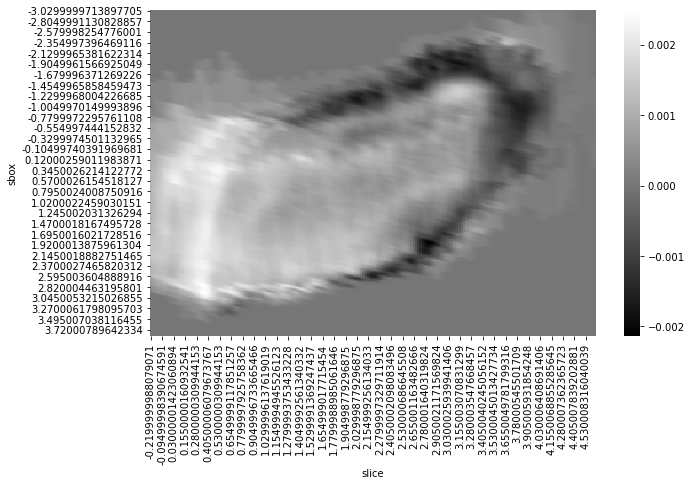

In [725]:
plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_id2_L5_minus, cmap='gray')
#plt.savefig('stlf_mouse_vs.pdf')
#sns.heatmap(data_pivot_id2_L23_minus, cmap='gray')
plt.savefig('stfsh_vole_minus_mouse_id2_L5.pdf')

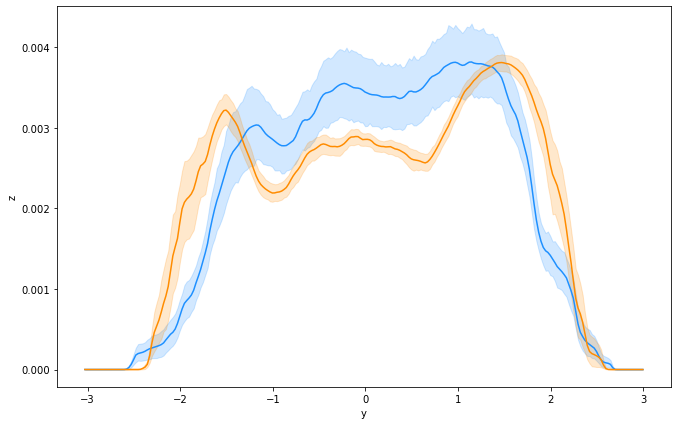

In [726]:
all_data_sliced = all_data_id2_L5.loc[(all_data_id2_L5.x > 2.7) & 
                                               (all_data_id2_L5.x < 3.0)].copy()

all_data_sliced_cut = all_data_sliced.loc[all_data_sliced.y < 3.0].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

my_pal= {'mouse':'darkorange','vole':'dodgerblue'}

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='species',data=all_data_sliced_cut,palette = my_pal,legend=False)

plt.savefig('stlfsh_id2_l5.pdf')

In [366]:
# maybe use a slope change graph or something? or like a rate change? 

# layer 6 comparison

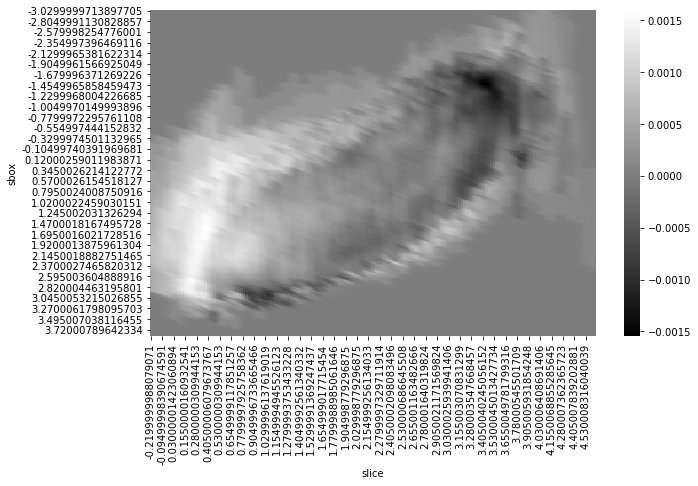

In [728]:
plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_id2_L6_minus,cmap='gray')
#plt.savefig('stlf_mouse_vs.pdf')
plt.savefig('stfsh_vole_minus_mouse_id2_L6.pdf')

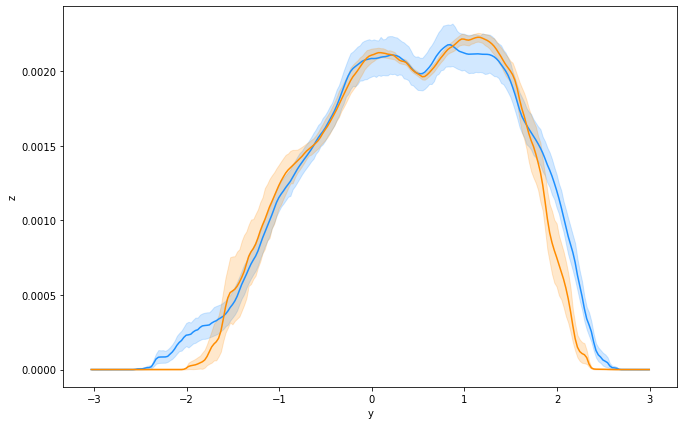

In [727]:
all_data_sliced = all_data_id2_L6.loc[(all_data_id2_L6.x > 2.5) & 
                                               (all_data_id2_L6.x < 2.9)].copy()

all_data_sliced_cut = all_data_sliced.loc[all_data_sliced.y < 3.0].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

my_pal= {'mouse':'darkorange','vole':'dodgerblue'}

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='species',data=all_data_sliced_cut,palette = my_pal,legend=False)

plt.savefig('stlfsh_id2_l6.pdf')

# Compare all data id2 within species across layer

<AxesSubplot:xlabel='y', ylabel='z'>

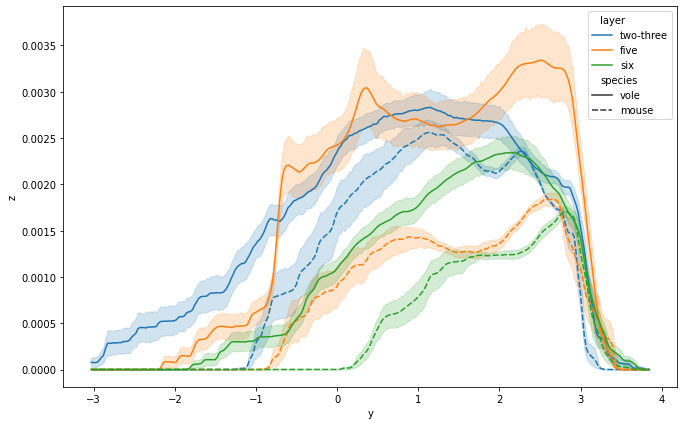

In [391]:
all_data_sliced = all_data_id2.loc[(all_data_id2.x > 0.5) & 
                                               (all_data_id2.x < 0.9)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

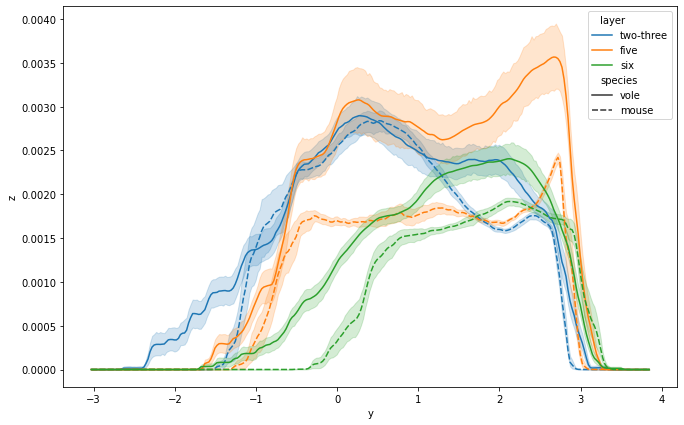

In [392]:
all_data_sliced = all_data_id2.loc[(all_data_id2.x > 1.0) & 
                                               (all_data_id2.x < 1.4)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

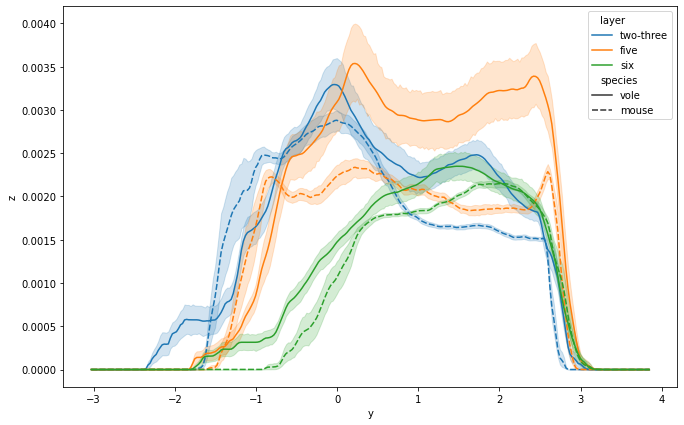

In [393]:
all_data_sliced = all_data_id2.loc[(all_data_id2.x > 1.5) & 
                                               (all_data_id2.x < 1.9)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

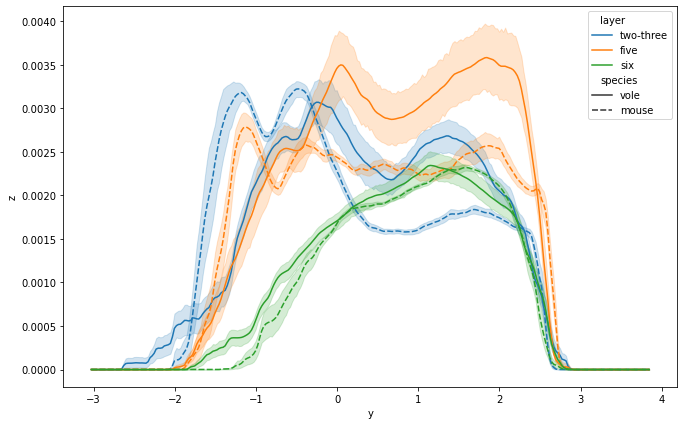

In [394]:
# this graph shows some conserved laminar patterns of gene expression between species 

all_data_sliced = all_data_id2.loc[(all_data_id2.x > 2.0) & 
                                               (all_data_id2.x < 2.4)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

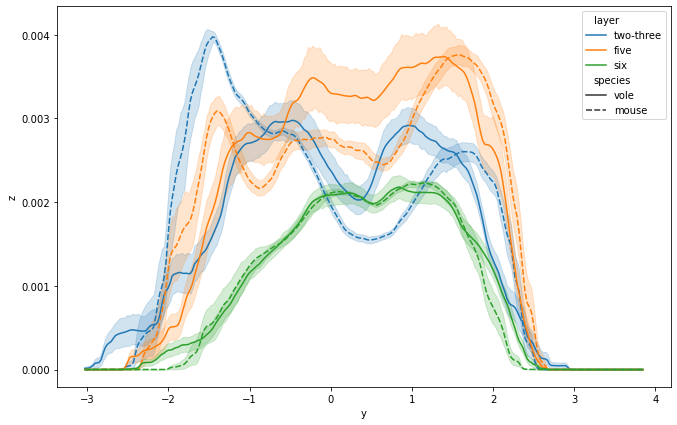

In [395]:
# this graph shows the conservation of laminar expression of id2 in the 
# cortex varies by layer. Tightly conserved in layer 6, and somewhat conserved in the other 
# layers. Now.. what does this mean? that the layer that feeds back to the thalamus 
# shows the most similar pattern between species? is layer 2/3 the most variable?
# and the other layers have more variability in expression. 
# layer 6 expression shows the least variability within and across species. 

all_data_sliced = all_data_id2.loc[(all_data_id2.x > 2.5) & 
                                               (all_data_id2.x < 2.9)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

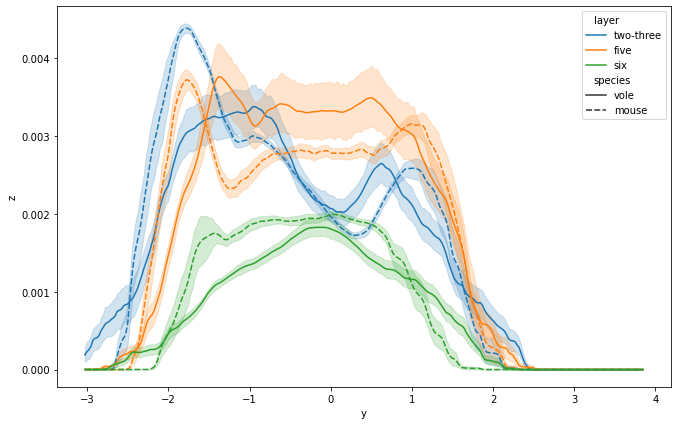

In [397]:
all_data_sliced = all_data_id2.loc[(all_data_id2.x > 3.0) & 
                                               (all_data_id2.x < 3.4)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

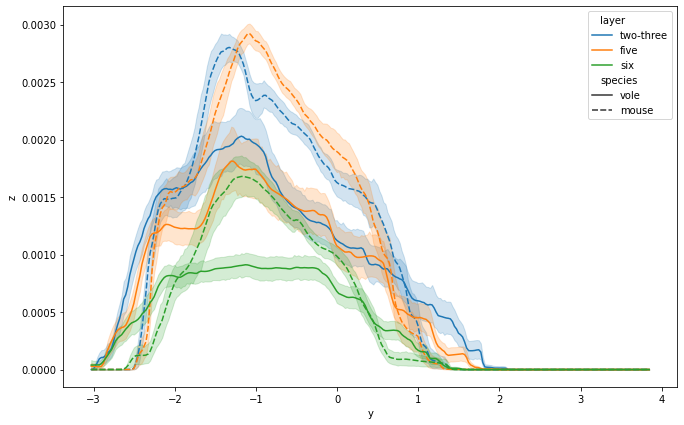

In [398]:
all_data_sliced = all_data_id2.loc[(all_data_id2.x > 3.5) & 
                                               (all_data_id2.x < 3.9)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

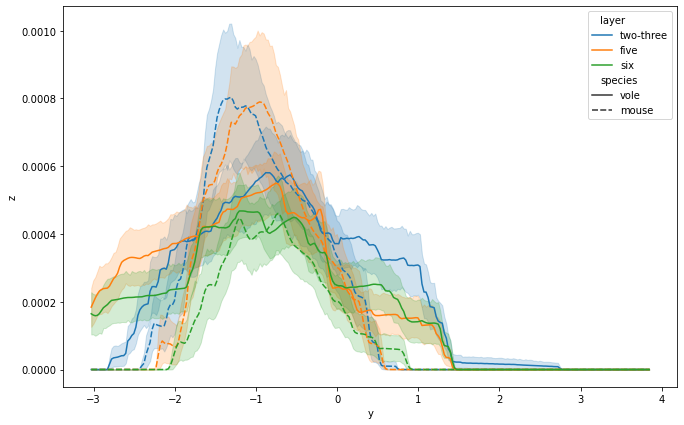

In [399]:
all_data_sliced = all_data_id2.loc[(all_data_id2.x > 4.0) & 
                                               (all_data_id2.x < 4.4)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

# Variance 

In [ ]:
variance_df = pd.DataFrame(columns = ['variance'])

def get_variance(dataframe_pivot):
    for single_row in range(len(dataframe_pivot)): 
        array_frame = dataframe_pivot.iloc[single_row]    
        variance_df.loc[single_row] = [np.var(array_frame)]
        #variance_df.append(single_row,np.var(array_frame))


In [400]:
all_vole_id2_L23.head()

,case,x,y,z,species,layer
0,twelve23,-0.220,-3.03,0.0,vole,two-three
1,twelve23,-0.195,-3.03,0.0,vole,two-three
2,twelve23,-0.170,-3.03,0.0,vole,two-three
3,twelve23,-0.145,-3.03,0.0,vole,two-three
4,twelve23,-0.120,-3.03,0.0,vole,two-three


In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_id2_L5_minus)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

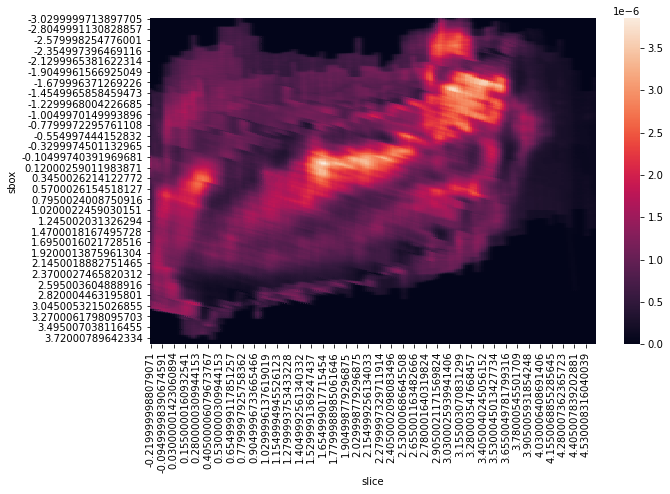

In [431]:
b = all_vole_id2_L23

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
vole_var_id2_L23 = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

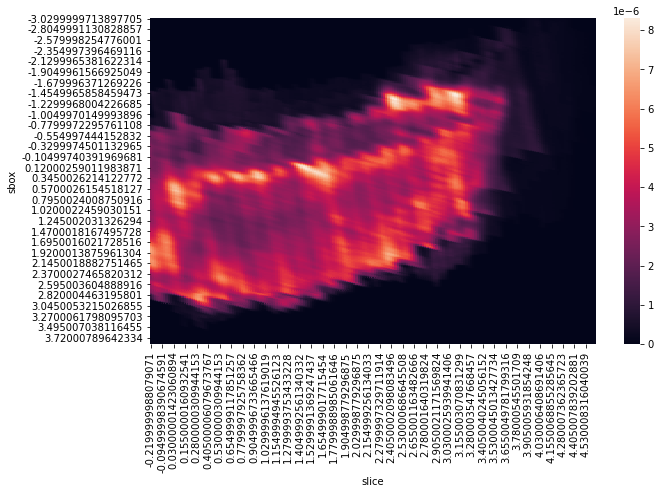

In [437]:
b = all_vole_id2_L5

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
vole_var_id2_L5 = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

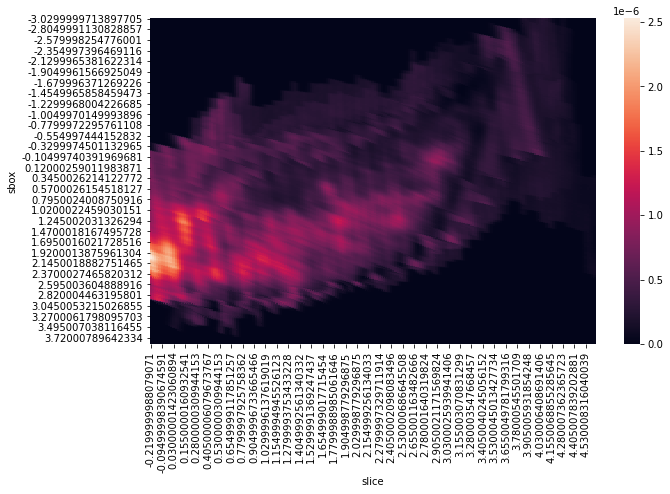

In [438]:
b = all_vole_id2_L6

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
vole_var_id2_L6 = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

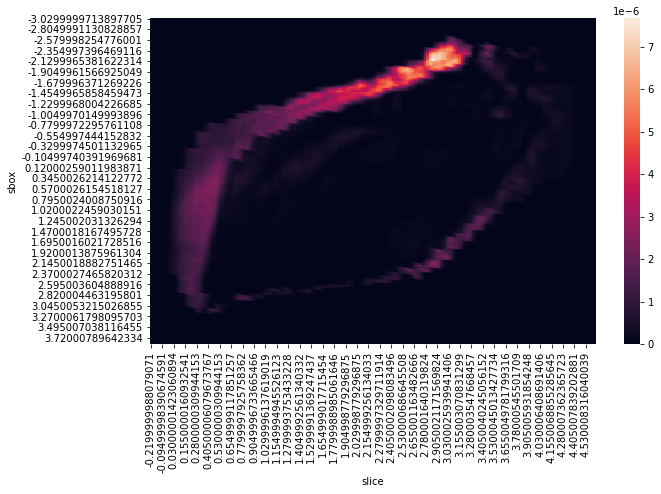

In [439]:
b = all_mouse_id2_L23

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
mouse_var_id2_L23 = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

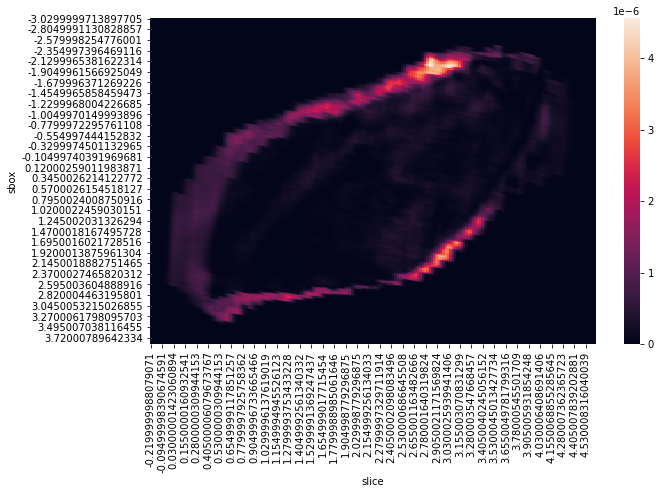

In [440]:
b = all_mouse_id2_L5

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
mouse_var_id2_L5 = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

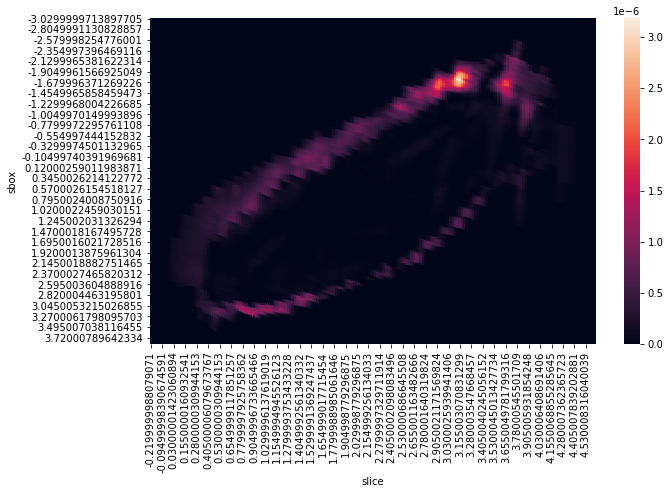

In [441]:
b = all_mouse_id2_L6

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
mouse_var_id2_L6 = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

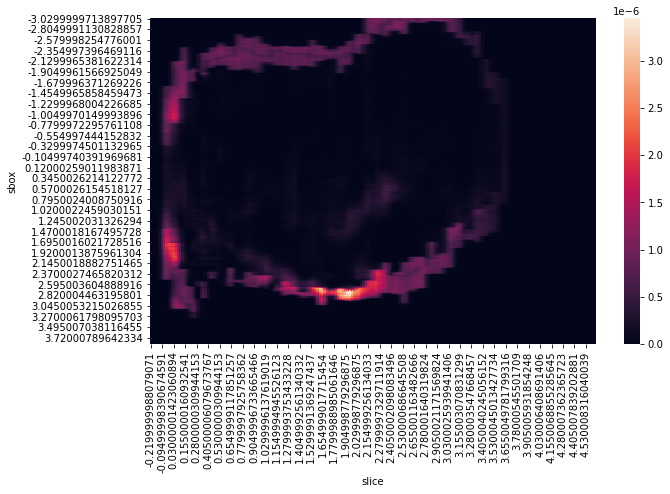

In [449]:
b = all_mouse_rzrb

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
mouse_var_rzrb = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

<AxesSubplot:xlabel='slice', ylabel='sbox'>

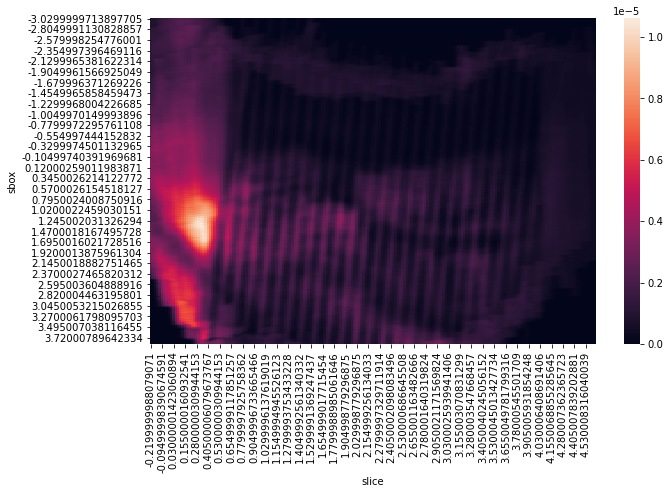

In [450]:
b = all_vole_rzrb

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].var()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
vole_var_rzrb = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

In [451]:
#vole_var_id2_L23.head()

In [452]:
vole_var_id2_L23_ = vole_var_id2_L23.rename(columns={0:'y', 1:'z', 'slice':"x"})
vole_var_id2_L5_ = vole_var_id2_L5.rename(columns={0:'y', 1:'z', 'slice':"x"})
vole_var_id2_L6_ = vole_var_id2_L6.rename(columns={0:'y', 1:'z', 'slice':"x"})

mouse_var_id2_L23_ = mouse_var_id2_L23.rename(columns={0:'y', 1:'z', 'slice':"x"})
mouse_var_id2_L5_ = mouse_var_id2_L5.rename(columns={0:'y', 1:'z', 'slice':"x"})
mouse_var_id2_L6_ = mouse_var_id2_L6.rename(columns={0:'y', 1:'z', 'slice':"x"})

mouse_var_rzrb_ = mouse_var_rzrb.rename(columns={0:'y', 1:'z', 'slice':"x"})
vole_var_rzrb_ = vole_var_rzrb.rename(columns={0:'y', 1:'z', 'slice':"x"})
#vole_var_id2_L23_.head()

In [453]:
vole_var_id2_L23_['layer'] = 'two-three'
vole_var_id2_L5_['layer'] = 'five'
vole_var_id2_L6_['layer'] = 'six'

mouse_var_id2_L23_['layer'] = 'two-three'
mouse_var_id2_L5_['layer'] = 'five'
mouse_var_id2_L6_['layer'] = 'six'

vole_var_rzrb_['layer'] = 'four'
mouse_var_rzrb_['layer'] = 'four'

In [455]:
all_vole_var = pd.concat([vole_var_id2_L23_, vole_var_id2_L5_, 
                         vole_var_id2_L6_, vole_var_rzrb_])



all_mouse_var = pd.concat([mouse_var_id2_L23_, mouse_var_id2_L5_,
                          mouse_var_id2_L6_, mouse_var_rzrb_])

all_vole_var['species'] = 'vole'
all_mouse_var['species'] = 'mouse'


all_var = pd.concat([all_vole_var,all_mouse_var])

<AxesSubplot:xlabel='y', ylabel='z'>

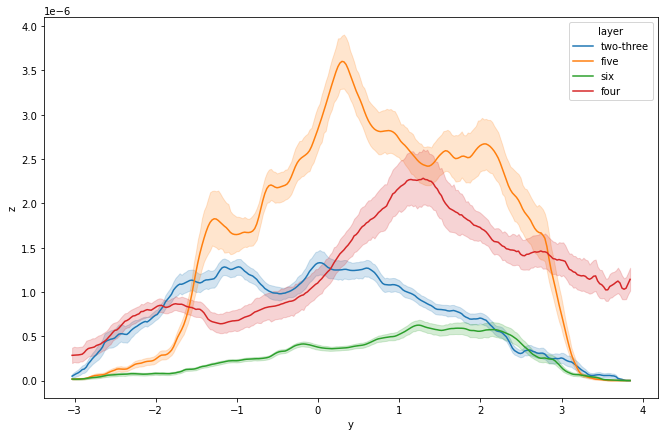

In [456]:
plt.figure(figsize=(11,7))
sns.lineplot(x='y', y='z',hue = 'layer',data=all_vole_var)

<Figure size 792x504 with 0 Axes>

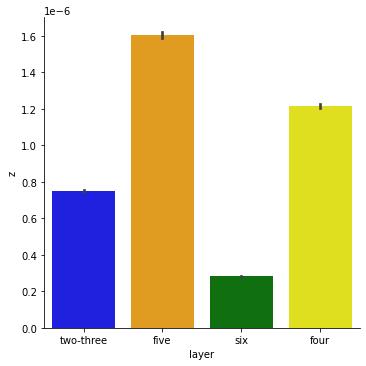

In [464]:
my_pal= {'two-three':'blue','five':'orange','six':'green','four':'yellow'}

plt.figure(figsize=(11, 7))

sns.catplot(x="layer", y="z",palette= my_pal,data=all_vole_var,
            kind='bar',legend=False)
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')

<AxesSubplot:xlabel='y', ylabel='z'>

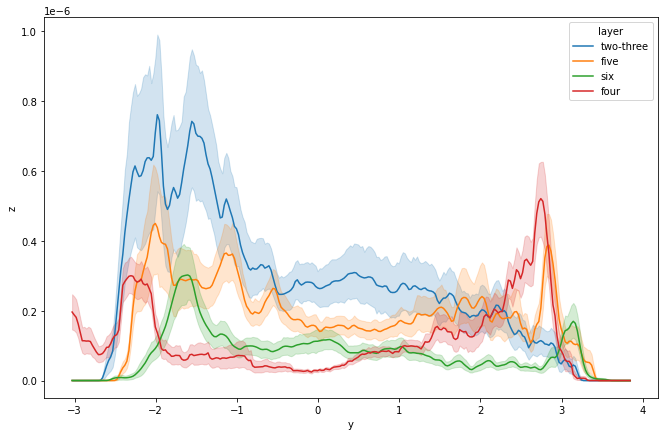

In [457]:
plt.figure(figsize=(11,7))
sns.lineplot(x='y', y='z',hue = 'layer',data=all_mouse_var)

<Figure size 792x504 with 0 Axes>

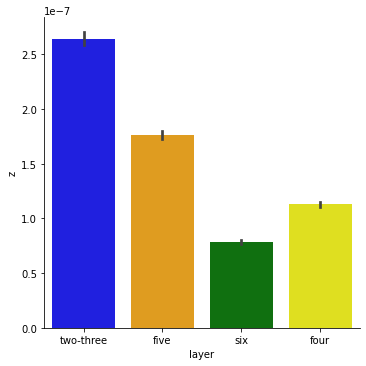

In [463]:
my_pal= {'two-three':'blue','five':'orange','six':'green','four':'yellow'}

plt.figure(figsize=(11, 7))

sns.catplot(x="layer", y="z",palette= my_pal,data=all_mouse_var,
            kind='bar',legend=False)
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')

<AxesSubplot:xlabel='y', ylabel='z'>

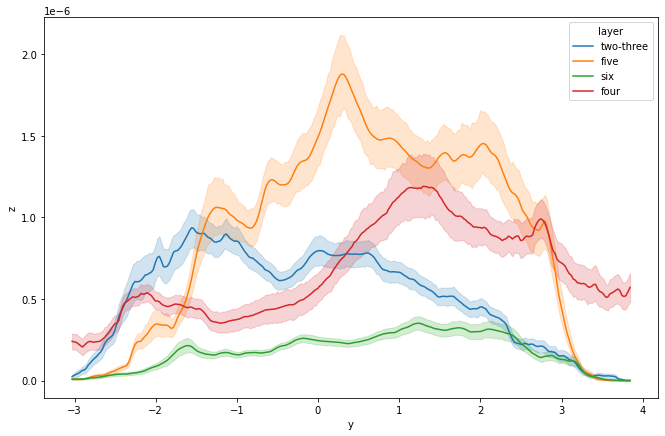

In [458]:
plt.figure(figsize=(11,7))
sns.lineplot(x='y', y='z',hue = 'layer',data=all_var)

<Figure size 792x504 with 0 Axes>

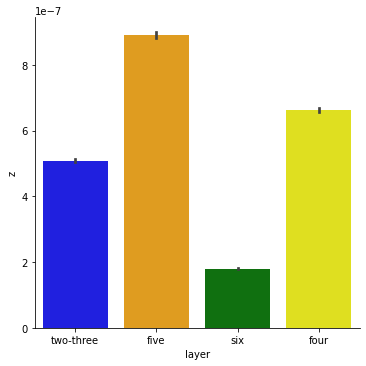

In [467]:
my_pal= {'two-three':'blue','five':'orange','six':'green','four':'yellow'}

plt.figure(figsize=(11, 7))

sns.catplot(x="layer", y="z",palette= my_pal,data=all_var,
            kind='bar',legend=False)
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')

<AxesSubplot:xlabel='y', ylabel='z'>

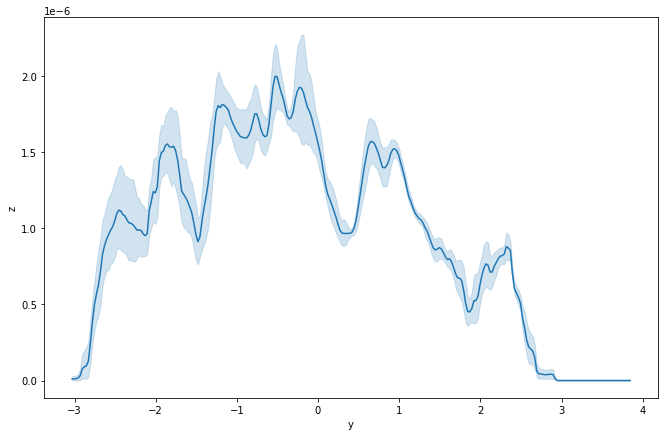

In [436]:
all_data_sliced = vole_var_id2_L23_.loc[(vole_var_id2_L23_.x > 2.5) & 
                                               (vole_var_id2_L23_.x < 2.9)].copy()

#new_slice_groups = all_data_sliced.groupby('x')
#new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
#sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)
sns.lineplot(x='y', y='z',data=all_data_sliced)

<AxesSubplot:xlabel='y', ylabel='z'>

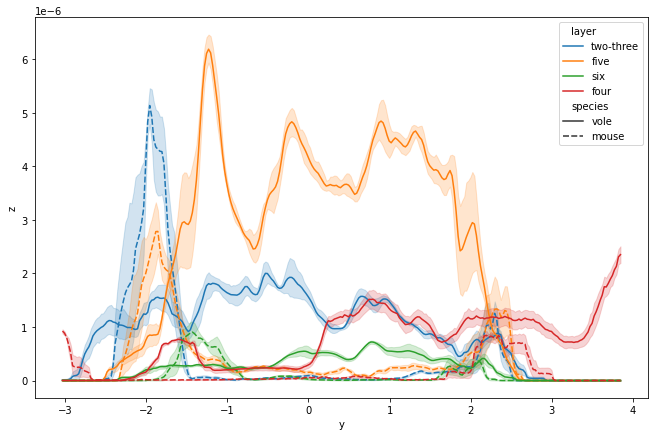

In [472]:
all_data_sliced = all_var.loc[(all_var.x > 2.5) & 
                                               (all_var.x < 2.9)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<Figure size 792x504 with 0 Axes>

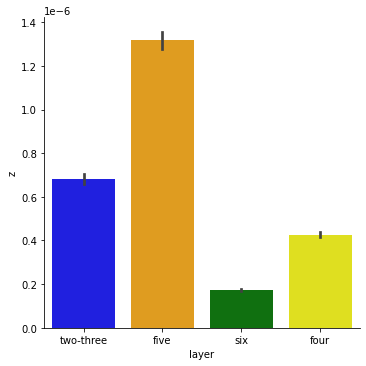

In [473]:
my_pal= {'two-three':'blue','five':'orange','six':'green','four':'yellow'}

plt.figure(figsize=(11, 7))

sns.catplot(x="layer", y="z",palette= my_pal,data=all_data_sliced,
            kind='bar',legend=False)
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')

<AxesSubplot:xlabel='y', ylabel='z'>

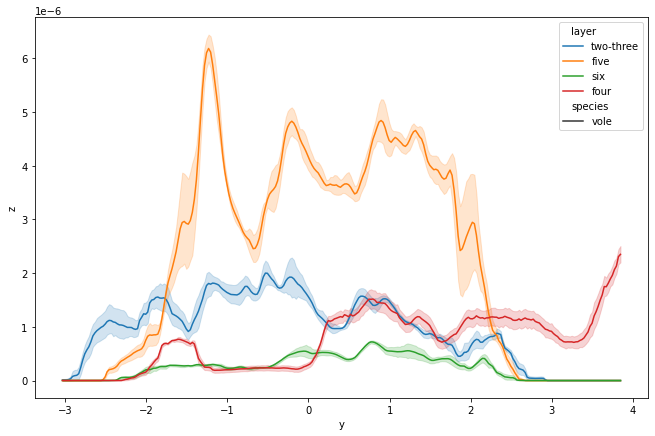

In [474]:
all_data_sliced = all_vole_var.loc[(all_vole_var.x > 2.5) & 
                                               (all_vole_var.x < 2.9)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<Figure size 792x504 with 0 Axes>

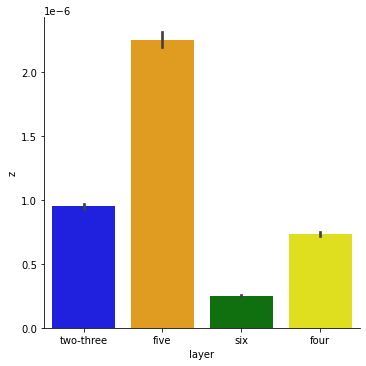

In [475]:
my_pal= {'two-three':'blue','five':'orange','six':'green','four':'yellow'}

plt.figure(figsize=(11, 7))

sns.catplot(x="layer", y="z",palette= my_pal,data=all_data_sliced,
            kind='bar',legend=False)
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')

<AxesSubplot:xlabel='y', ylabel='z'>

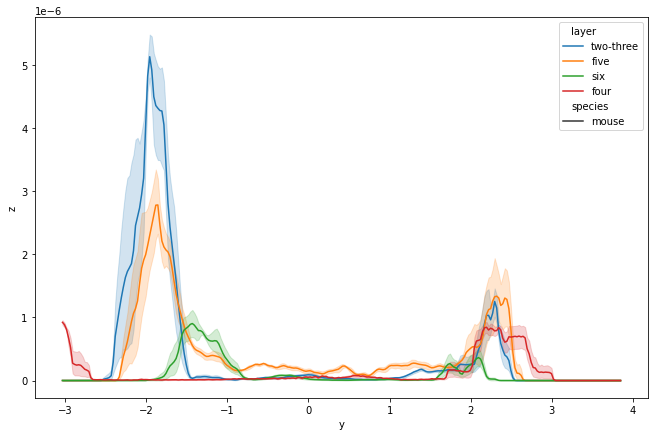

In [476]:
all_data_sliced = all_mouse_var.loc[(all_mouse_var.x > 2.5) & 
                                               (all_mouse_var.x < 2.9)].copy()

new_slice_groups = all_data_sliced.groupby('x')
new_slice_groups.groups.keys()

plt.figure(figsize=(11,7))
sns.lineplot(x='y',y='z',hue='layer',style='species',data=all_data_sliced)

<Figure size 792x504 with 0 Axes>

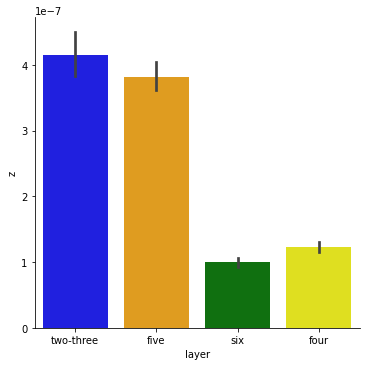

In [477]:
my_pal= {'two-three':'blue','five':'orange','six':'green','four':'yellow'}

plt.figure(figsize=(11, 7))

sns.catplot(x="layer", y="z",palette= my_pal,data=all_data_sliced,
            kind='bar',legend=False)
#plt.savefig('jbjc_monoD_id2_L5_slice_40_42_44_lateralbox.pdf')

In [ ]:
# this is mouse variance

b = pd.concat([d_frame9,d_frame10,d_frame11])

means_again_b = []


slice_groups = b.groupby('x').groups.keys()

for slices in slice_groups: 
    
    this_frame = b.loc[b['x'] == slices]

        
    sbox_groups = this_frame.groupby('y').groups.keys()
        
    mean_list = []

    for sbox in sbox_groups:
        this_sbox = this_frame.loc[this_frame['y'] == sbox]
        #this_mean = this_sbox['interped_slice_mean_center'].mean()
        this_mean = this_sbox['z'].std()
        
        
        mean_list.append((sbox,this_mean))
    
    all_mean_df = pd.DataFrame(mean_list) # this is a dataframe of all of the means for one slice
        
    all_mean_df['slice'] = slices
        
    means_again_b.append(all_mean_df)

    
# and mouse plot
bbbb = pd.concat(means_again_b)
mouse_std = bbbb.rename(columns={0:'sbox', 1:'values', 2:"slice"})

data_pivot_b = mouse_std.pivot('sbox','slice','values')

plt.figure(figsize=(10, 6))
sns.heatmap(data_pivot_b)
#plt.savefig('stlf_mouse_vs.pdf')

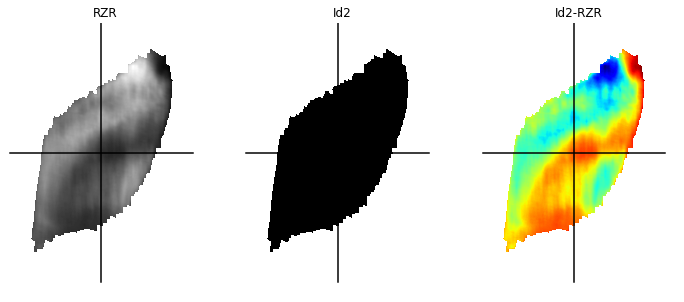

In [49]:
### avgs ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getMask(Z, T=0.0008):
    mask = np.where(Z<T)
    return mask

def combi(fnames, thresh=0.0008):
    Z = getZ(fnames[0])*0.
    BigMask = np.ones(Z.shape)
    for i,j in enumerate(fnames):
        z = getZ(j)
        mask = getMask(z, T=thresh)
        BigMask[mask]=np.nan
        Z = np.dstack([Z,z])
    return Z[:,:,1:], BigMask

#D =['52_8A_rzrb_L4.h5',
#    '46_12A_rzrb_L4.h5',
#    '5_8C_rzrb_L4.h5',
#    '4_4A_rzrb_L4.h5',
#    '1_7C_rzrb_L4.h5',
#    '5_8B_rzrb_L4.h5',
#    '65_7E_id2_L23_3gl.h5',
#    '65_8A_id2_L23_3gl.h5',
#    '66_6B_id2_L23_3gl.h5']

D = [filename19_23, filename20_23,filename21_23,  filename15_23, filename16_23, filename17_23, filename18_23]

Z, Mask = combi(D, 0.00074)

legit = np.where(1-np.isnan(Mask))

rAvg = Mask*np.sum(Z[:,:,0:6],axis=2)/6.0
iAvg = Mask*np.sum(Z[:,:,7:],axis=2)/3.0

# PLOTTING
cmp = 'gray'
ax = True
ax1 = iAvg.shape[1]
ax2 = iAvg.shape[0]

F = pl.figure(figsize=(12,5))

f = F.add_subplot(131)
f.imshow(rAvg,cmap=cmp)
if(ax):
    f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
    f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
f.axis('equal')
f.axis('off')
f.set_title('RZR')

f = F.add_subplot(132)
f.imshow(iAvg,cmap=cmp)
if(ax):
    f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
    f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
f.axis('equal')
f.axis('off')
f.set_title('Id2')

d = (iAvg-rAvg)
m = np.max(np.fabs(d[legit]))
d = d/m
f = F.add_subplot(133)
f.imshow(d,cmap='jet')
if(ax):
    f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
    f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
f.axis('equal')
f.axis('off')
f.set_title('Id2-RZR')

F.savefig('avgs.pdf')

pl.show()


In [ ]:
### plot contours ###

import numpy as np
import pylab as pl
import h5py
import cv2 as cv
import sys

def getZ(fname):
    f = h5py.File(fname,'r')
    x=f['output_map']['twod']['coordinates_resampled'][:,0]
    y=f['output_map']['twod']['coordinates_resampled'][:,1]
    z=f['output_map']['twod']['expression_resampled'][:]
    dims = f['output_map']['twod']['widthheight_resampled'][:]
    X=np.reshape(x, [dims[1],dims[0]])
    Y=np.reshape(y, [dims[1],dims[0]])
    Z=np.reshape(z, [dims[1],dims[0]])
    f.close()
    return Z

def getP(Z, T=0.0008, k1=43, k2=93):

    # Flip on both axes
    Z = np.flipud(Z)
    Z = np.fliplr(Z)

    # Set outside pixels to mean inside (min. edge effects on blurring)
    mask = np.where(Z<T)
    avg = np.mean(Z[np.where(1-Z)])
    Z[mask]=avg

    # Difference of Gaussians blurring
    D = cv.GaussianBlur(Z,(k1,k1),0)-cv.GaussianBlur(Z,(k2,k2),0)
    P = np.ma.masked_array(D, mask=(Z==avg))

    # Set outside pixels to max (so they image white)
    Z[mask] = np.max(Z)
    return Z, P, mask


if (len(sys.argv)<3):
    k1 = 37     # width of center Gaussian DoG
    k2 = 93     # width of surround Gaussian DoG
else:
    k1 = int(sys.argv[1])
    k2 = int(sys.argv[2])


#Z1 = getZ('65_7E_id2_L23_3gl.h5')
#Z2 = getZ('65_8A_id2_L23_3gl.h5')
#Z3 = getZ('66_6B_id2_L23_3gl.h5')

f= ['52_8A_rzrb_L4.h5',
    '46_12A_rzrb_L4.h5',
    '12_3C_rzrb_L4.h5',
    '5_8C_rzrb_L4.h5',
    '5_8B_rzrb_L4.h5',
    '4_4C_rzrb_L4.h5',
    '4_4A_rzrb_L4.h5',
    '1_7C_rzrb_L4.h5']


Z1 = getZ(f[0])
Z2 = getZ(f[1])

Z1Wht, P1, mask1 = getP(Z1,k1=k1,k2=k2)
Z2Wht, P2, mask2 = getP(Z2,k1=k1,k2=k2)

pairMask = np.ones(Z1.shape)
pairMask[mask1]=np.nan
pairMask[mask2]=np.nan
diff = (Z1-Z2)*pairMask

# Plotting params
fs=8
cmp = 'gray'
ax1 = Z1.shape[1]
ax2 = Z1.shape[0]


re = '#FF0000'
gr = '#00FF00'
bl = '#0000FF'

# PLOTTING
F = pl.figure(figsize=(12,6))

f = F.add_subplot(131)
f.imshow(Z1Wht,cmap=cmp)
f.axis('equal')
f.axis('off')

f = F.add_subplot(132)
f.imshow(Z2Wht,cmap=cmp)
f.axis('equal')
f.axis('off')

f = F.add_subplot(133)
f.imshow(diff,cmap='jet')
f.axis('equal')
f.axis('off')


F = pl.figure(figsize=(12,6))

f = F.add_subplot(131)
f.imshow(Z1Wht,cmap=cmp)
f.contour(P1,[0],colors=re)
f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
f.axis('equal')
f.axis('off')

f = F.add_subplot(132)
f.imshow(Z2Wht, cmap=cmp)
f.contour(P2,[0],colors=gr)
f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
f.axis('equal')
f.axis('off')

# OVERLAY
f = F.add_subplot(133)
f.imshow(np.ones(Z1.shape)*np.nan, cmap=cmp)
f.contourf(P1,[0,1],colors=re,alpha=0.5)
f.contourf(P2,[0,1],colors=gr,alpha=0.5)
f.plot([ax1/2,ax1/2],[0,ax2],'-',color=(0,0,0))
f.plot([0,ax1],[ax2/2,ax2/2],'-',color=(0,0,0))
f.axis('equal')
f.axis('off')

pl.show()
